### The code imports necessary packages: 

**NumPy** is a package for scientific computing with arrays.

**matplotlib** is a package for creating visualizations.

**random** is a built-in package that can be used to generate random numbers.

**pandas** is a package for data manipulation and analysis.

**pickle** is a serialization and deserialization module that can be used to store and retrieve Python objects.

**time** is a built-in package that provides functions to work with time.

**warnings** is a built-in package that can be used to suppress warnings in the code.

### Defining functions that will be used later.

Each function takes an input


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
from numpy.random import seed
from numpy.random import normal
import pandas as pd
import pickle
import time
import warnings
import itertools
from typing import Dict
import math
import datetime
import statistics
# Turn off FutureWarning
warnings.filterwarnings("ignore")


##Interaction matrix of residents and mutants species with x trait values 
def A_res_mut(x_trait,sigma,combination):
    diff = np.subtract.outer(x_trait, x_trait)
    #diff2 =np.subtract.outer(y_trait, y_trait)
    result = (np.exp(-np.power(diff,2 )/(2*sigma**2)))/ (np.exp(diff)*combination)
    # Turn diagonal elements to 1
    np.fill_diagonal(result, 1)
    return result

#Resource competition
def r_kennel(x_trait,sigmar):
    growth = []
    for x in x_trait[0::]:
        growth.append(np.exp(-(np.power((x),2)/(2*sigmar**2)) - 0.001))
        #growth.append(1-(x/sigma)**2)
    return np.array(growth)

#Variance and Expectation

def off_diag_expect_var(matrix):
    # Extract the off-diagonal entries of the matrix
    n = matrix.shape[0]
    off_diag_entries = []
    
    for i in range(n):
        for j in range(i+1, n):
            off_diag_entries.append(matrix[i][j])
    
    var_x = np.var(off_diag_entries)
    mean = np.mean(off_diag_entries)
    
    return mean, var_x


def jaccard_similarity(d: Dict[int, list], step_size: int = 5, num_keys: int = 10) -> Dict:
    result = {}
    keys = list(d.keys())[-num_keys:]
    for i in keys:
        for j in keys:
            if abs(i - j) == step_size:
                set_i = set(d[i])
                set_j = set(d[j])
                intersection = len(set_i.intersection(set_j))
                union = len(set_i.union(set_j))
                if union != 0:
                    result[(i, j)] = intersection / union
                else:
                    result[(i, j)]=0
    return result

def hill_number(abundances, q):
    p = abundances / abundances.sum()
    if q == 0:
        return len(p)
    else:
        return np.power(np.sum(np.power(p, q)), -1 / (q - 1))
    
    
def Combinations(number):
    
    # Define the possible values for each parameter
     # Generate n random floats between 0 and 1 without repeats
    param1= random.sample([random.uniform(0.5, 1) for i in range(1000)],number)#[round(random.random(),4) for _ in range(10)]
    param2= random.sample([random.uniform(0, 0.5) for i in range(1000)], number)

    # Generate n random integers without repeats
    param3=[random.uniform(0, 5) for _ in range(number)]
    ##print(len(Combinations))

    # Generate all possible combinations of values for the three parameters
    Combinations = list(itertools.product(param1, param2, param3))
    #print(combinations)
    # Print each combination
    #for combination in Combinations:
        #param1, param2, param3 = combination
        #print(f"param1: {param1}, param2: {param2}, param3: {param3}")
        #print(combination)
    return Combinations


def introduction_rate_mean(Dict,n_iterations):
    #print(len(Intro))    
    #print(cp1)
    last_ = list(Dict.values())[-n_iterations:]
    #Intro_mean = sum(last_)/ len(last_)
    Intro_mean = statistics.mean(last_)
    Intro_variance = statistics.variance(last_)
    return Intro_mean, Intro_variance
    

def RAO_(list_1, list_2):
    #RAO
    differences = []
    proportions = []

    sum_list_1 = sum(list_1)
    sum_list_2 = sum(list_2)

    for i in range(len(list_1) - 1):
        for j in range(i+1, len(list_1)):
            diff = list_1[j] - list_1[i]
            differences.append(diff**2)
            proportion_i = list_2[i] / sum_list_2
            proportion_j = list_2[j] / sum_list_2
            proportions.append(proportion_i * proportion_j)

    result = sum([diff * prop for diff, prop in zip(differences, proportions)])
    #RAO[i] = result
    return result

def RAO_mean_(Dict, n_iterations):
    #RAO_mean
    m = list(Dict.values())[-n_iterations:]
    m_mean = statistics.mean(m)
    m_variance = statistics.variance(m)
    return m_mean,m_variance

def functional_turnover(Dict, lag,n_iterations):
    my_dict=Dict
    #Function turnover
    differences = []

    for i, key1 in enumerate(my_dict):
        for j in range(i + lag, len(my_dict)):
            key2 = list(my_dict.keys())[j]
            diff = my_dict[key2] - my_dict[key1]
            differences.append(abs(diff))
    if len(differences[-n_iterations:])!= 0:
        mean= sum(differences[-n_iterations:])/ len(differences[-n_iterations:])
    else:
        mean=0
    #DeltaRAO1[params] = mean
    return mean

def trait_var(Dict,n_iterations):
    t_variances = {}
    for inner_key, inner_value in Dict.items():
        if inner_value:
            mean = sum(inner_value[-n_iterations:]) / len(inner_value[-n_iterations:])
            variance = sum((x - mean) ** 2 for x in inner_value[-n_iterations:]) / len(inner_value[-n_iterations:])
            t_variances[inner_key] = variance
        else:
            t_variances[inner_key] = 0

    if len(list(t_variances.values())) != 0:
        t_variance = np.var(list(t_variances.values()), ddof=1)
    else:
        t_variance = 0
    #Trait_var[params] = t_variance
    return t_variance

def trait_mean_(Dict,n_iterations):
    t_means = {}
    for inner_key, inner_value in Dict.items():
        if inner_value:
            t_means[inner_key] = sum(inner_value[-n_iterations:]) / len(inner_value[-n_iterations:])
        else:
            t_means[inner_key] = 0

    t_mean = sum(list(t_means.values()))/len(list(t_means.values()))
    #trait_mean[params] = t_mean
    return t_mean

def mean_abundances(Dict,n_iterations):
    ssp=[]
    for k,var in Dict.items():
        ssp.append(var)
    #ssp
    # creating dataframe
    row_sum = []
    df = pd.DataFrame(ssp[-n_iterations:])
    df.fillna(0)
    ro_sum = df.sum(axis=1)
    if len(ro_sum) != 0:
        ab_mean= sum(ro_sum)/len(ro_sum)
    else:
        ab_mean = 0
    return ab_mean
def mean_inter_strength(Dict,n_iterations):
    aij_means = {}
    #print(len(aij))
    for inner_key, inner_value in Dict.items():
        #print(inner_key)
        aij_means[inner_key] = off_diag_expect_var(inner_value)[0] 
    #print('ll=',aij_means)
    if len(list(aij_means.values())[-n_iterations:])!=0:
           aij_mean = sum(list(aij_means.values())[-n_iterations:])/len(list(aij_means.values())[-n_iterations:])
    else:
           aij_mean =0
    return aij_mean
def var_inter_str(Dict,n_iterations):
    aij_variances = {}
    for inner_key, inner_value in Dict.items():
        if inner_value.any():
            mean =off_diag_expect_var(inner_value)[0]
            variance = off_diag_expect_var(inner_value)[1]
            aij_variances[inner_key] = variance
        else:
            aij_variances[inner_key] = 0
    #print('varai', aij_variances)
    if len(list(aij_variances.values())[-n_iterations:]) != 0:
        aij_variance = np.mean(list(aij_variances.values())[-n_iterations:])
    else:
        aij_variance = 0
    return aij_variance

def growth_rate_mean(Dict,n_iterations):
    ri_means = {}
    for inner_key, inner_value in Dict.items():
        if inner_value.any():
            ri_means[inner_key] = sum(inner_value[-n_iterations:]) / len(inner_value[-n_iterations:])
        else:
            ri_means[inner_key] = 0

    ri_mean = sum(list(ri_means.values()))/len(list(ri_means.values()))
    return ri_mean

def growth_rate_var(Dict,n_iterations):
    ri_variances = {}
    for inner_key, inner_value in Dict.items():
        if inner_value.any():
            mean = sum(inner_value[-n_iterations:]) / len(inner_value[-n_iterations:])
            variance = sum((x - mean) ** 2 for x in inner_value[-n_iterations:]) / len(inner_value[-n_iterations:])
            ri_variances[inner_key] = variance
        else:
            ri_variances[inner_key] = 0

    if len(list(ri_variances.values())) != 0:
        ri_variance = np.var(list(ri_variances.values()), ddof=1)
    else:
        ri_variance = 0
    return ri_variance

def Jaccard_mean(Dict, num, last_iterations):
    result = jaccard_similarity(Dict,num,last_iterations)
    merged_dict = {}
    for key, value in result.items():
        if key[::-1] in merged_dict:
            merged_dict[key[::-1]] = (merged_dict[key[::-1]] + value) / 2
        else:
            merged_dict[key] = value

    a = list(merged_dict.values())
    if len(a) != 0:
        j_mean=sum(a)/len(a)
    else:
        j_mean = 0
    return j_mean

import numpy as np

# Define the power iteration function
def power_iteration(A, max_iterations=1000, tolerance=1e-6):
    n = A.shape[0]
    b_k = np.random.rand(n)  # Random initial vector
    for _ in range(max_iterations):
        b_k1 = A @ b_k
        b_k1_norm = np.linalg.norm(b_k1)
        b_k1 /= b_k1_norm
        if np.linalg.norm(b_k1 - b_k) < tolerance:
            break
        b_k = b_k1
    return b_k @ A @ b_k / (b_k @ b_k)

#### Call "combinations" function to generate a combination of parameters

In [2]:
Combinations=Combinations(1)


In [3]:
import collections

counted_list = collections.Counter(Combinations)
#print(counted_list)
print(len(counted_list))


1


In [4]:
Combinations

[(0.9346610426989213, 0.43292598586079106, 3.7825260671311893)]

In [5]:
Combinations

[(0.9346610426989213, 0.43292598586079106, 3.7825260671311893)]

In [3]:
Combination = [0.8361820194462188, 0.09649690136514083, 3.1712908565718094]

In [2]:
with open('Combinations', 'wb') as f:
    pickle.dump(Combinations,f)
with open('Combinations', 'rb') as f:
    Combinations=pickle.load(f)

The code starts by importing the time library and setting a timer. It then initializes dictionaries and variables that will store information about the simulated communities, including richness (**Richness**), Shannon diversity (**Shan**), Simpson diversity (**Simp**), species abundances (**Abund2**), structural stability (**Stab1, Stab2**), current species mean(**Current_sp**), current species variation (**Current_sp_var**), trait variation (**Trait_var**), trait mean (**Trait_mean**), mean interaction strengths (**Aij**), interaction strength variation (**Aij_var**), mean intrinsic growth rates (**Ri**), intrinsic growth rate variation (**Ri_var**), species introduction (**Introd**), Jaccard similarity lagged between time points (**Jaccard_lag1, Jaccard_lag5, etc.**), and RAO index (**RAO_mean**).

The code then sets some initial values for number of species in a closed system (**n**), the number of iterations before introducing new species (**start**), total number of iterations (**N_iter**), and snapshot of last iterations (**n_iterations**). 

The main loop in the code starts iterates through a list of combination of parameters. The code then model a closed system for "start" number of iterations. Next, the loop simulates species richness and abundances for **N_iter - start iterations**, adding new species at rate **"lam"** and using the Poisson model to implement demographic stochasticity. After saving the information for all iterations,then calculate RAO index, and Jaccard similarity lagged between time points.


In [ ]:
import time

# start the timer
start_time = time.time()

rich = []
mean_rich = []
Abund1=[]
# sigmar 
aij1 = []
#sigmar.append()
ri1 = []
Intro1 = []
trai1=[]
# Define a list of different beta values
# Generate a list of 10 random numbers between -1 and 1
beta_numbers = [0.3, 0.4, 0.6, 0.8,-0.078, -0.11, -0.01, 0.15, 0.93]
print(beta_numbers)

#overall
Richness = {}
Shan = {}
Shn_1 = {}
Simp = {}
Abund2 ={}
Stab1 ={}
Stab2 = {}
Current_sp = {}
Current_sp_var = {}
Trait_var ={}
trait_mean ={}
Aij ={}
Aij_var={}
Ri ={}
Ri_var={}
Introd={}
Jaccard_lag1={}
Jaccard_lag5={}
Jaccard_lag10={}
Jaccard_lag50={}
Jaccard_lag100={}
Jaccard_lag1000={}
DeltaRAO1={}
DeltaRAO5={}
DeltaRAO10={}
DeltaRAO50={}
DeltaRAO100={}
DeltaRAO1000={}
RAO_mean ={}
cp1_={}
intr={}

abund = {}
Trait={}

Eigen_mean={}
Eigen_var={}
n,start,N_iter,n_iterations =300, 200, 1800, 1000
J=10000
for combination in beta_numbers:
     #species abundances
    sp_dict={}
    
    # structural stability limity
    sp_limit=[]
    sp_limit1=[]
    sp_limit2=[]
    sp_limit3=[]
    sp_limit4=[]
    sp_limit5=[]
    sp_limit6=[]
    
    #species richness
    cp1={}
    #species traits
    trait={}
    # list of species abundaces
    sp1=[]
    Abund={}
    # sigmar 
    aij = {}
    #sigmar.append()
    ri = {}
    Intro = {}
    ext={}
    RAO = {}
    #initial number of species  
    eig =[]
    H0 = []
    H1=[]
    H2 = []
    #nj = list(np.random.randint(5,20,200))
    current_species=list(np.arange(0,n,1))
    #print('current_species',len(current_species))
    old_n = list(np.random.uniform(1, 3,n))
    #print('old_n',len(old_n))
    xi=np.random.uniform(-1,1,n) # x trait value
    current_xi =[var for j,var in enumerate(xi) if j in current_species]
    #print('current_s',len(nJ))
    sigmar=Combination[0]
    sigma = Combination[1]
    lam = Combination[2]
    for i in range(0,start):
        if i==0:

            cp1[i]=current_species
            trait[i]=current_xi
            aij[i]= A_res_mut(current_xi,sigma, combination)
            ri[i]= r_kennel(current_xi,sigmar)
            Intro[i] = 0
            ext[i]=0
            sp1.append(list(old_n))
            d = dict(zip(current_species,old_n))
            sp_dict[i] = d
            Abund[i]=list(old_n)
            # Function for calculating expectation
            expect = off_diag_expect_var(A_res_mut(current_xi,sigma, combination))[0]
            var = off_diag_expect_var(A_res_mut(current_xi,sigma, combination))[1]
            #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
            s_starv2 = (1-expect)**2/(var)
            #sp_limit.append(s_starv1)
            sp_limit1.append(s_starv2)
            #RAO
            RAO[i] = RAO_(current_xi, old_n)

            #print(np.array(new_n))
            # Calculate Hill numbers for q = 0, 1, and 2
            h0 = hill_number(np.array(old_n), 0)
            h1 = hill_number(np.array(old_n), 1.001)
            h2 = hill_number(np.array(old_n), 2)

            H0.append(h0)
            H1.append(h1)
            H2.append(h2)
            
            
            if len(list(A_res_mut(current_xi, sigma, combination))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration = power_iteration(A_res_mut(current_xi, sigma, combination))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                eig.append(max_eigenvalue_iteration_real)

            else:
                eig.append(0)
        else:
            #print(old_n)
            #print('l',r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n)
            #print('e',np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
            lambdas= J*(old_n*np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma, combination)@old_n))
            #print('lam',lambdas)
            #new_n= np.random.poisson(lambdas, len(current_species))/J
            try:
                # Attempt to sample from the Poisson distribution
                new_n = np.random.poisson(lambdas, len(current_species)) / J
            except ValueError:
                # Handle the case where lambdas is too large
                # For example, you can adjust lambdas or use an alternative distribution
                # In this example, we set new_n to a constant value
                new_n = np.ones(len(current_species)) * 0.1  # Adjust the value as needed
            #print(new_n)
            #print('d',d)
            cp1[i]=current_species
            trait[i]=current_xi
            aij[i]= A_res_mut(current_xi,sigma, combination)
            ri[i]= r_kennel(current_xi,sigmar)
            Intro[i] = 0
            Abund[i]=list(new_n)
            sp1.append(list(new_n))
            d = dict(zip(current_species,new_n))
            sp_dict[i] = d
            # Identify extinct species
            remove = np.where(np.array(new_n) <= 0)[0]

            # Record the length (number) of extinct species
            num_extinct = len(remove)
            #print(type(remove))
            ext[i]=num_extinct
            keep=np.where(new_n>0)
            current_spec=[int(e) for i,e in enumerate(current_species) if i not in remove]
            #print(current_spec)
            current_species= list(np.array(current_species)[keep])
            #print('current_species',current_species)
            new_n = list(np.array(new_n)[keep])
            #print('new_n',len(new_n))
            current_xi=[var for j,var in enumerate(current_xi) if j not in remove]
            #nJ=[var for j,var in enumerate(nJ) if j not in remove]
            #print('current_xtrait',len(current_xtrait))
            old_n = list(new_n) 

            # Function for calculating expectation
            expect = off_diag_expect_var(A_res_mut(current_xi,sigma, combination))[0]
            var = off_diag_expect_var(A_res_mut(current_xi,sigma, combination))[1]
            #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
            s_starv2 = (1-expect)**2/(var)
            #sp_limit.append(s_starv1)
            sp_limit1.append(s_starv2)

            #RAO
            RAO[i] = RAO_(current_xi, new_n)

            #print(np.array(new_n))
            # Calculate Hill numbers for q = 0, 1, and 2
            h0 = hill_number(np.array(new_n), 0)
            h1 = hill_number(np.array(new_n), 1.001)
            h2 = hill_number(np.array(new_n), 2)

            H0.append(h0)
            H1.append(h1)
            H2.append(h2)
        
            if len(list(A_res_mut(current_xi, sigma, combination))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration = power_iteration(A_res_mut(current_xi, sigma, combination))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                eig.append(max_eigenvalue_iteration_real)

            else:
                eig.append(0)           

    for i in range(start,N_iter):
        #print(old_n)
        #print('l',r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n)
        #print('e',np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
        lambdas= J*(old_n*np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma, combination)@old_n))
        #print(lambdas)
        #new_n=  np.random.poisson(lambdas, len(current_species))/J
        try:
            # Attempt to sample from the Poisson distribution
            new_n = np.random.poisson(lambdas, len(current_species)) / J
        except ValueError:
            # Handle the case where lambdas is too large
            # For example, you can adjust lambdas or use an alternative distribution
            # In this example, we set new_n to a constant value
            new_n = np.ones(len(current_species)) * 0.1  # Adjust the value as needed
        #print(new_n)
        #adding new species
        num=np.random.poisson(lam, size=None)
        #print(num)
        new_n= list(new_n) + list(np.full((num,),0.0001))
        # Sample unique numbers
        unique_numbers = random.sample(range(301, 5000), num)
        # Extend the current_species list with unique_numbers
        current_species.extend(unique_numbers)

        #print('current_species',len(current_species))
        current_xi=current_xi+list(np.random.uniform(-10,10,num))
        #print('current_xi',len(current_xi))
        d = dict(zip(current_species,new_n))
        sp_dict[i] = d
        cp1[i]=current_species
        trait[i]=current_xi
        aij[i]= A_res_mut(current_xi,sigma, combination)
        ri[i]= r_kennel(current_xi,sigmar)
        Intro[i] = num
        sp1.append(list(new_n))
        Abund[i]=list(new_n)
        # Identify extinct species
        remove = np.where(np.array(new_n) <= 0)[0]

        # Record the length (number) of extinct species
        num_extinct = len(remove)
        #print(remove)
        ext[i]=num_extinct
        keep=np.where(np.array(new_n)>0)
        #print(keep)
        current_species=[int(e) for i,e in enumerate(current_species) if i not in remove]
        #print(current_spec)
        #current_spec= list(np.array(current_spec)[keep])

        new_n = list(np.array(new_n)[keep])
        #print('new_n',len(new_n))
        current_xi=[var for j,var in enumerate(current_xi) if j not in remove]
        #print('current_xtrait',(len(current_xi)))
        #nJ =[var for j,var in enumerate(nJ) if j not in remove]

        old_n =  list(new_n) #list(new_n) + list(np.full((num,),60) )#random.sample(range(0,80),num)
        #print(len(old_n))
        #current_species= current_species + random.sample(range(10000,40000),num)
        #current_xi=current_xi+list(np.random.uniform(-1,1,num))


        # Function for calculating expectation
        mean = off_diag_expect_var(A_res_mut(current_xi,sigma, combination))[0]
        #print('m=',mean)
        var = off_diag_expect_var(A_res_mut(current_xi,sigma, combination))[1]
        #print('v=',var)
        s_starv1 = np.exp(num)*(1-mean)**2/(var)
        #print('s1=', s_starv1)
        s_starv2 = (1-mean)**2/(var)
        
        s_starv3 = num*(1-mean)**2/(var)
        
        s_starv4 = np.mean(r_kennel(current_xi,sigmar))*num*(1-mean)**2/(var)
        
        s_starv5 = (np.mean(r_kennel(current_xi,sigmar))*(num**0.5)*((1-mean)**2/var))**0.75
        s_starv6 = ((np.mean(r_kennel(current_xi,sigmar))*(num**0.5)*(1-mean)**2/(var)))**(2/3)
        s_starv7 = (np.mean(r_kennel(current_xi,sigmar))*(num**(3/2))*(1-mean)**2/(var))**0.5
        #print('s2=', s_starv2)
        sp_limit.append(s_starv1)
        sp_limit1.append(s_starv2)
        sp_limit2.append(s_starv3)
        sp_limit3.append(s_starv4)
        sp_limit4.append(s_starv5)
        sp_limit5.append(s_starv6)
        sp_limit6.append(s_starv7)

        #RAO
        RAO[i] = RAO_(current_xi, new_n)

        # Calculate Hill numbers for q = 0, 1, and 2
        h0 = hill_number(np.array(new_n), 0)
        h1 = hill_number(np.array(new_n), 1.001)
        h2 = hill_number(np.array(new_n), 2)
        H0.append(h0)
        H1.append(h1)
        H2.append(h2)
        
        if len(list(A_res_mut(current_xi, sigma, combination))) != 0:
            # Calculate the eigenvalue using power iteration method
            max_eigenvalue_iteration = power_iteration(A_res_mut(current_xi, sigma, combination))

            # Store the real part of the maximum eigenvalue
            max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

            eig.append(max_eigenvalue_iteration_real)

        else:
            eig.append(0)           

    abund[combination]=sp_dict
    Trait[combination]=trait
    Shan = {}
    Shn_1 = {}
    Simp = {}
    Abund2 ={}
    Stab1 ={}
    Stab1_var ={}
    Stab2 = {}
    Stab2_var = {}
    Stab3 = {}
    Stab3_var = {}
    Stab4 = {}
    Stab4_var = {}
    Stab5 = {}
    Stab6 = {}
    Stab7 = {}
    Stab5_var = {}
    Current_sp = {}
    Current_sp_var = {}
    Trait_var = {}
    trait_mean = {}
    Aij = {}
    Aij_var = {}
    Ri = {}
    Ri_var = {}
    Introd = {}
    Introd_var ={}
    Jaccard_lag1={}
    Jaccard_lag5={}
    Jaccard_lag10={}
    Jaccard_lag50={}
    Jaccard_lag100={}
    Jaccard_lag200={}
    DeltaRAO1={}
    DeltaRAO5={}
    DeltaRAO10={}
    DeltaRAO50={}
    DeltaRAO100={}
    DeltaRAO200={}
    RAO_mean ={}
    RAO_var ={}
    Eigen_mean={}
    Eigen_var={}
    ##_________________________________________________________________
    Introd[combination] = introduction_rate_mean(Intro,n_iterations)[0]
    Introd_var[combination] = introduction_rate_mean(Intro,n_iterations)[1]

    #RAO_mean
    RAO_mean[combination]= RAO_mean_(RAO,n_iterations)[0]
    RAO_var[combination]= RAO_mean_(RAO,n_iterations)[1]
    #Function turnover
    DeltaRAO1[combination] = functional_turnover(RAO, 1,n_iterations)
    DeltaRAO5[combination] = functional_turnover(RAO, 5,n_iterations)
    DeltaRAO10[combination] = functional_turnover(RAO, 10,n_iterations)
    DeltaRAO50[combination] = functional_turnover(RAO, 50,n_iterations)
    DeltaRAO100[combination] = functional_turnover(RAO, 100,n_iterations)
    DeltaRAO200[combination] = functional_turnover(RAO, 200,n_iterations)

    rich_var_count = {inner_key: len(inner_value) for inner_key, inner_value in cp1.items()}
    rich_var_count_values = list(rich_var_count.values())[-n_iterations:]
    rmean = sum(rich_var_count_values) / len(rich_var_count_values) if len(rich_var_count_values) != 0 else 0
    variance = sum((x - rmean) ** 2 for x in rich_var_count_values) / len(rich_var_count_values) if len(rich_var_count_values) != 0 else 0
    Current_sp_var[combination] = variance

    #Richness
    rich_count = {inner_key: len(inner_value) for inner_key, inner_value in cp1.items()}
    last_counts = list(rich_count.values())[-n_iterations:]
    rmean = sum(last_counts) / len(last_counts) if len(last_counts) != 0 else 0
    Current_sp[combination] = rmean

    #Mean Shannon Entropy
    H_shan = [math.log(x) for x in H1]
    sha_mean = sum(H_shan[-n_iterations:]) / len(H_shan[-n_iterations:]) if len(H_shan[-n_iterations:]) != 0 else 0 
    Shan[combination] = sha_mean

    #Mean Simpson Entropy
    Simpson=np.power(H2,-1)
    if len(Simpson[-n_iterations:])!= 0:
        shi_mean = sum(Simpson[-n_iterations:])/len(Simpson[-n_iterations:])
    else:
        shi_mean = 0 
    Simp[combination] =shi_mean
    #___________________________________________________________________________
    #eig_mean = sum(eig[-n_iterations:]) / len(eig[-n_iterations:]) if len(eig[-n_iterations:]) != 0 else 0 
    #Eigen_mean[combination] = eig_mean
    # eigenvalues
    
    if len(sp_limit[-n_iterations:]) != 0:
        eig_mean= statistics.mean(eig[-n_iterations:])
        eig_variance = statistics.variance(eig[-n_iterations:])
    else:
        eig_mean = 0
        eig_variance = 0

    Eigen_mean[combination] = eig_mean
    Eigen_var[combination]=eig_variance
    #____________________________________________________________________
    # S_star with Introduction rate
    
    if len(sp_limit[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit[-n_iterations:])
        st1_variance = statistics.variance(sp_limit[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab1[combination] = st1_mean
    Stab1_var[combination]=st1_variance

    #_____________________________________________________
    if len(sp_limit1[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit1[-n_iterations:])
        st1_variance = statistics.variance(sp_limit1[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab2[combination] = st1_mean
    Stab2_var[combination]=st1_variance
    #______________________________________
    if len(sp_limit2[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit2[-n_iterations:])
        st1_variance = statistics.variance(sp_limit2[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab3[combination] = st1_mean
    Stab3_var[combination]=st1_variance
    #_____________________________________________________
    if len(sp_limit3[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit3[-n_iterations:])
        st1_variance = statistics.variance(sp_limit3[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab4[combination] = st1_mean
    Stab4_var[combination]=st1_variance
    #________________________________________________________________
    
    if len(sp_limit4[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit4[-n_iterations:])
        st1_variance = statistics.variance(sp_limit4[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab5[combination] = st1_mean
    Stab5_var[combination]=st1_variance
    #________________________________________
    if len(sp_limit5[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit5[-n_iterations:])
        st1_variance = statistics.variance(sp_limit5[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab6[combination] = st1_mean
    #Stab5_var[combination]=st1_variance
    #______________________________________________
    if len(sp_limit6[-n_iterations:]) != 0:
        st1_mean = statistics.mean(sp_limit6[-n_iterations:])
        st1_variance = statistics.variance(sp_limit6[-n_iterations:])
    else:
        st1_mean = 0
        st1_variance = 0

    Stab7[combination] = st1_mean
    #Stab5_var[combination]=st1_variance

    #variance of traits
    Trait_var[combination] = trait_var(trait,n_iterations)

    # mean of traits
    trait_mean[combination] = trait_mean_(trait,n_iterations)

    #mean of abundances
    Abund2[combination] = mean_abundances(sp_dict,n_iterations)

    # Calculate the mean of the arrays in each inner dict
    Aij[combination] = mean_inter_strength(aij,n_iterations)

    #variance of interaction strength
    Aij_var[combination] = var_inter_str(aij,n_iterations)

    #Intrinsic growth rate
    Ri[combination] = growth_rate_mean(ri,n_iterations)

    Ri_var[combination] = growth_rate_var(ri,n_iterations)

    #Jaccard_mean
    Jaccard_lag1[combination] = Jaccard_mean(cp1, 1, n_iterations)
    Jaccard_lag5[combination] = Jaccard_mean(cp1, 5, n_iterations)
    Jaccard_lag10[combination] = Jaccard_mean(cp1, 10, n_iterations)
    Jaccard_lag50[combination] = Jaccard_mean(cp1, 50, n_iterations)
    Jaccard_lag100[combination] = Jaccard_mean(cp1, 100, n_iterations)
    Jaccard_lag200[combination] = Jaccard_mean(cp1, 200, n_iterations)
    
    # Save
    rich.append(cp1)
    mean_rich.append(Current_sp)
    Abund1.append(Abund)
    # sigmar 
    aij1.append(aij)
    #sigmar.append()
    ri1.append(ri)
    Intro1.append(Intro)
    trai1.append(trait)


    import pickle

    # Save the list to a file
    with open(f'rich{combination}.pkl', 'wb') as f:
        pickle.dump(rich, f)    
    # Save the list to a file
    with open(f'mean_rich{combination}.pkl', 'wb') as f:
        pickle.dump(mean_rich, f)   
    # Save the list to a file
    with open(f'Abund1v.pkl', 'wb') as f:
        pickle.dump(Abund1, f)   
    # Save the list to a file
    with open(f'aij1{combination}.pkl', 'wb') as f:
        pickle.dump(aij1, f)   
    # Save the list to a file
    with open(f'ri1{combination}.pkl', 'wb') as f:
        pickle.dump(ri1, f)   
    # Save the list to a file
    with open(f'Intro1{combination}.pkl', 'wb') as f:
        pickle.dump(Intro1, f)   
    # Save the list to a file
    with open(f'trai1{combination}.pkl', 'wb') as f:
        pickle.dump(trai1, f)   
        
    print("Done for beta = {}".format(combination))
# stop the timer
end_time = time.time()

# calculate the elapsed time
elapsed_time = end_time - start_time

# print the elapsed time in seconds
print("Elapsed time:", elapsed_time, "seconds")
   

[0.3, 0.4, 0.6, 0.8, -0.078, -0.11, -0.01, 0.15, 0.93]
Done for beta = 0.3
Done for beta = 0.4
Done for beta = 0.6
Done for beta = 0.8
Done for beta = -0.078


In [26]:
import glob
import pandas as pd
import pickle

# Specify the common starting words of your pickle files
common_starting_words = "mean_rich"

# Use glob to get a list of file paths that match the pattern
file_paths = glob.glob(f"{common_starting_words}*.pkl")

# Print the file paths for debugging
print("File Paths:")
for file_path in file_paths:
    print(file_path)

# Initialize an empty list to store DataFrames
dfsrich = []

# Iterate through the list of file paths and load each pickle file into a DataFrame
for file_path in file_paths:
    with open(file_path, 'rb') as f:
        df = pickle.load(f)
        dfsrich.append(df)

File Paths:
mean_rich.pkl
mean_rich_det.pkl
mean_rich_det_-0.07807100655790356.pkl
mean_rich_det_-0.11462070529488577.pkl
mean_rich_det_0.014250003078225548.pkl
mean_rich_det_0.1526061080111143.pkl
mean_rich_det_0.3.pkl
mean_rich_det_0.4.pkl
mean_rich_det_0.6.pkl
mean_rich_det_0.8.pkl
mean_rich_det_0.9399936179927646.pkl


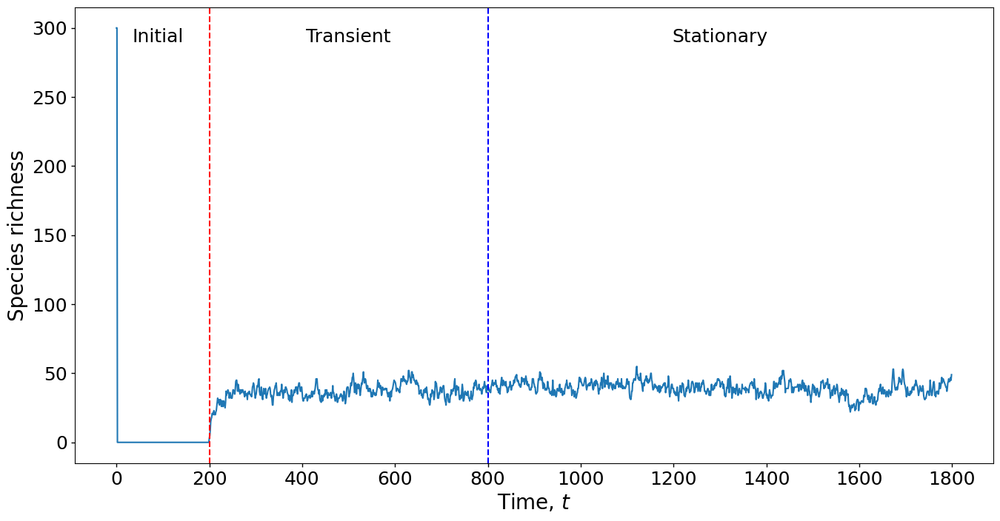

In [464]:
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called fina_df

richness=[]
for i in cp1.values():
    richness.append(len(i))
# Create a figure and axes
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the data from the column
ax.plot(richness)

# Define the positions of vertical lines
initial_line = 200
transient_line = 800
stationary_line = 1800

# Add vertical lines at the specified positions
ax.axvline(x=initial_line, color='red', linestyle='--')
ax.axvline(x=transient_line, color='blue', linestyle='--')
#ax.axvline(x=stationary_line, color='green', linestyle='--')

# Set x-axis ticks
ax.set_xticks(range(0, 1800 + 1, 200))

# Set labels for x-axis and y-axis
ax.set_xlabel('Time, $t$', fontsize=20)
ax.set_ylabel('Species richness', fontsize=20)

# Increase the font size of the tick labels
ax.tick_params(axis='both', labelsize=18)

# Bolden the tick labels
ax.xaxis.set_tick_params(which='both', width=1)
ax.yaxis.set_tick_params(which='both', width=1)

# Add text labels for the ranges
ax.text(90, max(richness), 'Initial', rotation=0, va='top', ha='center', fontsize=18)
ax.text((initial_line + transient_line) / 2, max(richness), 'Transient', rotation=0, va='top', ha='center', fontsize=18)
ax.text((transient_line + stationary_line) / 2,max(richness), 'Stationary', rotation=0, va='top', ha='center', fontsize=18)

# Save the plot as a PNG image
plt.savefig('local_com.png', dpi=900)


In [430]:
a=list(Intro.values())
b=list(ext.values())

In [453]:
abun = Abund[230]
Trait= trait[230]
print(abun)
print(Trait)

[0.1841, 0.0001, 0.3931, 0.4817, 0.0006, 0.0004, 0.0114, 0.0001, 0.0005, 0.0588, 0.0008, 0.4615, 0.0043, 0.0005, 0.0003, 0.0002, 0.0022, 0.001, 0.0009, 0.0002, 0.0019, 0.0, 0.0006, 0.0, 0.0002, 0.0002, 0.0001, 0.0, 0.0002, 0.0003, 0.0001, 0.0001, 0.0001, 0.0001, 0.0001]
[-0.6484706683264658, 9.052102773176244, -0.3176872385646945, 0.21591743417249987, -3.5268331929365004, -0.6115560951681935, -0.79046322725209, 8.848298351293742, 6.5634881741765305, 1.2948609649194065, 1.9965865907057445, 0.6684023737128051, -0.971684952235222, 5.599748932076592, 5.925897892351431, -8.8071014202439, 1.7987466808793418, 2.2398667584068974, -8.691788341758484, 2.189859621832152, -1.141077667988764, 1.5084347793264445, 2.4579941033786774, -5.35243814373608, 2.483319886274039, 7.282973674411831, -0.7538320365588103, -6.074807623003462, -2.00693082126417, -8.621245721008957, 9.812478131265628, -3.1561148555767087, -6.964247551147709, -5.079944659075155, -5.574074627364791]


In [454]:
len(abun)

35

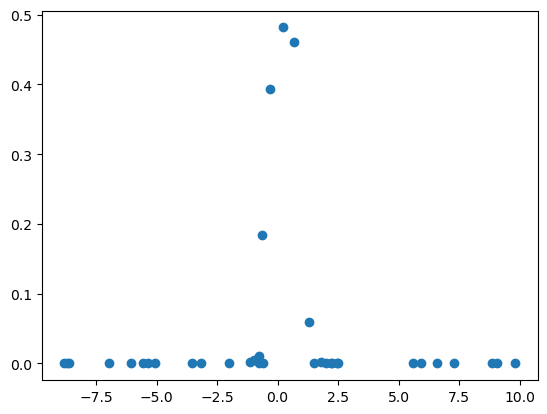

In [455]:
plt.scatter(Trait,abun)

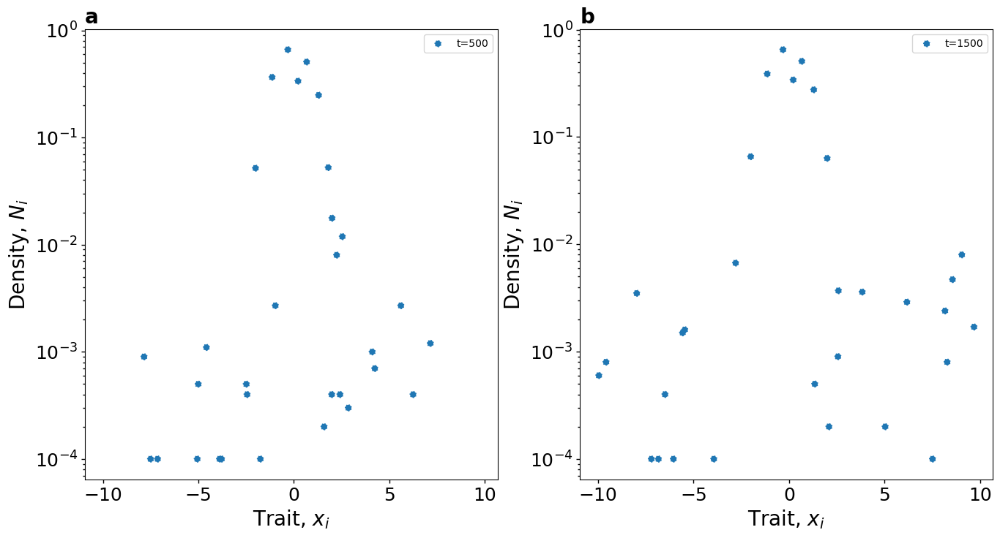

In [456]:
import matplotlib.pyplot as plt

# Create the figure with adjusted figsize
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 8), sharex=True, sharey='none')

# Plotting the column means
#scatter1 = axs[0].scatter(df_1['Eigen_mean'], df_1['Jaccard_lag1'], ls=":", marker="o", alpha=1, label='Jaccard Lag 1')
#scatter2 = axs[0].scatter(trait[250], Abund[250], ls=":", marker="o", alpha=1, label='t=250')
scatter3 = axs[0].scatter(trait[300], Abund[300], ls=":", marker="o", alpha=1, label='t=500')
#scatter4 = axs[0].scatter(trait[700], Abund[700], ls=":", marker="o", alpha=1, label='t=700')


axs[0].set_ylabel(r"Density, $N_i$", fontsize=20)
axs[0].set_xlabel(r'Trait, $x_i$', fontsize=20)
axs[0].tick_params(axis='both', labelsize=18)
axs[0].set_yscale('log')
axs[0].xaxis.set_tick_params(which='both', width=1)
axs[0].yaxis.set_tick_params(which='both', width=1)
axs[0].legend(loc='best')  # Add legend to subplot 0

# Plotting the column means
#scatter1 = axs[1].scatter(-1*df_1['Eigen_mean'], df_1['DeltaRAO1'], ls=":", marker="o", alpha=1, label='DeltaRAO lag 1')
#scatter2 = axs[1].scatter(trait[900], Abund[900], ls=":", marker="o", alpha=1, label='t=900')
scatter3 = axs[1].scatter(trait[1500], Abund[1500], ls=":", marker="o", alpha=1, label='t=1500')
#scatter4 = axs[1].scatter(trait[1799], Abund[1799], ls=":", marker="o", alpha=1, label='t=1800')


axs[1].set_ylabel(r"Density, $N_i$", fontsize=20)
axs[1].set_xlabel(r'Trait, $x_i$', fontsize=20)
axs[1].tick_params(axis='both', labelsize=18)
axs[1].set_yscale('log')
axs[1].xaxis.set_tick_params(which='both', width=1)
axs[1].yaxis.set_tick_params(which='both', width=1)
axs[1].legend(loc='best')  # Add legend to subplot 1

# Set titles for subplots
axs[0].set_title("a", fontsize=20,fontweight="bold",loc="left")
axs[1].set_title("b", fontsize=20,fontweight="bold",loc="left")

plt.show()

In [435]:
aij

{0: array([[1.00000000e+00, 1.34412626e+00, 1.72841386e+00, ...,
         1.03217038e-01, 8.96479154e-02, 5.95903552e-03],
        [2.20439418e+00, 1.00000000e+00, 1.01150303e+00, ...,
         3.44924665e-01, 3.08959966e-01, 3.37679510e-02],
        [6.08711353e-01, 2.17210922e-01, 1.00000000e+00, ...,
         3.02643342e-03, 2.46305870e-03, 5.73477929e-05],
        ...,
        [6.42470009e-01, 1.30911117e+00, 5.34895483e-02, ...,
         1.00000000e+00, 1.94673252e+00, 8.13156287e-01],
        [5.87102037e-01, 1.23374785e+00, 4.58020053e-02, ...,
         2.04822758e+00, 1.00000000e+00, 8.79193495e-01],
        [8.85867938e-02, 3.06089567e-01, 2.42072835e-03, ...,
         1.94207307e+00, 1.99574056e+00, 1.00000000e+00]]),
 1: array([[1.00000000e+00, 1.34412626e+00, 1.72841386e+00, ...,
         1.03217038e-01, 8.96479154e-02, 5.95903552e-03],
        [2.20439418e+00, 1.00000000e+00, 1.01150303e+00, ...,
         3.44924665e-01, 3.08959966e-01, 3.37679510e-02],
        [6.08711353

In [436]:
abun = Abund[800]
Trait= trait[800]
species_ID =cp1[800]
print(species_ID)
print(abun)
print(Trait)

[2827, 4562, 843, 776, 3613, 3601, 1946, 2689, 4995, 2032, 2071, 1280, 1963, 3126, 800, 3826, 4869, 2904, 3213, 3506, 4382, 4906, 2731, 3373, 699, 2485, 1298, 3928, 1063, 4128, 888, 2460, 522, 2995, 757]
[0.3469, 0.337, 0.7435, 0.001, 0.0028, 0.0071, 0.001, 0.0001, 0.0018, 0.0, 0.0083, 0.0016, 0.0032, 0.0004, 0.0016, 0.0006, 0.0003, 0.0004, 0.0001, 0.0004, 0.001, 0.0003, 0.0001, 0.0002, 0.0003, 0.0001, 0.0001, 0.0003, 0.0, 0.0001, 0.0, 0.0001, 0.0, 0.0001, 0.0001]
[1.2333873168311875, -0.8996761625011302, 0.19125242713677082, -5.999155095999493, -7.891057139137343, -8.860823666777936, -6.846030331437143, -4.777228170921162, 2.8589858652290054, 9.325676611976064, -4.3160031733626685, 8.103113064147632, -6.435495703864844, 2.1868875998707065, 2.945324983104223, -3.5196506676599064, -9.366253362897346, -7.086266774451115, -6.21326330214643, -9.450570268226592, -3.7112663357741305, -9.942791496861954, -5.5919180930390056, 9.870910160088734, 4.483040628704455, 7.154940928135108, -3.32809788

    Entry  Total Frequency
0    2827              600
1    4562              597
2     843              596
3     776              206
4    3613              188
5    3601              184
6    1946              129
7    2689               82
8    4995               68
9    2032               49
10   2071               43
11   1280               37
12   1963               53
13   3126               23
14    800               21
15   3826               19
16   4869               18
17   2904               20
18   3213               11
19   3506                7
20   4382               12
21   4906                5
22   2731               10
23   3373               12
24    699                9
25   2485                6
26   1298                5
27   3928                3
28   1063                2
29   4128                2
30    888                2
31   2460                2
32    522                6
33   2995                1
34    757               11


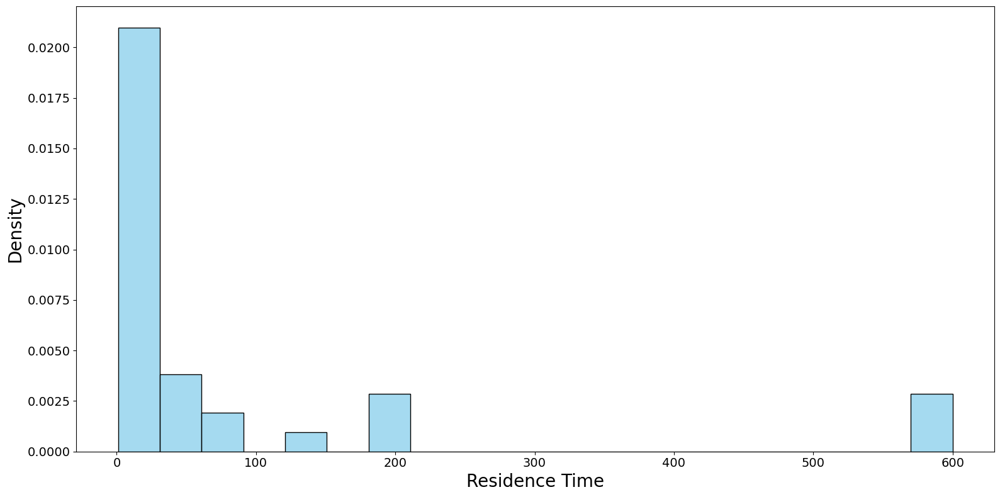

In [437]:
import pandas as pd
from itertools import islice

# Get the value list associated with the key "c"
value_list_c = cp1.get(800, [])
sliced_cp1 = dict(islice(cp1.items(),0,801))  # Slice the first 2 items
# Create an empty dictionary to store counts
counts = {}

# Iterate through the value list associated with key "c"
for entry in value_list_c:
    # Count the occurrences of each entry in all value lists
    count = sum(1 for value_list in sliced_cp1.values() if entry in value_list)
    
    # Store the count for the entry
    counts[entry] = count

# Convert the counts dictionary to a DataFrame
result_df = pd.DataFrame(list(counts.items()), columns=['Entry', 'Total Frequency'])

# Display the resulting DataFrame
print(result_df)

import seaborn as sns  # Import Seaborn for improved aesthetics

# Sample data (replace this with your actual data)
residence_times = result_df['Total Frequency']  # Your list or array containing residence times

# Set up Seaborn for improved aesthetics
#sns.set()

# Plot the histogram
plt.figure(figsize=(16, 8))
sns.histplot(residence_times, bins=20, kde=False, color='skyblue', stat='density', edgecolor='black')

# Set axis labels and adjust their font size
plt.xlabel("Residence Time", fontsize=20)
plt.ylabel("Density", fontsize=20)

# Increase the font size of axis ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set a title if needed
#plt.title('Distribution of Residence Times', fontsize=22)

plt.tight_layout()

    Entry  Total Frequency
0    2827             1599
1    4562             1596
2     843             1595
3    2168              925
4    1893              382
5     513              360
6     301              212
7    2268              160
8    4484              161
9     338               93
10    888               67
11   2889               65
12   3123               55
13    430               51
14   3612               41
15   4993               46
16   4393               30
17   1382               28
18   1506               27
19   3563               26
20    906               40
21   3390               32
22   1528               35
23   3331               32
24    772               17
25   4718               41
26   1754               50
27   4229                9
28   3996               64
29    530               20
30    366                5
31   3533               10
32   4722                5
33   2023                5
34   3899               21
35   2892                7
3

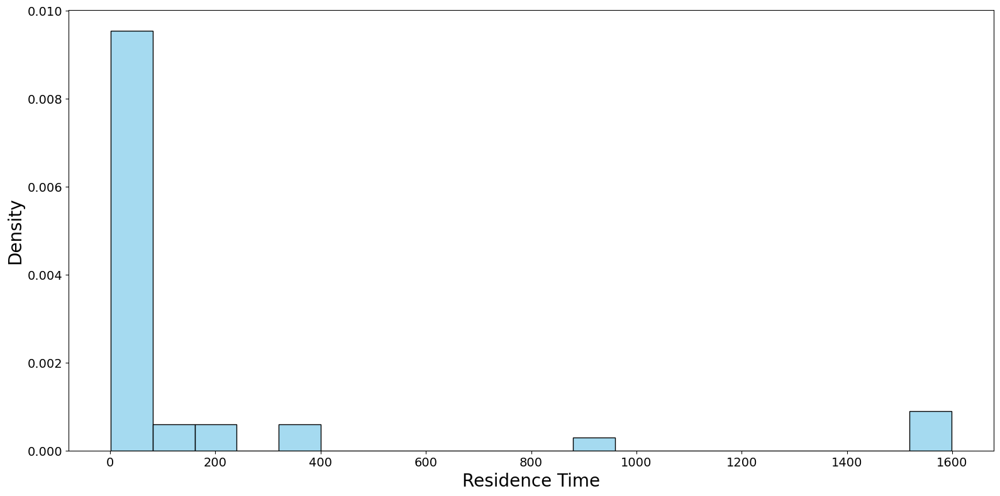

In [438]:
import pandas as pd


# Get the value list associated with the key "c"
value_list_c = cp1.get(1799, [])

# Create an empty dictionary to store counts
counts = {}

# Iterate through the value list associated with key "c"
for entry in value_list_c:
    # Count the occurrences of each entry in all value lists
    count = sum(1 for value_list in cp1.values() if entry in value_list)
    
    # Store the count for the entry
    counts[entry] = count

# Convert the counts dictionary to a DataFrame
result_df1 = pd.DataFrame(list(counts.items()), columns=['Entry', 'Total Frequency'])

# Display the resulting DataFrame
print(result_df1)

import seaborn as sns  # Import Seaborn for improved aesthetics

# Sample data (replace this with your actual data)
residence_times1 = result_df1['Total Frequency']  # Your list or array containing residence times

# Set up Seaborn for improved aesthetics
#sns.set()

# Plot the histogram
plt.figure(figsize=(16, 8))
sns.histplot(residence_times1, bins=20, kde=False, color='skyblue', stat='density', edgecolor='black')

# Set axis labels and adjust their font size
plt.xlabel("Residence Time", fontsize=20)
plt.ylabel("Density", fontsize=20)

# Increase the font size of axis ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set a title if needed
#plt.title('Distribution of Residence Times', fontsize=22)

plt.tight_layout()

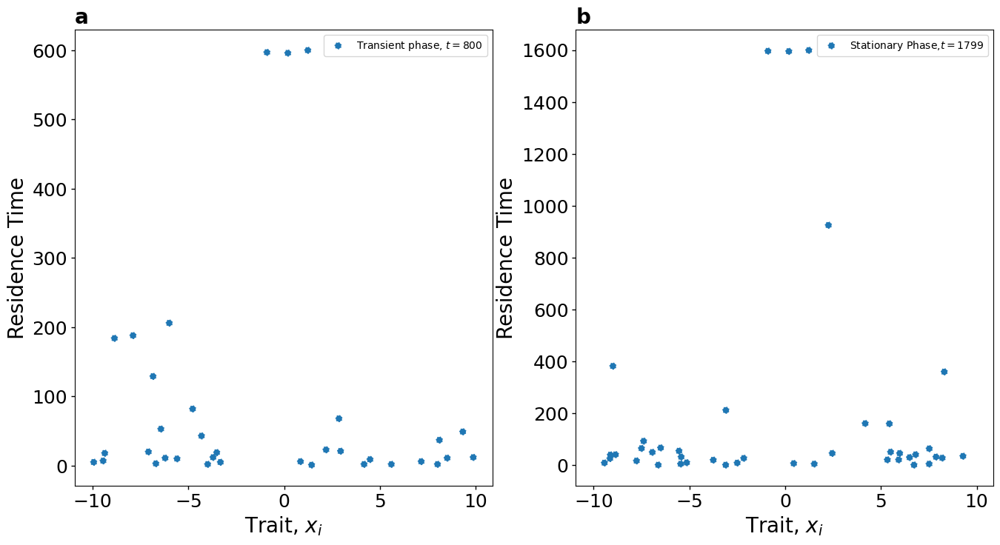

In [439]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 8), sharex=True, sharey='none')

# Plotting the column means
#scatter1 = axs[0].scatter(df_1['Eigen_mean'], df_1['Jaccard_lag1'], ls=":", marker="o", alpha=1, label='Jaccard Lag 1')
scatter2 = axs[0].scatter(trait[800][:len(residence_times)],residence_times, ls=":", marker="o", alpha=1, label=r'Transient phase, $t=800$')
#scatter3 = axs[0].scatter(trait[300], Abund[300], ls=":", marker="o", alpha=1, label='t=500')
#scatter4 = axs[0].scatter(trait[700], Abund[700], ls=":", marker="o", alpha=1, label='t=700')


axs[0].set_ylabel(r"Residence Time", fontsize=20)
axs[0].set_xlabel(r'Trait, $x_i$', fontsize=20)
axs[0].tick_params(axis='both', labelsize=18)
#axs[0].set_yscale('log')
axs[0].xaxis.set_tick_params(which='both', width=1)
axs[0].yaxis.set_tick_params(which='both', width=1)
axs[0].legend(loc='best')  # Add legend to subplot 0

# Plotting the column means
#scatter1 = axs[1].scatter(-1*df_1['Eigen_mean'], df_1['DeltaRAO1'], ls=":", marker="o", alpha=1, label='DeltaRAO lag 1')
scatter2 = axs[1].scatter(trait[1799][:len(residence_times1)],residence_times1, ls=":", marker="o", alpha=1, label=r'Stationary Phase,$t=1799$')
#scatter3 = axs[1].scatter(trait[1500], Abund[1500], ls=":", marker="o", alpha=1, label='t=1500')
#scatter4 = axs[1].scatter(trait[1799], Abund[1799], ls=":", marker="o", alpha=1, label='t=1800')


axs[1].set_ylabel(r"Residence Time", fontsize=20)
axs[1].set_xlabel(r'Trait, $x_i$', fontsize=20)
axs[1].tick_params(axis='both', labelsize=18)
#axs[1].set_yscale('log')
axs[1].xaxis.set_tick_params(which='both', width=1)
axs[1].yaxis.set_tick_params(which='both', width=1)
axs[1].legend(loc='best')  # Add legend to subplot 1

# Set titles for subplots
axs[0].set_title("a", fontsize=20,fontweight="bold",loc="left")
axs[1].set_title("b", fontsize=20,fontweight="bold",loc="left")

plt.show()

Text(0.0, 1.0, 'b')

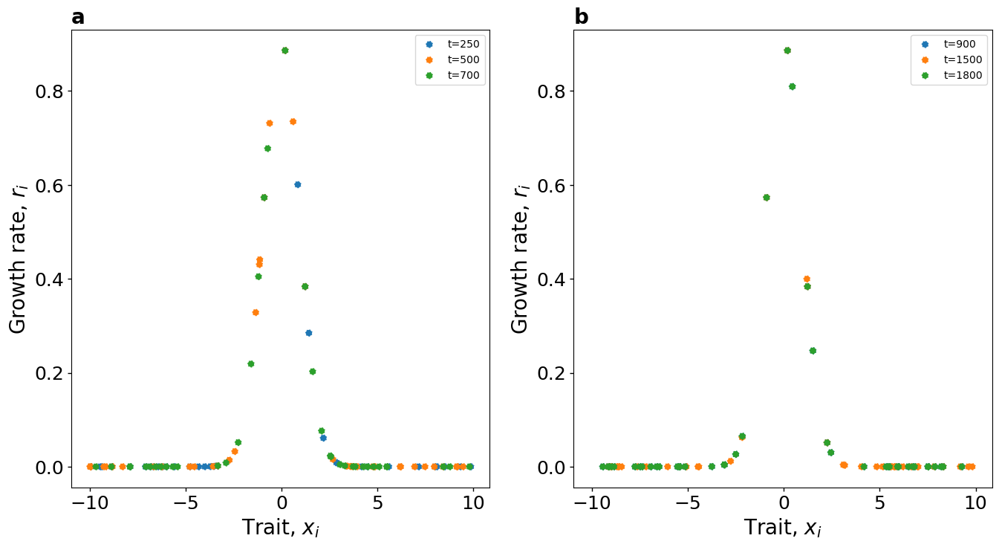

In [440]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 8), sharex=True, sharey='none')

# Plotting the column means
#scatter1 = axs[0].scatter(df_1['Eigen_mean'], df_1['Jaccard_lag1'], ls=":", marker="o", alpha=1, label='Jaccard Lag 1')
scatter2 = axs[0].scatter(trait[800],ri[800], ls=":", marker="o", alpha=1, label='t=250')
scatter3 = axs[0].scatter(trait[300], ri[300], ls=":", marker="o", alpha=1, label='t=500')
scatter4 = axs[0].scatter(trait[700], ri[700], ls=":", marker="o", alpha=1, label='t=700')


axs[0].set_ylabel(r"Growth rate, $r_i$", fontsize=20)
axs[0].set_xlabel(r'Trait, $x_i$', fontsize=20)
axs[0].tick_params(axis='both', labelsize=18)
#axs[0].set_yscale('log')
axs[0].xaxis.set_tick_params(which='both', width=1)
axs[0].yaxis.set_tick_params(which='both', width=1)
axs[0].legend(loc='best')  # Add legend to subplot 0

# Plotting the column means
#scatter1 = axs[1].scatter(-1*df_1['Eigen_mean'], df_1['DeltaRAO1'], ls=":", marker="o", alpha=1, label='DeltaRAO lag 1')
scatter2 = axs[1].scatter(trait[1799],ri[1799], ls=":", marker="o", alpha=1, label='t=900')
scatter3 = axs[1].scatter(trait[1500], ri[1500], ls=":", marker="o", alpha=1, label='t=1500')
scatter4 = axs[1].scatter(trait[1799], ri[1799], ls=":", marker="o", alpha=1, label='t=1800')


axs[1].set_ylabel(r"Growth rate, $r_i$", fontsize=20)
axs[1].set_xlabel(r'Trait, $x_i$', fontsize=20)
axs[1].tick_params(axis='both', labelsize=18)
#axs[1].set_yscale('log')
axs[1].xaxis.set_tick_params(which='both', width=1)
axs[1].yaxis.set_tick_params(which='both', width=1)
axs[1].legend(loc='best')  # Add legend to subplot 1

# Set titles for subplots
axs[0].set_title("a", fontsize=20,fontweight="bold",loc="left")
axs[1].set_title("b", fontsize=20,fontweight="bold",loc="left")


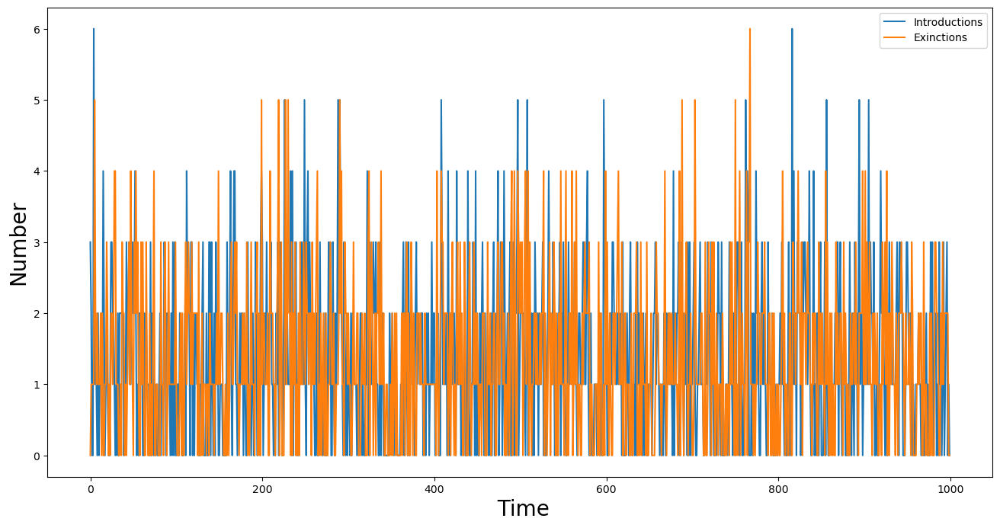

In [402]:
plt.figure(figsize=(16, 8))
plt.plot(a[800:],label='Introductions')
plt.plot(b[800:], label = 'Exinctions')
plt.xlabel(" Time", fontsize=20)
plt.ylabel("Number",fontsize=20)

plt.legend()
plt.show()

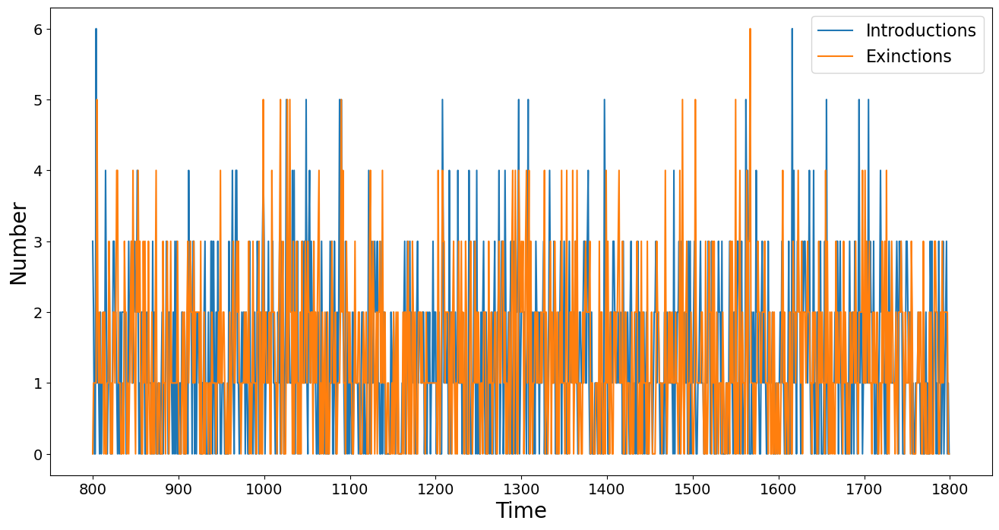

In [403]:
# Adjust the figure size
plt.figure(figsize=(16, 8))

# Plot the data
plt.plot(range(800, 1800), a[800:], label='Introductions')
plt.plot(range(800, 1800), b[800:], label='Exinctions')

# Set x-axis ticks and labels
plt.xticks(np.arange(800, 1801, step=100), fontsize=14)

# Set axis labels and adjust their font size
plt.xlabel("Time", fontsize=20)
plt.ylabel("Number", fontsize=20)

# Increase the font size of legend
plt.legend(fontsize=16)

# Increase the font size of axis ticks
plt.yticks(fontsize=14)

# Show the plot
plt.show()

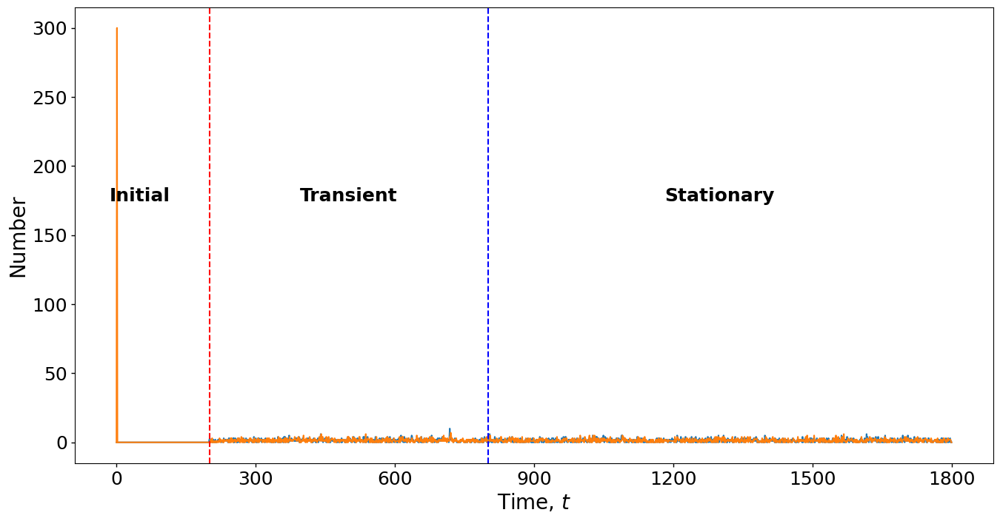

In [404]:
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called fina_df

# Create a figure and axes
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the data from the column
ax.plot(a)
ax.plot(b)

# Define the positions of vertical lines
initial_line = 200
transient_line = 800
stationary_line = 1800

# Add vertical lines at the specified positions
ax.axvline(x=initial_line, color='red', linestyle='--')
ax.axvline(x=transient_line, color='blue', linestyle='--')
#ax.axvline(x=stationary_line, color='green', linestyle='--')

# Set x-axis ticks
ax.set_xticks(range(0, 1800 + 1, 300))

# Set labels for x-axis and y-axis
ax.set_xlabel('Time, $t$', fontsize=20)
ax.set_ylabel('Number', fontsize=20)

# Increase the font size of the tick labels
ax.tick_params(axis='both', labelsize=18)

# Bolden the tick labels
ax.xaxis.set_tick_params(which='both', width=1)
ax.yaxis.set_tick_params(which='both', width=1)

# Add text labels for the ranges
ax.text(50, max(a)+175, 'Initial', rotation=0, va='top', ha='center', fontsize=18,fontweight='bold')
ax.text((initial_line + transient_line) / 2, max(a)+175, 'Transient', rotation=0, va='top', ha='center', fontsize=18,fontweight='bold')
ax.text((transient_line + stationary_line) / 2,max(a)+175, 'Stationary', rotation=0, va='top', ha='center', fontsize=18,fontweight='bold')

# Save the plot as a PNG image
plt.savefig('local_com.png', dpi=900)

In [405]:
cp =[]
for i in cp1.values():
    cp.append(len(i))

In [10]:
cp1

{0: [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99],
 1: [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,

In [406]:
from itertools import islice

sliced_dict = dict(islice(trait.items(),200,800))  # Slice the first 2 items
unique_values_set = set(value for sublist in sliced_dict.values() for value in sublist)

sliced_dict1 = dict(islice(trait.items(),800,None))  # Slice the first 2 items
unique_values_set1 = set(value for sublist in sliced_dict1.values() for value in sublist)



#print(sliced_dict)


In [407]:
abun = cp1[1790]
Trait= trait[1790]
print(len(abun))
print(len(Trait))

7
7


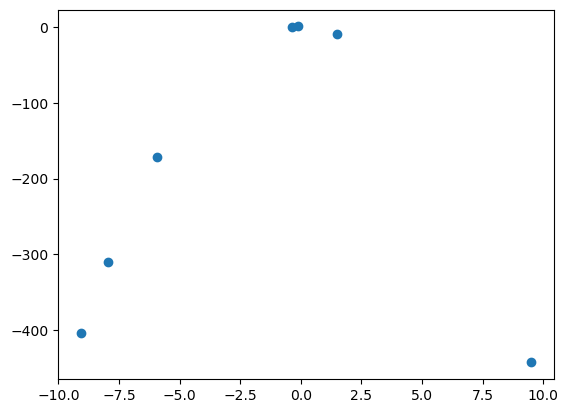

In [409]:
plt.scatter(trait[1790],ri[1790] )

In [410]:
rich_dict = dict(islice(cp1.items(),200,800))  # Slice the first 2 items
rich_dict1= dict(islice(cp1.items(),800,None))
#print(rich_dict)

In [441]:
import pandas as pd

# Create an empty dictionary to store total counts
total_counts = {}

# Iterate through each list in the dictionary
for value_list in rich_dict.values():
    # Flatten the lists and count occurrences using pandas Series
    counts = pd.Series(value_list).value_counts()
    
    # Update the total_counts dictionary
    for entry, count in counts.items():
        total_counts[entry] = total_counts.get(entry, 0) + count

# Convert the total_counts dictionary to a DataFrame
result_df = pd.DataFrame(list(total_counts.items()), columns=['Entry', 'Total Frequency'])

# Display the resulting DataFrame
print(result_df)

import pandas as pd

# Create an empty dictionary to store total counts
total_counts = {}

# Iterate through each list in the dictionary
for value_list in rich_dict1.values():
    # Flatten the lists and count occurrences using pandas Series
    counts = pd.Series(value_list).value_counts()
    
    # Update the total_counts dictionary
    for entry, count in counts.items():
        total_counts[entry] = total_counts.get(entry, 0) + count

# Convert the total_counts dictionary to a DataFrame
result_df1 = pd.DataFrame(list(total_counts.items()), columns=['Entry', 'Total Frequency'])

# Display the resulting DataFrame
print(result_df1)


      Entry  Total Frequency
0      4877                2
1      2067                6
2      4986                4
3      2455                6
4       687                4
...     ...              ...
1829   4790                2
1830   4796                2
1831   1271                1
1832   3407                1
1833   2314                1

[1834 rows x 2 columns]
      Entry  Total Frequency
0      3045             1000
1      4790                5
2      1271                7
3      3407                1
4      2314                1
...     ...              ...
2645   4775                2
2646   1890                2
2647    953                1
2648   4541                1
2649    880                1

[2650 rows x 2 columns]


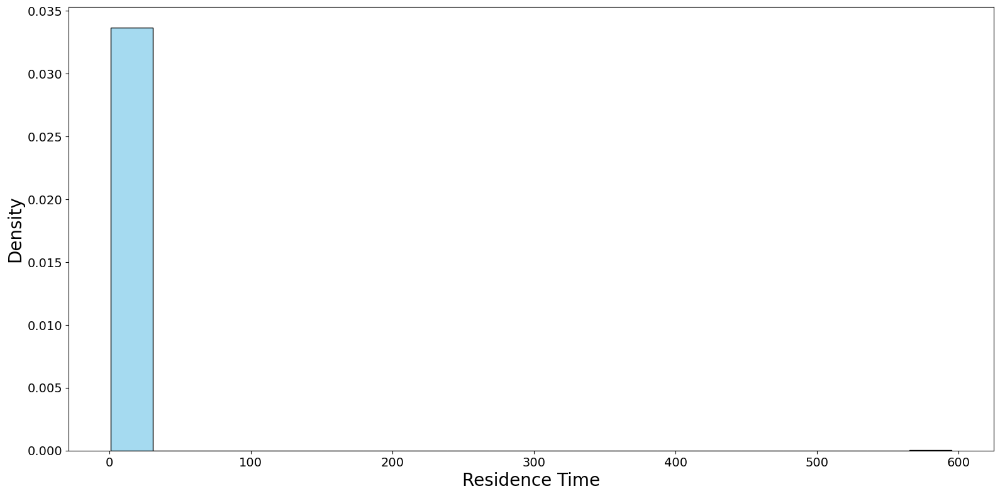

In [442]:
import seaborn as sns  # Import Seaborn for improved aesthetics

# Sample data (replace this with your actual data)
residence_times = result_df['Total Frequency']  # Your list or array containing residence times

# Set up Seaborn for improved aesthetics
#sns.set()

# Plot the histogram
plt.figure(figsize=(16, 8))
sns.histplot(residence_times, bins=20, kde=False, color='skyblue', stat='density', edgecolor='black')

# Set axis labels and adjust their font size
plt.xlabel("Residence Time", fontsize=20)
plt.ylabel("Density", fontsize=20)

# Increase the font size of axis ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set a title if needed
#plt.title('Distribution of Residence Times', fontsize=22)

plt.tight_layout()

In [413]:
len(residence_times)

1834

In [414]:
len(list(unique_values_set))

2340

In [415]:

# Get the value list associated with the key "c"
value_list_c = cp1.get(1500, [])
len(value_list_c)


10

In [416]:
len(counts)

8

In [417]:
len(cp1[1500])

10

In [418]:
len(trait[1500])

10

In [420]:
#plt.scatter(trait[1500][:len(residence_times)],residence_times)

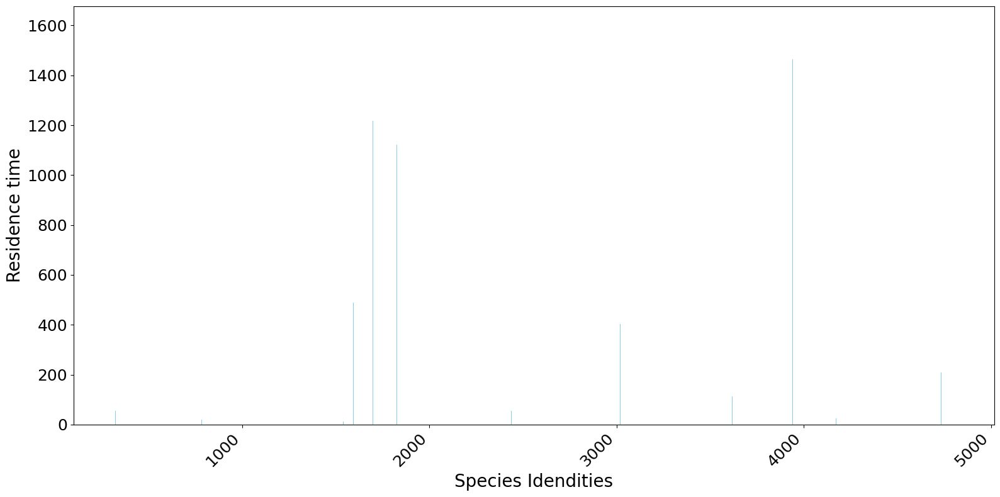

In [187]:
# Plot the frequency distribution
plt.figure(figsize=(16,8))
plt.bar(result_df['Entry'], result_df['Total Frequency'], color='skyblue',alpha=1)


# Set axis labels and adjust their font size
plt.xlabel("Species Idendities", fontsize=20)
plt.ylabel("Residence time", fontsize=20)

# Increase the font size of legend
plt.xticks(fontsize=18)

# Increase the font size of axis ticks
plt.yticks(fontsize=18)
#plt.title('Frequency Distribution Plot')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

In [39]:
a=0.045*10000**(2/3)
s1= [a*s for s in sp_limit4 ]
s2= [a*s for s in sp_limit5 ]
s3= [a*s for s in sp_limit6 ]

In [6]:
with open('f1ss', 'wb') as f:
    pickle.dump(cp1_,f)
with open('f2ss', 'wb') as f:
    pickle.dump(intr,f)

In [7]:
with open('f1ss', 'rb') as f:
    sp = pickle.load(f)

In [444]:
#richness

In [154]:
len(sp_limit5)

1600

# Mukhtar Please run the following code for me.

# Deterministic

In [4]:
def RAO_(list_1, list_2):
    # RAO
    differences = []
    proportions = []

    sum_list_1 = sum(list_1)
    sum_list_2 = sum(list_2)

    for i in range(len(list_1)):
        for j in range(i + 1, len(list_1)):
            diff = list_1[j] - list_1[i]
            differences.append(diff ** 2)
            proportion_i = list_2[i] / sum_list_2
            proportion_j = list_2[j] / sum_list_2
            proportions.append(proportion_i * proportion_j)

    result = sum([diff * prop for diff, prop in zip(differences, proportions)])
    return result


In [30]:
import time

# start the timer
start_time = time.time()

rich_det = []
mean_rich_det = []
Abund1_det=[]
# sigmar 
aij1_det = []
#sigmar.append()
ri1_det = []
Intro1_det = []
trai1_det=[]
# Define a list of different beta values
# Generate a list of 10 random numbers between -1 and 1
beta_numbers_det = [0.3, 0.4, 0.6, 0.8,-0.078, -0.11, -0.01, 0.15, 0.93]
print(beta_numbers_det)

#overall
Richness_det = {}
Shan_det = {}
Shn_1_det = {}
Simp_det = {}
Abund2_det ={}
Stab1_det ={}
Stab2_det = {}
Current_sp_det = {}
Current_sp_var_det = {}
Trait_var_det ={}
trait_mean_det ={}
Aij_det ={}
Aij_var_det={}
Ri_det ={}
Ri_var_det={}
Introd_det={}
Jaccard_lag1_det={}
Jaccard_lag5_det={}
Jaccard_lag10_det={}
Jaccard_lag50_det={}
Jaccard_lag100_det={}
Jaccard_lag1000_det={}
DeltaRAO1_det={}
DeltaRAO5_det={}
DeltaRAO10_det={}
DeltaRAO50_det={}
DeltaRAO100_det={}
DeltaRAO1000_det={}
RAO_mean_det ={}
cp1_det={}
intr_det={}

abund_det = {}
Trait_det={}

Eigen_mean_det={}
Eigen_var_det={}
n,start,N_iter,n_iterations =300, 200, 1800, 1000
J=10000
for combination in beta_numbers_det:
     #species abundances
    sp_dict_det={}
    
    # structural stability limity
    sp_limit_det=[]
    sp_limit1_det=[]
    sp_limit2_det=[]
    sp_limit3_det=[]
    sp_limit4_det=[]
    sp_limit5_det=[]
    sp_limit6_det=[]
    
    #species richness
    cp1_det={}
    #species traits
    trait_det={}
    # list of species abundaces
    sp1_det=[]
    Abund_det={}
    # sigmar 
    aij_det = {}
    #sigmar.append()
    ri_det = {}
    Intro_det = {}
    ext_det={}
    RAO_det = {}
    #initial number of species  
    eig_det =[]
    H0_det = []
    H1_det=[]
    H2_det = []
    #nj = list(np.random.randint(5,20,200))
    current_species_det=list(np.arange(0,n,1))
    #print('current_species',len(current_species))
    old_n_det = list(np.random.uniform(1,3,n))
    #print('old_n',len(old_n))
    xi_det=np.random.uniform(-10,10,n) # x trait value
    current_xi_det =[var for j,var in enumerate(xi_det) if j in current_species_det]
    #print('current_s',len(nJ))
    sigmar=Combination[0]
    sigma = Combination[1]
    lam = Combination[2]
    for i in range(0,start):
        if i==0:

            cp1_det[i]=current_species_det
            trait_det[i]=current_xi_det
            aij_det[i]= A_res_mut(current_xi_det,sigma,combination)
            ri_det[i]= r_kennel(current_xi_det,sigmar)
            Intro_det[i] = 0
            ext_det[i]=0
            sp1_det.append(list(old_n_det))
            d_det = dict(zip(current_species_det,old_n_det))
            sp_dict_det[i] = d_det
            Abund_det[i]=list(old_n_det)
            # Function for calculating expectation
            expect_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma, combination))[0]
            var_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma,combination))[1]
            #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
            s_starv2_det = (1-expect_det)**2/(var_det)
            #sp_limit.append(s_starv1)
            sp_limit1_det.append(s_starv2_det)
            #RAO
            RAO_det[i] = RAO_(current_xi_det, old_n_det)

            #print(np.array(new_n))
            # Calculate Hill numbers for q = 0, 1, and 2
            h0_det = hill_number(np.array(old_n_det), 0)
            h1_det = hill_number(np.array(old_n_det), 1.001)
            h2_det = hill_number(np.array(old_n_det), 2)

            H0_det.append(h0_det)
            H1_det.append(h1_det)
            H2_det.append(h2_det)
            
            
            if len(list(A_res_mut(current_xi_det, sigma,combination))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration_det = power_iteration(A_res_mut(current_xi_det, sigma,combination))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real_det = max_eigenvalue_iteration_det.real

                eig_det.append(max_eigenvalue_iteration_real_det)

            else:
                eig_det.append(0)
        else:
            #print(old_n)
            #print('l',r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n)
            #print('e',np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
            #print('lam',lambdas)
            new_n_det= old_n_det*np.exp(r_kennel(current_xi_det,sigmar)-A_res_mut(current_xi_det,sigma,combination)@old_n_det)
            #print(new_n)
            #print('d',d)
            cp1_det[i]=current_species_det
            trait_det[i]=current_xi_det
            aij_det[i]= A_res_mut(current_xi_det,sigma,combination)
            ri_det[i]= r_kennel(current_xi_det,sigmar)
            Intro_det[i] = 0
            Abund_det[i]=list(new_n_det)
            sp1_det.append(list(new_n_det))
            d_det = dict(zip(current_species_det,new_n_det))
            sp_dict_det[i] = d_det
            # Identify extinct species
            remove_det = np.where(np.array(new_n_det) <= 0.00001)[0]

            # Record the length (number) of extinct species
            num_extinct_det = len(remove_det)
            #print(type(remove))
            ext_det[i]=num_extinct_det
            keep_det=np.where(new_n_det>0.00001)
            #current_spec_det= list(np.array(current_species_det)[keep_det])
            #print(current_spec)
            current_species_det= list(np.array(current_species_det)[keep_det])
            #print('current_species',current_species)
            new_n_det = list(np.array(new_n_det)[keep_det])
            #print('new_n',len(new_n))
            current_xi_det= list(np.array(current_xi_det)[keep_det])
            #nJ=[var for j,var in enumerate(nJ) if j not in remove]
            #print('current_xtrait',len(current_xtrait))
            old_n_det = list(new_n_det) 

            # Function for calculating expectation
            expect_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma,combination))[0]
            var_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma,combination))[1]
            #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
            s_starv2_det = (1-expect_det)**2/(var_det)
            #sp_limit.append(s_starv1)
            sp_limit1_det.append(s_starv2_det)
            print("current_xi",len(current_xi_det))
            print("nw_ni",len(new_n_det))


            #RAO
            RAO_det[i] = RAO_(current_xi_det, new_n_det)

            #print(np.array(new_n))
            # Calculate Hill numbers for q = 0, 1, and 2
            h0_det = hill_number(np.array(new_n_det), 0)
            h1_det = hill_number(np.array(new_n_det), 1.001)
            h2_det = hill_number(np.array(new_n_det), 2)

            H0_det.append(h0_det)
            H1_det.append(h1_det)
            H2_det.append(h2_det)
        
            if len(list(A_res_mut(current_xi_det, sigma,combination))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration_det = power_iteration(A_res_mut(current_xi_det, sigma,combination))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real_det = max_eigenvalue_iteration_det.real

                eig_det.append(max_eigenvalue_iteration_real_det)

            else:
                eig_det.append(0)           

    for i in range(start,N_iter):
        #print(old_n)
        #print('l',r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n)
        #print('e',np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
        #lambdas= J*(old_n*np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
        #print(lambdas)
        new_n_det=  old_n_det*np.exp(r_kennel(current_xi_det,sigmar)-A_res_mut(current_xi_det,sigma,combination)@old_n_det)
        #np.random.poisson(lambdas, len(current_species))/J
        #print(new_n)
        #adding new species
        num_det=np.random.poisson(lam, size=None)
        #print(num)
        new_n_det= list(new_n_det) + list(np.full((num_det,),0.1))
        # Sample unique numbers
        unique_numbers_det = random.sample(range(301, 5000), num_det)
        # Extend the current_species list with unique_numbers
        current_species_det.extend(unique_numbers_det)

        #print('current_species',len(current_species))
        current_xi_det=current_xi_det+list(np.random.uniform(-20,20,num_det))
        #print('current_xi',len(current_xi))
        d_det = dict(zip(current_species_det,new_n_det))
        sp_dict_det[i] = d_det
        cp1_det[i]=current_species_det
        trait_det[i]=current_xi_det
        aij_det[i]= A_res_mut(current_xi_det,sigma,combination)
        ri_det[i]= r_kennel(current_xi_det,sigmar)
        Intro_det[i] = num_det
        sp1_det.append(list(new_n_det))
        Abund_det[i]=list(new_n_det)
        # Identify extinct species
        remove_det = np.where(np.array(new_n_det) <= 0.00001)[0]

        # Record the length (number) of extinct species
        num_extinct_det = len(remove_det)
        #print(remove)
        ext_det[i]=num_extinct_det
        keep_det=np.where(np.array(new_n_det)>0.00001)
        #print(keep)
        current_species_det= list(np.array(current_species_det)[keep_det])
        #print(current_spec)
        #current_spec= list(np.array(current_spec)[keep])

        new_n_det = list(np.array(new_n_det)[keep_det])
        #print('new_n',len(new_n))
        current_xi_det=list(np.array(current_xi_det)[keep_det])
        #print('current_xtrait',(len(current_xi)))
        #nJ =[var for j,var in enumerate(nJ) if j not in remove]

        old_n_det =  list(new_n_det) #list(new_n) + list(np.full((num,),60) )#random.sample(range(0,80),num)
        #print(len(old_n))
        #current_species= current_species + random.sample(range(10000,40000),num)
        #current_xi=current_xi+list(np.random.uniform(-1,1,num))


        # Function for calculating expectation
        mean_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma,combination))[0]
        #print('m=',mean)
        var_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma,combination))[1]
        #print('v=',var)
        s_starv1_det = np.exp(num_det)*(1-mean_det)**2/(var_det)
        #print('s1=', s_starv1)
        s_starv2_det = (1-mean_det)**2/(var_det)
        
        s_starv3_det = num_det*(1-mean_det)**2/(var_det)
        
        s_starv4_det = np.mean(r_kennel(current_xi_det,sigmar))*num_det*(1-mean_det)**2/(var_det)
        
        s_starv5_det = (np.mean(r_kennel(current_xi_det,sigmar))*(num_det**0.5)*((1-mean_det)**2/var_det))**0.75
        s_starv6_det = ((np.mean(r_kennel(current_xi_det,sigmar))*(num_det**0.5)*(1-mean_det)**2/(var_det)))**(2/3)
        s_starv7_det = (np.mean(r_kennel(current_xi_det,sigmar))*(num_det**(3/2))*(1-mean_det)**2/(var_det))**0.5
        #print('s2=', s_starv2)
        sp_limit_det.append(s_starv1_det)
        sp_limit1_det.append(s_starv2_det)
        sp_limit2_det.append(s_starv3_det)
        sp_limit3_det.append(s_starv4_det)
        sp_limit4_det.append(s_starv5_det)
        sp_limit5_det.append(s_starv6_det)
        sp_limit6_det.append(s_starv7_det)
        
        print("current_xi",len(current_xi_det))
        print("nw_ni",len(new_n_det))

        #RAO
        RAO_det[i] = RAO_(current_xi_det, new_n_det)

         #RAO
        #RAO_det[i] = RAO_(current_xi_det, new_n_det)

        #print(np.array(new_n))
        # Calculate Hill numbers for q = 0, 1, and 2
        h0_det = hill_number(np.array(new_n_det), 0)
        h1_det = hill_number(np.array(new_n_det), 1.001)
        h2_det = hill_number(np.array(new_n_det), 2)

        H0_det.append(h0_det)
        H1_det.append(h1_det)
        H2_det.append(h2_det)

        if len(list(A_res_mut(current_xi_det, sigma,combination))) != 0:
            # Calculate the eigenvalue using power iteration method
            max_eigenvalue_iteration_det = power_iteration(A_res_mut(current_xi_det, sigma,combination))

            # Store the real part of the maximum eigenvalue
            max_eigenvalue_iteration_real_det = max_eigenvalue_iteration_det.real

            eig_det.append(max_eigenvalue_iteration_real_det)

        else:
            eig_det.append(0)           


    abund_det[combination]=sp_dict_det
    Trait_det[combination]=trait_det
    Shan_det = {}
    Shn_1_det = {}
    Simp_det = {}
    Abund2_det ={}
    Stab1_det ={}
    Stab1_var_det ={}
    Stab2_det = {}
    Stab2_var_det = {}
    Stab3_det = {}
    Stab3_var_det = {}
    Stab4_det = {}
    Stab4_var_det = {}
    Stab5_det = {}
    Stab6_det = {}
    Stab7_det = {}
    Stab5_var_det = {}
    Current_sp_det = {}
    Current_sp_var_det = {}
    Trait_var_det = {}
    trait_mean_det = {}
    Aij_det = {}
    Aij_var_det = {}
    Ri_det = {}
    Ri_var_det = {}
    Introd_det = {}
    Introd_var_det ={}
    Jaccard_lag1_det={}
    Jaccard_lag5_det={}
    Jaccard_lag10_det={}
    Jaccard_lag50_det={}
    Jaccard_lag100_det={}
    Jaccard_lag200_det={}
    DeltaRAO1_det={}
    DeltaRAO5_det={}
    DeltaRAO10_det={}
    DeltaRAO50_det={}
    DeltaRAO100_det={}
    DeltaRAO200_det={}
    RAO_mean_det ={}
    RAO_var_det ={}
    Eigen_mean_det={}
    Eigen_var_det={}
    ##_________________________________________________________________
    Introd_det[combination] = introduction_rate_mean(Intro_det,n_iterations)[0]
    Introd_var_det[combination] = introduction_rate_mean(Intro_det,n_iterations)[1]

    #RAO_mean
    RAO_mean_det[combination]= RAO_mean_(RAO_det,n_iterations)[0]
    RAO_var_det[combination]= RAO_mean_(RAO_det,n_iterations)[1]
    #Function turnover
    DeltaRAO1_det[combination] = functional_turnover(RAO_det, 1,n_iterations)
    DeltaRAO5_det[combination] = functional_turnover(RAO_det, 5,n_iterations)
    DeltaRAO10_det[combination] = functional_turnover(RAO_det, 10,n_iterations)
    DeltaRAO50_det[combination] = functional_turnover(RAO_det, 50,n_iterations)
    DeltaRAO100_det[combination] = functional_turnover(RAO_det, 100,n_iterations)
    DeltaRAO200_det[combination] = functional_turnover(RAO_det, 200,n_iterations)

    rich_var_count_det = {inner_key: len(inner_value) for inner_key, inner_value in cp1_det.items()}
    rich_var_count_values_det = list(rich_var_count_det.values())[-n_iterations:]
    rmean_det = sum(rich_var_count_values_det) / len(rich_var_count_values_det) if len(rich_var_count_values_det) != 0 else 0
    variance_det = sum((x - rmean_det) ** 2 for x in rich_var_count_values_det) / len(rich_var_count_values_det) if len(rich_var_count_values_det) != 0 else 0
    Current_sp_var_det[combination] = variance_det

    #Richness
    rich_count_det = {inner_key: len(inner_value) for inner_key, inner_value in cp1_det.items()}
    last_counts_det = list(rich_count_det.values())[-n_iterations:]
    rmean_det = sum(last_counts_det) / len(last_counts_det) if len(last_counts_det) != 0 else 0
    Current_sp_det[combination] = rmean_det

    #Mean Shannon Entropy
    H_shan_det = [math.log(x) for x in H1_det]
    sha_mean_det = sum(H_shan_det[-n_iterations:]) / len(H_shan_det[-n_iterations:]) if len(H_shan_det[-n_iterations:]) != 0 else 0 
    Shan_det[combination] = sha_mean_det

    #Mean Simpson Entropy
    Simpson_det=np.power(H2_det,-1)
    if len(Simpson_det[-n_iterations:])!= 0:
        shi_mean_det = sum(Simpson_det[-n_iterations:])/len(Simpson_det[-n_iterations:])
    else:
        shi_mean_det = 0 
    Simp_det[combination] =shi_mean_det
    #___________________________________________________________________________
    #eig_mean = sum(eig[-n_iterations:]) / len(eig[-n_iterations:]) if len(eig[-n_iterations:]) != 0 else 0 
    #Eigen_mean[combination] = eig_mean
    # eigenvalues
    
    if len(sp_limit_det[-n_iterations:]) != 0:
        eig_mean_det= statistics.mean(eig_det[-n_iterations:])
        eig_variance_det = statistics.variance(eig_det[-n_iterations:])
    else:
        eig_mean_det = 0
        eig_variance_det = 0

    Eigen_mean_det[combination] = eig_mean_det
    Eigen_var_det[combination]=eig_variance_det
    #____________________________________________________________________
    # S_star with Introduction rate
    
    if len(sp_limit_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab1_det[combination] = st1_mean_det
    Stab1_var_det[combination]=st1_variance_det

    #_____________________________________________________
    if len(sp_limit1_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit1_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit1_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab2_det[combination] = st1_mean_det
    Stab2_var_det[combination]=st1_variance_det
    #______________________________________
    if len(sp_limit2_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit2_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit2_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab3_det[combination] = st1_mean_det
    Stab3_var_det[combination]=st1_variance_det
    #_____________________________________________________
    if len(sp_limit3_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit3_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit3_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab4_det[combination] = st1_mean_det
    Stab4_var_det[combination]=st1_variance_det
    #________________________________________________________________
    
    if len(sp_limit4_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit4_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit4_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab5_det[combination] = st1_mean_det
    Stab5_var_det[combination]=st1_variance_det
    #________________________________________
    if len(sp_limit5_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit5_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit5_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab6_det[combination] = st1_mean_det
    #Stab5_var[combination]=st1_variance
    #______________________________________________
    if len(sp_limit6_det[-n_iterations:]) != 0:
        st1_mean_det = statistics.mean(sp_limit6_det[-n_iterations:])
        st1_variance_det = statistics.variance(sp_limit6_det[-n_iterations:])
    else:
        st1_mean_det = 0
        st1_variance_det = 0

    Stab7_det[combination] = st1_mean_det
    #Stab5_var[combination]=st1_variance

    #variance of traits
    Trait_var_det[combination] = trait_var(trait_det,n_iterations)

    # mean of traits
    trait_mean_det[combination] = trait_mean_(trait_det,n_iterations)

    #mean of abundances
    Abund2_det[combination] = mean_abundances(sp_dict_det,n_iterations)

    # Calculate the mean of the arrays in each inner dict
    Aij_det[combination] = mean_inter_strength(aij_det,n_iterations)

    #variance of interaction strength
    Aij_var_det[combination] = var_inter_str(aij_det,n_iterations)

    #Intrinsic growth rate
    Ri_det[combination] = growth_rate_mean(ri_det,n_iterations)

    Ri_var_det[combination] = growth_rate_var(ri_det,n_iterations)

    #Jaccard_mean
    Jaccard_lag1_det[combination] = Jaccard_mean(cp1_det, 1, n_iterations)
    Jaccard_lag5_det[combination] = Jaccard_mean(cp1_det, 5, n_iterations)
    Jaccard_lag10_det[combination] = Jaccard_mean(cp1_det, 10, n_iterations)
    Jaccard_lag50_det[combination] = Jaccard_mean(cp1_det, 50, n_iterations)
    Jaccard_lag100_det[combination] = Jaccard_mean(cp1_det, 100, n_iterations)
    Jaccard_lag200_det[combination] = Jaccard_mean(cp1_det, 200, n_iterations)
      # Save
    rich_det.append(cp1_det)
    mean_rich_det.append(Current_sp_det)
    Abund1_det.append(Abund_det)
    # sigmar 
    aij1_det.append(aij_det)
    #sigmar.append()
    ri1_det.append(ri_det)
    Intro1_det.append(Intro_det)
    trai1_det.append(trait_det)


    import pickle

    # Save the list to a file
    with open(f'rich_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(rich_det, f)    
    # Save the list to a file
    with open(f'mean_rich_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(mean_rich_det, f)   
    # Save the list to a file
    with open(f'Abund1_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(Abund1_det, f)   
    # Save the list to a file
    with open(f'aij1_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(aij1_det, f)   
    # Save the list to a file
    with open(f'ri1_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(ri1_det, f)   
    # Save the list to a file
    with open(f'Intro1_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(Intro1_det, f)   
    # Save the list to a file
    with open(f'trai1_det_2{combination}.pkl', 'wb') as f:
        pickle.dump(trai1_det, f)  


    
# stop the timer
end_time = time.time()

# calculate the elapsed time
elapsed_time = end_time - start_time

# print the elapsed time in seconds
print("Elapsed time:", elapsed_time, "seconds")
   

[0.3, 0.4, 0.6, 0.8, -0.078, -0.11, -0.01, 0.15, 0.93]
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
cu

current_xi 346
nw_ni 346
current_xi 349
nw_ni 349
current_xi 351
nw_ni 351
current_xi 349
nw_ni 349
current_xi 352
nw_ni 352
current_xi 353
nw_ni 353
current_xi 356
nw_ni 356
current_xi 355
nw_ni 355
current_xi 357
nw_ni 357
current_xi 359
nw_ni 359
current_xi 362
nw_ni 362
current_xi 361
nw_ni 361
current_xi 362
nw_ni 362
current_xi 359
nw_ni 359
current_xi 358
nw_ni 358
current_xi 359
nw_ni 359
current_xi 360
nw_ni 360
current_xi 363
nw_ni 363
current_xi 365
nw_ni 365
current_xi 364
nw_ni 364
current_xi 364
nw_ni 364
current_xi 364
nw_ni 364
current_xi 362
nw_ni 362
current_xi 363
nw_ni 363
current_xi 365
nw_ni 365
current_xi 363
nw_ni 363
current_xi 368
nw_ni 368
current_xi 365
nw_ni 365
current_xi 365
nw_ni 365
current_xi 365
nw_ni 365
current_xi 365
nw_ni 365
current_xi 369
nw_ni 369
current_xi 365
nw_ni 365
current_xi 366
nw_ni 366
current_xi 364
nw_ni 364
current_xi 365
nw_ni 365
current_xi 368
nw_ni 368
current_xi 371
nw_ni 371
current_xi 369
nw_ni 369
current_xi 370
nw_ni 370


current_xi 390
nw_ni 390
current_xi 384
nw_ni 384
current_xi 385
nw_ni 385
current_xi 381
nw_ni 381
current_xi 382
nw_ni 382
current_xi 380
nw_ni 380
current_xi 378
nw_ni 378
current_xi 379
nw_ni 379
current_xi 381
nw_ni 381
current_xi 380
nw_ni 380
current_xi 381
nw_ni 381
current_xi 380
nw_ni 380
current_xi 377
nw_ni 377
current_xi 380
nw_ni 380
current_xi 376
nw_ni 376
current_xi 373
nw_ni 373
current_xi 373
nw_ni 373
current_xi 372
nw_ni 372
current_xi 376
nw_ni 376
current_xi 375
nw_ni 375
current_xi 377
nw_ni 377
current_xi 373
nw_ni 373
current_xi 368
nw_ni 368
current_xi 369
nw_ni 369
current_xi 365
nw_ni 365
current_xi 364
nw_ni 364
current_xi 366
nw_ni 366
current_xi 364
nw_ni 364
current_xi 364
nw_ni 364
current_xi 366
nw_ni 366
current_xi 365
nw_ni 365
current_xi 368
nw_ni 368
current_xi 367
nw_ni 367
current_xi 368
nw_ni 368
current_xi 364
nw_ni 364
current_xi 367
nw_ni 367
current_xi 369
nw_ni 369
current_xi 373
nw_ni 373
current_xi 375
nw_ni 375
current_xi 373
nw_ni 373


current_xi 381
nw_ni 381
current_xi 380
nw_ni 380
current_xi 378
nw_ni 378
current_xi 379
nw_ni 379
current_xi 379
nw_ni 379
current_xi 378
nw_ni 378
current_xi 379
nw_ni 379
current_xi 379
nw_ni 379
current_xi 381
nw_ni 381
current_xi 380
nw_ni 380
current_xi 382
nw_ni 382
current_xi 384
nw_ni 384
current_xi 388
nw_ni 388
current_xi 385
nw_ni 385
current_xi 387
nw_ni 387
current_xi 381
nw_ni 381
current_xi 381
nw_ni 381
current_xi 378
nw_ni 378
current_xi 377
nw_ni 377
current_xi 375
nw_ni 375
current_xi 379
nw_ni 379
current_xi 377
nw_ni 377
current_xi 374
nw_ni 374
current_xi 375
nw_ni 375
current_xi 373
nw_ni 373
current_xi 376
nw_ni 376
current_xi 375
nw_ni 375
current_xi 376
nw_ni 376
current_xi 377
nw_ni 377
current_xi 377
nw_ni 377
current_xi 380
nw_ni 380
current_xi 380
nw_ni 380
current_xi 379
nw_ni 379
current_xi 380
nw_ni 380
current_xi 379
nw_ni 379
current_xi 380
nw_ni 380
current_xi 380
nw_ni 380
current_xi 385
nw_ni 385
current_xi 380
nw_ni 380
current_xi 379
nw_ni 379


current_xi 387
nw_ni 387
current_xi 386
nw_ni 386
current_xi 388
nw_ni 388
current_xi 386
nw_ni 386
current_xi 388
nw_ni 388
current_xi 389
nw_ni 389
current_xi 387
nw_ni 387
current_xi 386
nw_ni 386
current_xi 388
nw_ni 388
current_xi 389
nw_ni 389
current_xi 383
nw_ni 383
current_xi 384
nw_ni 384
current_xi 383
nw_ni 383
current_xi 386
nw_ni 386
current_xi 385
nw_ni 385
current_xi 386
nw_ni 386
current_xi 386
nw_ni 386
current_xi 388
nw_ni 388
current_xi 387
nw_ni 387
current_xi 387
nw_ni 387
current_xi 384
nw_ni 384
current_xi 382
nw_ni 382
current_xi 382
nw_ni 382
current_xi 383
nw_ni 383
current_xi 379
nw_ni 379
current_xi 384
nw_ni 384
current_xi 380
nw_ni 380
current_xi 376
nw_ni 376
current_xi 377
nw_ni 377
current_xi 375
nw_ni 375
current_xi 372
nw_ni 372
current_xi 373
nw_ni 373
current_xi 373
nw_ni 373
current_xi 372
nw_ni 372
current_xi 379
nw_ni 379
current_xi 377
nw_ni 377
current_xi 373
nw_ni 373
current_xi 374
nw_ni 374
current_xi 375
nw_ni 375
current_xi 376
nw_ni 376


current_xi 385
nw_ni 385
current_xi 388
nw_ni 388
current_xi 384
nw_ni 384
current_xi 384
nw_ni 384
current_xi 385
nw_ni 385
current_xi 384
nw_ni 384
current_xi 381
nw_ni 381
current_xi 379
nw_ni 379
current_xi 380
nw_ni 380
current_xi 380
nw_ni 380
current_xi 386
nw_ni 386
current_xi 388
nw_ni 388
current_xi 386
nw_ni 386
current_xi 385
nw_ni 385
current_xi 384
nw_ni 384
current_xi 381
nw_ni 381
current_xi 383
nw_ni 383
current_xi 382
nw_ni 382
current_xi 382
nw_ni 382
current_xi 384
nw_ni 384
current_xi 384
nw_ni 384
current_xi 383
nw_ni 383
current_xi 384
nw_ni 384
current_xi 386
nw_ni 386
current_xi 389
nw_ni 389
current_xi 391
nw_ni 391
current_xi 389
nw_ni 389
current_xi 390
nw_ni 390
current_xi 387
nw_ni 387
current_xi 386
nw_ni 386
current_xi 384
nw_ni 384
current_xi 386
nw_ni 386
current_xi 383
nw_ni 383
current_xi 387
nw_ni 387
current_xi 381
nw_ni 381
current_xi 380
nw_ni 380
current_xi 375
nw_ni 375
current_xi 374
nw_ni 374
current_xi 376
nw_ni 376
current_xi 376
nw_ni 376


current_xi 74
nw_ni 74
current_xi 79
nw_ni 79
current_xi 87
nw_ni 87
current_xi 90
nw_ni 90
current_xi 95
nw_ni 95
current_xi 97
nw_ni 97
current_xi 102
nw_ni 102
current_xi 107
nw_ni 107
current_xi 112
nw_ni 112
current_xi 115
nw_ni 115
current_xi 116
nw_ni 116
current_xi 120
nw_ni 120
current_xi 124
nw_ni 124
current_xi 127
nw_ni 127
current_xi 129
nw_ni 129
current_xi 130
nw_ni 130
current_xi 129
nw_ni 129
current_xi 128
nw_ni 128
current_xi 132
nw_ni 132
current_xi 134
nw_ni 134
current_xi 135
nw_ni 135
current_xi 137
nw_ni 137
current_xi 139
nw_ni 139
current_xi 142
nw_ni 142
current_xi 149
nw_ni 149
current_xi 152
nw_ni 152
current_xi 157
nw_ni 157
current_xi 163
nw_ni 163
current_xi 165
nw_ni 165
current_xi 166
nw_ni 166
current_xi 169
nw_ni 169
current_xi 171
nw_ni 171
current_xi 177
nw_ni 177
current_xi 179
nw_ni 179
current_xi 183
nw_ni 183
current_xi 185
nw_ni 185
current_xi 189
nw_ni 189
current_xi 193
nw_ni 193
current_xi 196
nw_ni 196
current_xi 199
nw_ni 199
current_xi 2

current_xi 453
nw_ni 453
current_xi 453
nw_ni 453
current_xi 452
nw_ni 452
current_xi 453
nw_ni 453
current_xi 452
nw_ni 452
current_xi 456
nw_ni 456
current_xi 457
nw_ni 457
current_xi 459
nw_ni 459
current_xi 455
nw_ni 455
current_xi 454
nw_ni 454
current_xi 451
nw_ni 451
current_xi 452
nw_ni 452
current_xi 452
nw_ni 452
current_xi 449
nw_ni 449
current_xi 448
nw_ni 448
current_xi 451
nw_ni 451
current_xi 447
nw_ni 447
current_xi 446
nw_ni 446
current_xi 443
nw_ni 443
current_xi 446
nw_ni 446
current_xi 447
nw_ni 447
current_xi 452
nw_ni 452
current_xi 452
nw_ni 452
current_xi 451
nw_ni 451
current_xi 454
nw_ni 454
current_xi 457
nw_ni 457
current_xi 459
nw_ni 459
current_xi 461
nw_ni 461
current_xi 464
nw_ni 464
current_xi 463
nw_ni 463
current_xi 458
nw_ni 458
current_xi 456
nw_ni 456
current_xi 457
nw_ni 457
current_xi 459
nw_ni 459
current_xi 460
nw_ni 460
current_xi 460
nw_ni 460
current_xi 461
nw_ni 461
current_xi 460
nw_ni 460
current_xi 462
nw_ni 462
current_xi 463
nw_ni 463


current_xi 442
nw_ni 442
current_xi 440
nw_ni 440
current_xi 444
nw_ni 444
current_xi 444
nw_ni 444
current_xi 444
nw_ni 444
current_xi 444
nw_ni 444
current_xi 446
nw_ni 446
current_xi 447
nw_ni 447
current_xi 446
nw_ni 446
current_xi 447
nw_ni 447
current_xi 449
nw_ni 449
current_xi 450
nw_ni 450
current_xi 449
nw_ni 449
current_xi 447
nw_ni 447
current_xi 443
nw_ni 443
current_xi 446
nw_ni 446
current_xi 443
nw_ni 443
current_xi 446
nw_ni 446
current_xi 445
nw_ni 445
current_xi 444
nw_ni 444
current_xi 447
nw_ni 447
current_xi 447
nw_ni 447
current_xi 448
nw_ni 448
current_xi 447
nw_ni 447
current_xi 447
nw_ni 447
current_xi 448
nw_ni 448
current_xi 445
nw_ni 445
current_xi 445
nw_ni 445
current_xi 445
nw_ni 445
current_xi 443
nw_ni 443
current_xi 441
nw_ni 441
current_xi 438
nw_ni 438
current_xi 437
nw_ni 437
current_xi 439
nw_ni 439
current_xi 439
nw_ni 439
current_xi 434
nw_ni 434
current_xi 438
nw_ni 438
current_xi 441
nw_ni 441
current_xi 442
nw_ni 442
current_xi 443
nw_ni 443


current_xi 453
nw_ni 453
current_xi 447
nw_ni 447
current_xi 447
nw_ni 447
current_xi 449
nw_ni 449
current_xi 450
nw_ni 450
current_xi 447
nw_ni 447
current_xi 449
nw_ni 449
current_xi 447
nw_ni 447
current_xi 445
nw_ni 445
current_xi 445
nw_ni 445
current_xi 442
nw_ni 442
current_xi 444
nw_ni 444
current_xi 444
nw_ni 444
current_xi 446
nw_ni 446
current_xi 449
nw_ni 449
current_xi 444
nw_ni 444
current_xi 443
nw_ni 443
current_xi 445
nw_ni 445
current_xi 446
nw_ni 446
current_xi 448
nw_ni 448
current_xi 452
nw_ni 452
current_xi 454
nw_ni 454
current_xi 455
nw_ni 455
current_xi 460
nw_ni 460
current_xi 464
nw_ni 464
current_xi 464
nw_ni 464
current_xi 458
nw_ni 458
current_xi 454
nw_ni 454
current_xi 454
nw_ni 454
current_xi 453
nw_ni 453
current_xi 453
nw_ni 453
current_xi 453
nw_ni 453
current_xi 454
nw_ni 454
current_xi 454
nw_ni 454
current_xi 454
nw_ni 454
current_xi 451
nw_ni 451
current_xi 448
nw_ni 448
current_xi 448
nw_ni 448
current_xi 450
nw_ni 450
current_xi 453
nw_ni 453


current_xi 435
nw_ni 435
current_xi 434
nw_ni 434
current_xi 435
nw_ni 435
current_xi 432
nw_ni 432
current_xi 438
nw_ni 438
current_xi 434
nw_ni 434
current_xi 434
nw_ni 434
current_xi 432
nw_ni 432
current_xi 437
nw_ni 437
current_xi 438
nw_ni 438
current_xi 442
nw_ni 442
current_xi 439
nw_ni 439
current_xi 442
nw_ni 442
current_xi 441
nw_ni 441
current_xi 443
nw_ni 443
current_xi 444
nw_ni 444
current_xi 448
nw_ni 448
current_xi 447
nw_ni 447
current_xi 452
nw_ni 452
current_xi 452
nw_ni 452
current_xi 456
nw_ni 456
current_xi 453
nw_ni 453
current_xi 455
nw_ni 455
current_xi 454
nw_ni 454
current_xi 451
nw_ni 451
current_xi 455
nw_ni 455
current_xi 453
nw_ni 453
current_xi 448
nw_ni 448
current_xi 444
nw_ni 444
current_xi 445
nw_ni 445
current_xi 443
nw_ni 443
current_xi 442
nw_ni 442
current_xi 441
nw_ni 441
current_xi 438
nw_ni 438
current_xi 441
nw_ni 441
current_xi 439
nw_ni 439
current_xi 441
nw_ni 441
current_xi 439
nw_ni 439
current_xi 441
nw_ni 441
current_xi 440
nw_ni 440


current_xi 119
nw_ni 119
current_xi 119
nw_ni 119
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 118
nw_ni 118
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117
current_xi 117
nw_ni 117


current_xi 538
nw_ni 538
current_xi 540
nw_ni 540
current_xi 541
nw_ni 541
current_xi 541
nw_ni 541
current_xi 543
nw_ni 543
current_xi 545
nw_ni 545
current_xi 547
nw_ni 547
current_xi 548
nw_ni 548
current_xi 548
nw_ni 548
current_xi 547
nw_ni 547
current_xi 552
nw_ni 552
current_xi 550
nw_ni 550
current_xi 552
nw_ni 552
current_xi 548
nw_ni 548
current_xi 547
nw_ni 547
current_xi 550
nw_ni 550
current_xi 548
nw_ni 548
current_xi 550
nw_ni 550
current_xi 552
nw_ni 552
current_xi 556
nw_ni 556
current_xi 556
nw_ni 556
current_xi 556
nw_ni 556
current_xi 555
nw_ni 555
current_xi 556
nw_ni 556
current_xi 557
nw_ni 557
current_xi 560
nw_ni 560
current_xi 557
nw_ni 557
current_xi 558
nw_ni 558
current_xi 558
nw_ni 558
current_xi 558
nw_ni 558
current_xi 561
nw_ni 561
current_xi 559
nw_ni 559
current_xi 560
nw_ni 560
current_xi 566
nw_ni 566
current_xi 566
nw_ni 566
current_xi 567
nw_ni 567
current_xi 566
nw_ni 566
current_xi 569
nw_ni 569
current_xi 569
nw_ni 569
current_xi 571
nw_ni 571


current_xi 601
nw_ni 601
current_xi 601
nw_ni 601
current_xi 598
nw_ni 598
current_xi 596
nw_ni 596
current_xi 592
nw_ni 592
current_xi 591
nw_ni 591
current_xi 592
nw_ni 592
current_xi 592
nw_ni 592
current_xi 592
nw_ni 592
current_xi 593
nw_ni 593
current_xi 592
nw_ni 592
current_xi 589
nw_ni 589
current_xi 586
nw_ni 586
current_xi 591
nw_ni 591
current_xi 590
nw_ni 590
current_xi 589
nw_ni 589
current_xi 587
nw_ni 587
current_xi 588
nw_ni 588
current_xi 588
nw_ni 588
current_xi 587
nw_ni 587
current_xi 589
nw_ni 589
current_xi 590
nw_ni 590
current_xi 594
nw_ni 594
current_xi 596
nw_ni 596
current_xi 598
nw_ni 598
current_xi 599
nw_ni 599
current_xi 601
nw_ni 601
current_xi 603
nw_ni 603
current_xi 599
nw_ni 599
current_xi 603
nw_ni 603
current_xi 603
nw_ni 603
current_xi 603
nw_ni 603
current_xi 602
nw_ni 602
current_xi 601
nw_ni 601
current_xi 599
nw_ni 599
current_xi 598
nw_ni 598
current_xi 603
nw_ni 603
current_xi 601
nw_ni 601
current_xi 601
nw_ni 601
current_xi 599
nw_ni 599


current_xi 588
nw_ni 588
current_xi 590
nw_ni 590
current_xi 589
nw_ni 589
current_xi 585
nw_ni 585
current_xi 585
nw_ni 585
current_xi 581
nw_ni 581
current_xi 579
nw_ni 579
current_xi 579
nw_ni 579
current_xi 580
nw_ni 580
current_xi 584
nw_ni 584
current_xi 586
nw_ni 586
current_xi 589
nw_ni 589
current_xi 590
nw_ni 590
current_xi 588
nw_ni 588
current_xi 584
nw_ni 584
current_xi 583
nw_ni 583
current_xi 581
nw_ni 581
current_xi 581
nw_ni 581
current_xi 576
nw_ni 576
current_xi 575
nw_ni 575
current_xi 577
nw_ni 577
current_xi 580
nw_ni 580
current_xi 581
nw_ni 581
current_xi 579
nw_ni 579
current_xi 578
nw_ni 578
current_xi 576
nw_ni 576
current_xi 577
nw_ni 577
current_xi 578
nw_ni 578
current_xi 574
nw_ni 574
current_xi 577
nw_ni 577
current_xi 578
nw_ni 578
current_xi 583
nw_ni 583
current_xi 586
nw_ni 586
current_xi 584
nw_ni 584
current_xi 584
nw_ni 584
current_xi 585
nw_ni 585
current_xi 587
nw_ni 587
current_xi 590
nw_ni 590
current_xi 589
nw_ni 589
current_xi 586
nw_ni 586


current_xi 607
nw_ni 607
current_xi 605
nw_ni 605
current_xi 605
nw_ni 605
current_xi 609
nw_ni 609
current_xi 610
nw_ni 610
current_xi 613
nw_ni 613
current_xi 613
nw_ni 613
current_xi 609
nw_ni 609
current_xi 609
nw_ni 609
current_xi 608
nw_ni 608
current_xi 610
nw_ni 610
current_xi 607
nw_ni 607
current_xi 608
nw_ni 608
current_xi 608
nw_ni 608
current_xi 608
nw_ni 608
current_xi 608
nw_ni 608
current_xi 609
nw_ni 609
current_xi 604
nw_ni 604
current_xi 600
nw_ni 600
current_xi 599
nw_ni 599
current_xi 597
nw_ni 597
current_xi 596
nw_ni 596
current_xi 597
nw_ni 597
current_xi 594
nw_ni 594
current_xi 598
nw_ni 598
current_xi 599
nw_ni 599
current_xi 595
nw_ni 595
current_xi 595
nw_ni 595
current_xi 593
nw_ni 593
current_xi 599
nw_ni 599
current_xi 599
nw_ni 599
current_xi 600
nw_ni 600
current_xi 597
nw_ni 597
current_xi 596
nw_ni 596
current_xi 601
nw_ni 601
current_xi 603
nw_ni 603
current_xi 600
nw_ni 600
current_xi 599
nw_ni 599
current_xi 596
nw_ni 596
current_xi 598
nw_ni 598


current_xi 602
nw_ni 602
current_xi 601
nw_ni 601
current_xi 600
nw_ni 600
current_xi 602
nw_ni 602
current_xi 604
nw_ni 604
current_xi 603
nw_ni 603
current_xi 606
nw_ni 606
current_xi 600
nw_ni 600
current_xi 597
nw_ni 597
current_xi 597
nw_ni 597
current_xi 599
nw_ni 599
current_xi 598
nw_ni 598
current_xi 600
nw_ni 600
current_xi 601
nw_ni 601
current_xi 601
nw_ni 601
current_xi 605
nw_ni 605
current_xi 599
nw_ni 599
current_xi 598
nw_ni 598
current_xi 599
nw_ni 599
current_xi 593
nw_ni 593
current_xi 591
nw_ni 591
current_xi 590
nw_ni 590
current_xi 591
nw_ni 591
current_xi 594
nw_ni 594
current_xi 594
nw_ni 594
current_xi 593
nw_ni 593
current_xi 596
nw_ni 596
current_xi 596
nw_ni 596
current_xi 600
nw_ni 600
current_xi 598
nw_ni 598
current_xi 595
nw_ni 595
current_xi 596
nw_ni 596
current_xi 595
nw_ni 595
current_xi 595
nw_ni 595
current_xi 595
nw_ni 595
current_xi 596
nw_ni 596
current_xi 598
nw_ni 598
current_xi 602
nw_ni 602
current_xi 600
nw_ni 600
current_xi 602
nw_ni 602


current_xi 234
nw_ni 234
current_xi 236
nw_ni 236
current_xi 240
nw_ni 240
current_xi 245
nw_ni 245
current_xi 245
nw_ni 245
current_xi 249
nw_ni 249
current_xi 254
nw_ni 254
current_xi 254
nw_ni 254
current_xi 256
nw_ni 256
current_xi 258
nw_ni 258
current_xi 257
nw_ni 257
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259
current_xi 262
nw_ni 262
current_xi 262
nw_ni 262
current_xi 266
nw_ni 266
current_xi 269
nw_ni 269
current_xi 272
nw_ni 272
current_xi 273
nw_ni 273
current_xi 279
nw_ni 279
current_xi 281
nw_ni 281
current_xi 282
nw_ni 282
current_xi 285
nw_ni 285
current_xi 284
nw_ni 284
current_xi 285
nw_ni 285
current_xi 292
nw_ni 292
current_xi 291
nw_ni 291
current_xi 291
nw_ni 291
current_xi 296
nw_ni 296
current_xi 296
nw_ni 296
current_xi 300
nw_ni 300
current_xi 305
nw_ni 305
current_xi 305
nw_ni 305
current_xi 303
nw_ni 303
current_xi 305
nw_ni 305
current_xi 311
nw_ni 311
current_xi 318
nw_ni 318
current_xi 319
nw_ni 319
current_xi 323
nw_ni 323
current_xi 328
nw_ni 328


current_xi 721
nw_ni 721
current_xi 721
nw_ni 721
current_xi 726
nw_ni 726
current_xi 723
nw_ni 723
current_xi 724
nw_ni 724
current_xi 726
nw_ni 726
current_xi 725
nw_ni 725
current_xi 728
nw_ni 728
current_xi 731
nw_ni 731
current_xi 729
nw_ni 729
current_xi 727
nw_ni 727
current_xi 729
nw_ni 729
current_xi 730
nw_ni 730
current_xi 730
nw_ni 730
current_xi 725
nw_ni 725
current_xi 728
nw_ni 728
current_xi 730
nw_ni 730
current_xi 729
nw_ni 729
current_xi 730
nw_ni 730
current_xi 731
nw_ni 731
current_xi 731
nw_ni 731
current_xi 729
nw_ni 729
current_xi 732
nw_ni 732
current_xi 727
nw_ni 727
current_xi 730
nw_ni 730
current_xi 732
nw_ni 732
current_xi 723
nw_ni 723
current_xi 721
nw_ni 721
current_xi 720
nw_ni 720
current_xi 723
nw_ni 723
current_xi 722
nw_ni 722
current_xi 722
nw_ni 722
current_xi 722
nw_ni 722
current_xi 718
nw_ni 718
current_xi 721
nw_ni 721
current_xi 717
nw_ni 717
current_xi 711
nw_ni 711
current_xi 707
nw_ni 707
current_xi 709
nw_ni 709
current_xi 714
nw_ni 714


current_xi 727
nw_ni 727
current_xi 726
nw_ni 726
current_xi 728
nw_ni 728
current_xi 733
nw_ni 733
current_xi 733
nw_ni 733
current_xi 735
nw_ni 735
current_xi 733
nw_ni 733
current_xi 734
nw_ni 734
current_xi 736
nw_ni 736
current_xi 737
nw_ni 737
current_xi 734
nw_ni 734
current_xi 734
nw_ni 734
current_xi 736
nw_ni 736
current_xi 736
nw_ni 736
current_xi 734
nw_ni 734
current_xi 733
nw_ni 733
current_xi 731
nw_ni 731
current_xi 728
nw_ni 728
current_xi 726
nw_ni 726
current_xi 727
nw_ni 727
current_xi 729
nw_ni 729
current_xi 725
nw_ni 725
current_xi 728
nw_ni 728
current_xi 731
nw_ni 731
current_xi 732
nw_ni 732
current_xi 732
nw_ni 732
current_xi 730
nw_ni 730
current_xi 729
nw_ni 729
current_xi 735
nw_ni 735
current_xi 733
nw_ni 733
current_xi 732
nw_ni 732
current_xi 730
nw_ni 730
current_xi 729
nw_ni 729
current_xi 729
nw_ni 729
current_xi 733
nw_ni 733
current_xi 728
nw_ni 728
current_xi 728
nw_ni 728
current_xi 729
nw_ni 729
current_xi 727
nw_ni 727
current_xi 726
nw_ni 726


current_xi 739
nw_ni 739
current_xi 736
nw_ni 736
current_xi 740
nw_ni 740
current_xi 743
nw_ni 743
current_xi 744
nw_ni 744
current_xi 747
nw_ni 747
current_xi 746
nw_ni 746
current_xi 745
nw_ni 745
current_xi 743
nw_ni 743
current_xi 740
nw_ni 740
current_xi 743
nw_ni 743
current_xi 739
nw_ni 739
current_xi 739
nw_ni 739
current_xi 737
nw_ni 737
current_xi 737
nw_ni 737
current_xi 735
nw_ni 735
current_xi 734
nw_ni 734
current_xi 733
nw_ni 733
current_xi 735
nw_ni 735
current_xi 734
nw_ni 734
current_xi 734
nw_ni 734
current_xi 734
nw_ni 734
current_xi 734
nw_ni 734
current_xi 734
nw_ni 734
current_xi 734
nw_ni 734
current_xi 741
nw_ni 741
current_xi 745
nw_ni 745
current_xi 746
nw_ni 746
current_xi 744
nw_ni 744
current_xi 742
nw_ni 742
current_xi 746
nw_ni 746
current_xi 744
nw_ni 744
current_xi 744
nw_ni 744
current_xi 738
nw_ni 738
current_xi 738
nw_ni 738
current_xi 735
nw_ni 735
current_xi 737
nw_ni 737
current_xi 739
nw_ni 739
current_xi 741
nw_ni 741
current_xi 737
nw_ni 737


current_xi 765
nw_ni 765
current_xi 769
nw_ni 769
current_xi 770
nw_ni 770
current_xi 770
nw_ni 770
current_xi 769
nw_ni 769
current_xi 771
nw_ni 771
current_xi 768
nw_ni 768
current_xi 767
nw_ni 767
current_xi 768
nw_ni 768
current_xi 769
nw_ni 769
current_xi 768
nw_ni 768
current_xi 765
nw_ni 765
current_xi 762
nw_ni 762
current_xi 756
nw_ni 756
current_xi 757
nw_ni 757
current_xi 757
nw_ni 757
current_xi 757
nw_ni 757
current_xi 758
nw_ni 758
current_xi 762
nw_ni 762
current_xi 764
nw_ni 764
current_xi 762
nw_ni 762
current_xi 758
nw_ni 758
current_xi 759
nw_ni 759
current_xi 761
nw_ni 761
current_xi 759
nw_ni 759
current_xi 756
nw_ni 756
current_xi 755
nw_ni 755
current_xi 760
nw_ni 760
current_xi 755
nw_ni 755
current_xi 755
nw_ni 755
current_xi 758
nw_ni 758
current_xi 759
nw_ni 759
current_xi 759
nw_ni 759
current_xi 762
nw_ni 762
current_xi 762
nw_ni 762
current_xi 765
nw_ni 765
current_xi 760
nw_ni 760
current_xi 759
nw_ni 759
current_xi 757
nw_ni 757
current_xi 758
nw_ni 758


current_xi 1
nw_ni 1
current_xi 6
nw_ni 6
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 17
nw_ni 17
current_xi 20
nw_ni 20
current_xi 26
nw_ni 26
current_xi 31
nw_ni 31
current_xi 12
nw_ni 12
current_xi 5
nw_ni 5
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 7
nw_ni 7
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 18
nw_ni 18
current_xi 22
nw_ni 22
current_xi 26
nw_ni 26
current_xi 27
nw_ni 27
current_xi 2
nw_ni 2
current_xi 3
nw_ni 3
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 18
nw_ni 18
current_xi 20
nw_ni 20
current_xi 24
nw_ni 24
current_xi 26
nw_ni 26
current_xi 28
nw_ni 28
current_xi 4
nw_ni 4
current_xi 6
nw_ni 6
current_xi 4
nw_ni 4
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 12
nw_ni 12
current_xi 16
nw_ni 16
current_xi 17
nw_ni 17
current_xi 20
nw_ni 20
current_xi 21
nw_ni 21
current_xi 28
nw_ni 28
current_xi 31
nw_ni 31

current_xi 24
nw_ni 24
current_xi 5
nw_ni 5
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 24
nw_ni 24
current_xi 4
nw_ni 4
current_xi 1
nw_ni 1
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 16
nw_ni 16
current_xi 16
nw_ni 16
current_xi 17
nw_ni 17
current_xi 6
nw_ni 6
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 9
nw_ni 9
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 14
nw_ni 14
current_xi 19
nw_ni 19
current_xi 23
nw_ni 23
current_xi 24
nw_ni 24
current_xi 24
nw_ni 24
current_xi 25
nw_ni 25
current_xi 28
nw_ni 28
current_xi 33
nw_ni 33
current_xi 8
nw_ni 8
current_xi 3
nw_ni 3
current_xi 6
nw_ni 6
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 17
nw_ni 17
current_xi 23
nw_ni 23
current_xi 29
nw_ni 29
current_xi 35
nw_ni 35
current_xi 40
nw_ni 40
current_xi 44
nw_ni 44
current_xi 14
nw_ni 14
current_xi 2
nw_ni 2
current_xi 2
nw_ni 2
current_xi 4
nw_ni 4
current_xi 6
nw_ni

current_xi 52
nw_ni 52
current_xi 9
nw_ni 9
current_xi 3
nw_ni 3
current_xi 4
nw_ni 4
current_xi 7
nw_ni 7
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 14
nw_ni 14
current_xi 20
nw_ni 20
current_xi 23
nw_ni 23
current_xi 25
nw_ni 25
current_xi 9
nw_ni 9
current_xi 8
nw_ni 8
current_xi 2
nw_ni 2
current_xi 7
nw_ni 7
current_xi 10
nw_ni 10
current_xi 14
nw_ni 14
current_xi 19
nw_ni 19
current_xi 19
nw_ni 19
current_xi 24
nw_ni 24
current_xi 28
nw_ni 28
current_xi 31
nw_ni 31
current_xi 32
nw_ni 32
current_xi 7
nw_ni 7
current_xi 2
nw_ni 2
current_xi 7
nw_ni 7
current_xi 12
nw_ni 12
current_xi 14
nw_ni 14
current_xi 17
nw_ni 17
current_xi 22
nw_ni 22
current_xi 25
nw_ni 25
current_xi 28
nw_ni 28
current_xi 30
nw_ni 30
current_xi 33
nw_ni 33
current_xi 5
nw_ni 5
current_xi 1
nw_ni 1
current_xi 6
nw_ni 6
current_xi 8
nw_ni 8
current_xi 12
nw_ni 12
current_xi 13
nw_ni 13
current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 19
nw_ni 19
current_xi 24
nw_ni 24
current_xi 29
nw_n

current_xi 19
nw_ni 19
current_xi 23
nw_ni 23
current_xi 28
nw_ni 28
current_xi 28
nw_ni 28
current_xi 10
nw_ni 10
current_xi 6
nw_ni 6
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 18
nw_ni 18
current_xi 23
nw_ni 23
current_xi 27
nw_ni 27
current_xi 6
nw_ni 6
current_xi 6
nw_ni 6
current_xi 1
nw_ni 1
current_xi 2
nw_ni 2
current_xi 4
nw_ni 4
current_xi 8
nw_ni 8
current_xi 9
nw_ni 9
current_xi 13
nw_ni 13
current_xi 14
nw_ni 14
current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 20
nw_ni 20
current_xi 5
nw_ni 5
current_xi 1
nw_ni 1
current_xi 2
nw_ni 2
current_xi 5
nw_ni 5
current_xi 8
nw_ni 8
current_xi 9
nw_ni 9
current_xi 17
nw_ni 17
current_xi 18
nw_ni 18
current_xi 20
nw_ni 20
current_xi 23
nw_ni 23
current_xi 25
nw_ni 25
current_xi 29
nw_ni 29
current_xi 33
nw_ni 33
current_xi 37
nw_ni 37
current_xi 40
nw_ni 40
current_xi 41
nw_ni 41
current_xi 46
nw_ni 46
current_xi 7
nw_ni 7
current_xi 3
nw_ni 3
current_xi 2
nw_ni 2
cur

current_xi 12
nw_ni 12
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 19
nw_ni 19
current_xi 21
nw_ni 21
current_xi 25
nw_ni 25
current_xi 27
nw_ni 27
current_xi 28
nw_ni 28
current_xi 31
nw_ni 31
current_xi 34
nw_ni 34
current_xi 37
nw_ni 37
current_xi 41
nw_ni 41
current_xi 9
nw_ni 9
current_xi 3
nw_ni 3
current_xi 4
nw_ni 4
current_xi 7
nw_ni 7
current_xi 15
nw_ni 15
current_xi 19
nw_ni 19
current_xi 25
nw_ni 25
current_xi 28
nw_ni 28
current_xi 32
nw_ni 32
current_xi 7
nw_ni 7
current_xi 3
nw_ni 3
current_xi 7
nw_ni 7
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 22
nw_ni 22
current_xi 26
nw_ni 26
current_xi 26
nw_ni 26
current_xi 28
nw_ni 28
current_xi 8
nw_ni 8
current_xi 1
nw_ni 1
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 7
nw_ni 7
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 13
nw_ni 13
current_xi 17
nw_ni 17
current_xi 21
nw_ni 21
current_xi 300
nw_ni 300
current_xi 288
nw_ni 288
current_xi 0
nw_ni 0
current_xi 0
nw_ni 0
current_xi 0

current_xi 8
nw_ni 8
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 17
nw_ni 17
current_xi 19
nw_ni 19
current_xi 20
nw_ni 20
current_xi 21
nw_ni 21
current_xi 2
nw_ni 2
current_xi 6
nw_ni 6
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 19
nw_ni 19
current_xi 21
nw_ni 21
current_xi 26
nw_ni 26
current_xi 28
nw_ni 28
current_xi 31
nw_ni 31
current_xi 33
nw_ni 33
current_xi 36
nw_ni 36
current_xi 13
nw_ni 13
current_xi 2
nw_ni 2
current_xi 2
nw_ni 2
current_xi 4
nw_ni 4
current_xi 5
nw_ni 5
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 20
nw_ni 20
current_xi 24
nw_ni 24
current_xi 27
nw_ni 27
current_xi 2
nw_ni 2
current_xi 4
nw_ni 4
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 15
nw_ni 15
current_xi 20
nw_ni 20
current_xi 21
nw_ni 21
current_xi 22
nw_ni 22
current_xi 23
nw_ni 23
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 7
nw_ni 7
current_xi 13
nw_ni 13
current_xi 14
nw_ni 14
current_xi 21
nw_ni 21
current_xi 25
nw_ni 25
current_xi 26
nw

current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 20
nw_ni 20
current_xi 26
nw_ni 26
current_xi 28
nw_ni 28
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 8
nw_ni 8
current_xi 11
nw_ni 11
current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 19
nw_ni 19
current_xi 21
nw_ni 21
current_xi 24
nw_ni 24
current_xi 26
nw_ni 26
current_xi 6
nw_ni 6
current_xi 3
nw_ni 3
current_xi 4
nw_ni 4
current_xi 1
nw_ni 1
current_xi 3
nw_ni 3
current_xi 7
nw_ni 7
current_xi 13
nw_ni 13
current_xi 13
nw_ni 13
current_xi 18
nw_ni 18
current_xi 21
nw_ni 21
current_xi 26
nw_ni 26
current_xi 7
nw_ni 7
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 12
nw_ni 12
current_xi 15
nw_ni 15
current_xi 15
nw_ni 15
current_xi 19
nw_ni 19
current_xi 19
nw_ni 19
current_xi 21
nw_ni 21
current_xi 25
nw_ni 25
current_xi 27
nw_ni 27
current_xi 28
nw_ni 28
current_xi 31
nw_ni 31
current_xi 35
nw_ni 35
current_xi 10
nw_ni 10
current_xi 1
nw_ni 1
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 12
nw_n

current_xi 38
nw_ni 38
current_xi 41
nw_ni 41
current_xi 44
nw_ni 44
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 17
nw_ni 17
current_xi 17
nw_ni 17
current_xi 18
nw_ni 18
current_xi 4
nw_ni 4
current_xi 6
nw_ni 6
current_xi 8
nw_ni 8
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 14
nw_ni 14
current_xi 20
nw_ni 20
current_xi 11
nw_ni 11
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 9
nw_ni 9
current_xi 12
nw_ni 12
current_xi 13
nw_ni 13
current_xi 15
nw_ni 15
current_xi 19
nw_ni 19
current_xi 5
nw_ni 5
current_xi 2
nw_ni 2
current_xi 5
nw_ni 5
current_xi 6
nw_ni 6
current_xi 7
nw_ni 7
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 14
nw_ni 14
current_xi 19
nw_ni 19
current_xi 22
nw_ni 22
current_xi 27
nw_ni 27
current_xi 30
nw_ni 30
current_xi 37
nw_ni 37
current_xi 19
nw_ni 19
current_xi 1
nw_ni 1
current_xi 4
nw_ni 4
current_xi 9
nw_ni 9
current_xi 14
nw_ni 14
current_xi 21
nw_ni 21
current_xi 24
nw_ni 

current_xi 23
nw_ni 23
current_xi 26
nw_ni 26
current_xi 31
nw_ni 31
current_xi 33
nw_ni 33
current_xi 37
nw_ni 37
current_xi 39
nw_ni 39
current_xi 40
nw_ni 40
current_xi 11
nw_ni 11
current_xi 2
nw_ni 2
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 13
nw_ni 13
current_xi 19
nw_ni 19
current_xi 22
nw_ni 22
current_xi 28
nw_ni 28
current_xi 32
nw_ni 32
current_xi 36
nw_ni 36
current_xi 6
nw_ni 6
current_xi 4
nw_ni 4
current_xi 8
nw_ni 8
current_xi 8
nw_ni 8
current_xi 10
nw_ni 10
current_xi 14
nw_ni 14
current_xi 17
nw_ni 17
current_xi 19
nw_ni 19
current_xi 5
nw_ni 5
current_xi 3
nw_ni 3
current_xi 2
nw_ni 2
current_xi 7
nw_ni 7
current_xi 9
nw_ni 9
current_xi 14
nw_ni 14
current_xi 17
nw_ni 17
current_xi 19
nw_ni 19
current_xi 24
nw_ni 24
current_xi 29
nw_ni 29
current_xi 9
nw_ni 9
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 17
nw_ni 17
current_xi 17
nw_ni 17
current_xi 20
nw_ni 20
current_xi 24
nw_ni 24
current_xi 26
nw_n

current_xi 17
nw_ni 17
current_xi 19
nw_ni 19
current_xi 20
nw_ni 20
current_xi 23
nw_ni 23
current_xi 25
nw_ni 25
current_xi 26
nw_ni 26
current_xi 6
nw_ni 6
current_xi 1
nw_ni 1
current_xi 2
nw_ni 2
current_xi 2
nw_ni 2
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 21
nw_ni 21
current_xi 25
nw_ni 25
current_xi 3
nw_ni 3
current_xi 1
nw_ni 1
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 14
nw_ni 14
current_xi 20
nw_ni 20
current_xi 24
nw_ni 24
current_xi 9
nw_ni 9
current_xi 0
nw_ni 0
current_xi 4
nw_ni 4
current_xi 10
nw_ni 10
current_xi 11
nw_ni 11
current_xi 11
nw_ni 11
current_xi 21
nw_ni 21
current_xi 2
nw_ni 2
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 12
nw_ni 12
current_xi 14
nw_ni 14
current_xi 19
nw_ni 19
current_xi 22
nw_ni 22
current_xi 7
nw_ni 7
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 8
nw_ni 8
current_xi 12
nw_ni 12
current_xi 13
nw_ni 13
curre

current_xi 7
nw_ni 7
current_xi 2
nw_ni 2
current_xi 7
nw_ni 7
current_xi 15
nw_ni 15
current_xi 15
nw_ni 15
current_xi 4
nw_ni 4
current_xi 5
nw_ni 5
current_xi 3
nw_ni 3
current_xi 4
nw_ni 4
current_xi 11
nw_ni 11
current_xi 18
nw_ni 18
current_xi 21
nw_ni 21
current_xi 3
nw_ni 3
current_xi 0
nw_ni 0
current_xi 4
nw_ni 4
current_xi 6
nw_ni 6
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 17
nw_ni 17
current_xi 24
nw_ni 24
current_xi 25
nw_ni 25
current_xi 3
nw_ni 3
current_xi 1
nw_ni 1
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 7
nw_ni 7
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 10
nw_ni 10
current_xi 16
nw_ni 16
current_xi 9
nw_ni 9
current_xi 7
nw_ni 7
current_xi 7
nw_ni 7
current_xi 6
nw_ni 6
current_xi 2
nw_ni 2
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 9
nw_ni 9
current_xi 14
nw_ni 14
current_xi 16
nw_ni 16
current_xi 21
nw_ni 21
current_xi 23
nw_

current_xi 28
nw_ni 28
current_xi 8
nw_ni 8
current_xi 5
nw_ni 5
current_xi 6
nw_ni 6
current_xi 5
nw_ni 5
current_xi 5
nw_ni 5
current_xi 2
nw_ni 2
current_xi 4
nw_ni 4
current_xi 6
nw_ni 6
current_xi 8
nw_ni 8
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 17
nw_ni 17
current_xi 17
nw_ni 17
current_xi 21
nw_ni 21
current_xi 25
nw_ni 25
current_xi 28
nw_ni 28
current_xi 6
nw_ni 6
current_xi 3
nw_ni 3
current_xi 5
nw_ni 5
current_xi 5
nw_ni 5
current_xi 2
nw_ni 2
current_xi 6
nw_ni 6
current_xi 11
nw_ni 11
current_xi 17
nw_ni 17
current_xi 17
nw_ni 17
current_xi 5
nw_ni 5
current_xi 3
nw_ni 3
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 10
nw_ni 10
current_xi 14
nw_ni 14
current_xi 4
nw_ni 4
current_xi 9
nw_ni 9
current_xi 14
nw_ni 14
current_xi 15
nw_ni 15
current_xi 16
nw_ni 16
current_xi 3
nw_ni 3
current_xi 3
nw_ni 3
current_xi 7
nw_ni 7
current_xi 10
nw_ni 10
current_xi 14
nw_ni 14
current_xi 16
nw_ni 16
current_xi 2
nw_ni 2
current_xi 4
nw_ni 4
current_xi 8
nw_n

current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 3
nw_ni 3
current_xi 1
nw_ni 1
current_xi 5
nw_ni 5
current_xi 9
nw_ni 9
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 4
nw_ni 4
current_xi 2
nw_ni 2
current_xi 6
nw_ni 6
current_xi 10
nw_ni 10
current_xi 13
nw_ni 13
current_xi 7
nw_ni 7
current_xi 3
nw_ni 3
current_xi 8
nw_ni 8
current_xi 9
nw_ni 9
current_xi 14
nw_ni 14
current_xi 6
nw_ni 6
current_xi 9
nw_ni 9
current_xi 11
nw_ni 11
current_xi 13
nw_ni 13
current_xi 16
nw_ni 16
current_xi 5
nw_ni 5
current_xi 1
nw_ni 1
current_xi 4
nw_ni 4
current_xi 9
nw_ni 9
current_xi 10
nw_ni 10
current_xi 11
nw_ni 11
current_xi 17
nw_ni 17
current_xi 21
nw_ni 21
current_xi 23
nw_ni 23
current_xi 25
nw_ni 25
current_xi 3
nw_ni 3
current_xi 5
nw_ni 5
current_xi 7
nw_ni 7
current_xi 9
nw_ni 9
current_xi 15
nw_ni 15
current_xi 18
nw_ni 18
current_xi 20
nw_ni 20
current_xi 23
nw_ni 23
current_xi 25
nw_ni 25
current_xi 6
nw_ni 6
current_xi 0
nw_ni 0
current_xi 3
nw_ni 3
current_xi 8


current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4
nw_ni 4
current_xi 4


current_xi 240
nw_ni 240
current_xi 247
nw_ni 247
current_xi 249
nw_ni 249
current_xi 250
nw_ni 250
current_xi 252
nw_ni 252
current_xi 253
nw_ni 253
current_xi 253
nw_ni 253
current_xi 253
nw_ni 253
current_xi 252
nw_ni 252
current_xi 249
nw_ni 249
current_xi 246
nw_ni 246
current_xi 246
nw_ni 246
current_xi 250
nw_ni 250
current_xi 254
nw_ni 254
current_xi 257
nw_ni 257
current_xi 254
nw_ni 254
current_xi 257
nw_ni 257
current_xi 259
nw_ni 259
current_xi 264
nw_ni 264
current_xi 267
nw_ni 267
current_xi 265
nw_ni 265
current_xi 264
nw_ni 264
current_xi 262
nw_ni 262
current_xi 259
nw_ni 259
current_xi 256
nw_ni 256
current_xi 257
nw_ni 257
current_xi 257
nw_ni 257
current_xi 259
nw_ni 259
current_xi 257
nw_ni 257
current_xi 258
nw_ni 258
current_xi 256
nw_ni 256
current_xi 257
nw_ni 257
current_xi 261
nw_ni 261
current_xi 259
nw_ni 259
current_xi 256
nw_ni 256
current_xi 258
nw_ni 258
current_xi 259
nw_ni 259
current_xi 256
nw_ni 256
current_xi 255
nw_ni 255
current_xi 252
nw_ni 252


current_xi 247
nw_ni 247
current_xi 247
nw_ni 247
current_xi 250
nw_ni 250
current_xi 253
nw_ni 253
current_xi 251
nw_ni 251
current_xi 253
nw_ni 253
current_xi 252
nw_ni 252
current_xi 248
nw_ni 248
current_xi 245
nw_ni 245
current_xi 245
nw_ni 245
current_xi 243
nw_ni 243
current_xi 247
nw_ni 247
current_xi 249
nw_ni 249
current_xi 244
nw_ni 244
current_xi 246
nw_ni 246
current_xi 244
nw_ni 244
current_xi 244
nw_ni 244
current_xi 240
nw_ni 240
current_xi 237
nw_ni 237
current_xi 236
nw_ni 236
current_xi 233
nw_ni 233
current_xi 236
nw_ni 236
current_xi 237
nw_ni 237
current_xi 239
nw_ni 239
current_xi 243
nw_ni 243
current_xi 240
nw_ni 240
current_xi 241
nw_ni 241
current_xi 244
nw_ni 244
current_xi 246
nw_ni 246
current_xi 253
nw_ni 253
current_xi 253
nw_ni 253
current_xi 251
nw_ni 251
current_xi 254
nw_ni 254
current_xi 253
nw_ni 253
current_xi 252
nw_ni 252
current_xi 254
nw_ni 254
current_xi 258
nw_ni 258
current_xi 258
nw_ni 258
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259


current_xi 264
nw_ni 264
current_xi 262
nw_ni 262
current_xi 263
nw_ni 263
current_xi 264
nw_ni 264
current_xi 263
nw_ni 263
current_xi 264
nw_ni 264
current_xi 262
nw_ni 262
current_xi 266
nw_ni 266
current_xi 267
nw_ni 267
current_xi 269
nw_ni 269
current_xi 268
nw_ni 268
current_xi 267
nw_ni 267
current_xi 268
nw_ni 268
current_xi 267
nw_ni 267
current_xi 270
nw_ni 270
current_xi 269
nw_ni 269
current_xi 269
nw_ni 269
current_xi 271
nw_ni 271
current_xi 269
nw_ni 269
current_xi 268
nw_ni 268
current_xi 267
nw_ni 267
current_xi 263
nw_ni 263
current_xi 264
nw_ni 264
current_xi 260
nw_ni 260
current_xi 262
nw_ni 262
current_xi 263
nw_ni 263
current_xi 262
nw_ni 262
current_xi 260
nw_ni 260
current_xi 259
nw_ni 259
current_xi 257
nw_ni 257
current_xi 259
nw_ni 259
current_xi 262
nw_ni 262
current_xi 260
nw_ni 260
current_xi 257
nw_ni 257
current_xi 258
nw_ni 258
current_xi 256
nw_ni 256
current_xi 256
nw_ni 256
current_xi 254
nw_ni 254
current_xi 258
nw_ni 258
current_xi 260
nw_ni 260


current_xi 249
nw_ni 249
current_xi 245
nw_ni 245
current_xi 250
nw_ni 250
current_xi 248
nw_ni 248
current_xi 249
nw_ni 249
current_xi 250
nw_ni 250
current_xi 253
nw_ni 253
current_xi 256
nw_ni 256
current_xi 254
nw_ni 254
current_xi 251
nw_ni 251
current_xi 250
nw_ni 250
current_xi 252
nw_ni 252
current_xi 252
nw_ni 252
current_xi 246
nw_ni 246
current_xi 245
nw_ni 245
current_xi 246
nw_ni 246
current_xi 248
nw_ni 248
current_xi 247
nw_ni 247
current_xi 246
nw_ni 246
current_xi 246
nw_ni 246
current_xi 244
nw_ni 244
current_xi 248
nw_ni 248
current_xi 247
nw_ni 247
current_xi 251
nw_ni 251
current_xi 247
nw_ni 247
current_xi 252
nw_ni 252
current_xi 252
nw_ni 252
current_xi 253
nw_ni 253
current_xi 257
nw_ni 257
current_xi 260
nw_ni 260
current_xi 259
nw_ni 259
current_xi 255
nw_ni 255
current_xi 253
nw_ni 253
current_xi 255
nw_ni 255
current_xi 257
nw_ni 257
current_xi 257
nw_ni 257
current_xi 257
nw_ni 257
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259


current_xi 252
nw_ni 252
current_xi 251
nw_ni 251
current_xi 257
nw_ni 257
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259
current_xi 259
nw_ni 259
current_xi 255
nw_ni 255
current_xi 253
nw_ni 253
current_xi 257
nw_ni 257
current_xi 256
nw_ni 256
current_xi 258
nw_ni 258
current_xi 256
nw_ni 256
current_xi 256
nw_ni 256
current_xi 254
nw_ni 254
current_xi 254
nw_ni 254
current_xi 252
nw_ni 252
current_xi 249
nw_ni 249
current_xi 249
nw_ni 249
current_xi 252
nw_ni 252
current_xi 255
nw_ni 255
current_xi 250
nw_ni 250
current_xi 254
nw_ni 254
current_xi 254
nw_ni 254
current_xi 254
nw_ni 254
current_xi 257
nw_ni 257
current_xi 255
nw_ni 255
current_xi 255
nw_ni 255
current_xi 249
nw_ni 249
current_xi 247
nw_ni 247
current_xi 246
nw_ni 246
current_xi 246
nw_ni 246
current_xi 244
nw_ni 244
current_xi 245
nw_ni 245
current_xi 242
nw_ni 242
current_xi 239
nw_ni 239
current_xi 241
nw_ni 241
current_xi 240
nw_ni 240
current_xi 238
nw_ni 238
current_xi 236
nw_ni 236


current_xi 274
nw_ni 274
current_xi 278
nw_ni 278
current_xi 282
nw_ni 282
current_xi 280
nw_ni 280
current_xi 286
nw_ni 286
current_xi 286
nw_ni 286
current_xi 289
nw_ni 289
current_xi 290
nw_ni 290
current_xi 290
nw_ni 290
current_xi 291
nw_ni 291
current_xi 293
nw_ni 293
current_xi 296
nw_ni 296
current_xi 299
nw_ni 299
current_xi 300
nw_ni 300
current_xi 299
nw_ni 299
current_xi 301
nw_ni 301
current_xi 307
nw_ni 307
current_xi 309
nw_ni 309
current_xi 310
nw_ni 310
current_xi 310
nw_ni 310
current_xi 311
nw_ni 311
current_xi 312
nw_ni 312
current_xi 315
nw_ni 315
current_xi 315
nw_ni 315
current_xi 315
nw_ni 315
current_xi 318
nw_ni 318
current_xi 320
nw_ni 320
current_xi 323
nw_ni 323
current_xi 328
nw_ni 328
current_xi 331
nw_ni 331
current_xi 333
nw_ni 333
current_xi 337
nw_ni 337
current_xi 337
nw_ni 337
current_xi 340
nw_ni 340
current_xi 344
nw_ni 344
current_xi 347
nw_ni 347
current_xi 350
nw_ni 350
current_xi 354
nw_ni 354
current_xi 355
nw_ni 355
current_xi 356
nw_ni 356


current_xi 834
nw_ni 834
current_xi 834
nw_ni 834
current_xi 839
nw_ni 839
current_xi 835
nw_ni 835
current_xi 835
nw_ni 835
current_xi 838
nw_ni 838
current_xi 833
nw_ni 833
current_xi 832
nw_ni 832
current_xi 832
nw_ni 832
current_xi 834
nw_ni 834
current_xi 833
nw_ni 833
current_xi 833
nw_ni 833
current_xi 833
nw_ni 833
current_xi 828
nw_ni 828
current_xi 827
nw_ni 827
current_xi 823
nw_ni 823
current_xi 825
nw_ni 825
current_xi 827
nw_ni 827
current_xi 825
nw_ni 825
current_xi 825
nw_ni 825
current_xi 827
nw_ni 827
current_xi 828
nw_ni 828
current_xi 824
nw_ni 824
current_xi 819
nw_ni 819
current_xi 823
nw_ni 823
current_xi 826
nw_ni 826
current_xi 827
nw_ni 827
current_xi 826
nw_ni 826
current_xi 828
nw_ni 828
current_xi 833
nw_ni 833
current_xi 835
nw_ni 835
current_xi 837
nw_ni 837
current_xi 836
nw_ni 836
current_xi 834
nw_ni 834
current_xi 837
nw_ni 837
current_xi 840
nw_ni 840
current_xi 839
nw_ni 839
current_xi 836
nw_ni 836
current_xi 836
nw_ni 836
current_xi 836
nw_ni 836


current_xi 895
nw_ni 895
current_xi 895
nw_ni 895
current_xi 897
nw_ni 897
current_xi 892
nw_ni 892
current_xi 893
nw_ni 893
current_xi 893
nw_ni 893
current_xi 894
nw_ni 894
current_xi 893
nw_ni 893
current_xi 895
nw_ni 895
current_xi 893
nw_ni 893
current_xi 893
nw_ni 893
current_xi 895
nw_ni 895
current_xi 895
nw_ni 895
current_xi 890
nw_ni 890
current_xi 888
nw_ni 888
current_xi 889
nw_ni 889
current_xi 890
nw_ni 890
current_xi 894
nw_ni 894
current_xi 892
nw_ni 892
current_xi 893
nw_ni 893
current_xi 894
nw_ni 894
current_xi 891
nw_ni 891
current_xi 891
nw_ni 891
current_xi 891
nw_ni 891
current_xi 893
nw_ni 893
current_xi 893
nw_ni 893
current_xi 893
nw_ni 893
current_xi 889
nw_ni 889
current_xi 892
nw_ni 892
current_xi 896
nw_ni 896
current_xi 898
nw_ni 898
current_xi 901
nw_ni 901
current_xi 900
nw_ni 900
current_xi 900
nw_ni 900
current_xi 897
nw_ni 897
current_xi 899
nw_ni 899
current_xi 902
nw_ni 902
current_xi 900
nw_ni 900
current_xi 901
nw_ni 901
current_xi 901
nw_ni 901


current_xi 918
nw_ni 918
current_xi 915
nw_ni 915
current_xi 918
nw_ni 918
current_xi 921
nw_ni 921
current_xi 921
nw_ni 921
current_xi 920
nw_ni 920
current_xi 919
nw_ni 919
current_xi 919
nw_ni 919
current_xi 922
nw_ni 922
current_xi 921
nw_ni 921
current_xi 920
nw_ni 920
current_xi 919
nw_ni 919
current_xi 921
nw_ni 921
current_xi 920
nw_ni 920
current_xi 924
nw_ni 924
current_xi 924
nw_ni 924
current_xi 925
nw_ni 925
current_xi 920
nw_ni 920
current_xi 920
nw_ni 920
current_xi 922
nw_ni 922
current_xi 919
nw_ni 919
current_xi 916
nw_ni 916
current_xi 919
nw_ni 919
current_xi 922
nw_ni 922
current_xi 921
nw_ni 921
current_xi 919
nw_ni 919
current_xi 916
nw_ni 916
current_xi 915
nw_ni 915
current_xi 918
nw_ni 918
current_xi 922
nw_ni 922
current_xi 922
nw_ni 922
current_xi 922
nw_ni 922
current_xi 922
nw_ni 922
current_xi 920
nw_ni 920
current_xi 920
nw_ni 920
current_xi 922
nw_ni 922
current_xi 922
nw_ni 922
current_xi 919
nw_ni 919
current_xi 917
nw_ni 917
current_xi 911
nw_ni 911


current_xi 930
nw_ni 930
current_xi 928
nw_ni 928
current_xi 928
nw_ni 928
current_xi 926
nw_ni 926
current_xi 923
nw_ni 923
current_xi 920
nw_ni 920
current_xi 923
nw_ni 923
current_xi 919
nw_ni 919
current_xi 921
nw_ni 921
current_xi 918
nw_ni 918
current_xi 922
nw_ni 922
current_xi 921
nw_ni 921
current_xi 922
nw_ni 922
current_xi 923
nw_ni 923
current_xi 924
nw_ni 924
current_xi 928
nw_ni 928
current_xi 926
nw_ni 926
current_xi 930
nw_ni 930
current_xi 933
nw_ni 933
current_xi 932
nw_ni 932
current_xi 930
nw_ni 930
current_xi 932
nw_ni 932
current_xi 934
nw_ni 934
current_xi 931
nw_ni 931
current_xi 935
nw_ni 935
current_xi 935
nw_ni 935
current_xi 932
nw_ni 932
current_xi 931
nw_ni 931
current_xi 934
nw_ni 934
current_xi 936
nw_ni 936
current_xi 935
nw_ni 935
current_xi 934
nw_ni 934
current_xi 932
nw_ni 932
current_xi 927
nw_ni 927
current_xi 925
nw_ni 925
current_xi 927
nw_ni 927
current_xi 932
nw_ni 932
current_xi 931
nw_ni 931
current_xi 926
nw_ni 926
current_xi 928
nw_ni 928


In [27]:
cp1_det

{0: [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
 

In [21]:
import glob
import pandas as pd
import pickle

# Specify the common starting words of your pickle files
common_starting_words = "Intro1_det"

# Use glob to get a list of file paths that match the pattern
file_paths = glob.glob(f"{common_starting_words}*.pkl")

# Print the file paths for debugging
print("File Paths:")
for file_path in file_paths:
    print(file_path)

# Initialize an empty list to store DataFrames
dfs = []

# Iterate through the list of file paths and load each pickle file into a DataFrame
for file_path in file_paths:
    with open(file_path, 'rb') as f:
        df = pickle.load(f)
        dfs.append(df)

# Concatenate all DataFrames into a single DataFrame
#final_df = pd.concat(dfs, ignore_index=True)

# Print the shape of the final DataFrame for verification
#print("Final DataFrame Shape:", final_df.shape)

# Now, final_df contains the data from all the pickle files with the common starting words


File Paths:
Intro1_det-0.07807100655790356.pkl
Intro1_det-0.11462070529488577.pkl
Intro1_det.pkl
Intro1_det0.014250003078225548.pkl
Intro1_det0.1526061080111143.pkl
Intro1_det0.3.pkl
Intro1_det0.4.pkl
Intro1_det0.6.pkl
Intro1_det0.8.pkl
Intro1_det0.9399936179927646.pkl


In [24]:
import glob
import pandas as pd
import pickle

# Specify the common starting words of your pickle files
common_starting_words = "rich_det_"

# Use glob to get a list of file paths that match the pattern
file_paths = glob.glob(f"{common_starting_words}*.pkl")

# Print the file paths for debugging
print("File Paths:")
for file_path in file_paths:
    print(file_path)

# Initialize an empty list to store DataFrames
dfsr = []

# Iterate through the list of file paths and load each pickle file into a DataFrame
for file_path in file_paths:
    with open(file_path, 'rb') as f:
        df = pickle.load(f)
        dfsr.append(df)

File Paths:


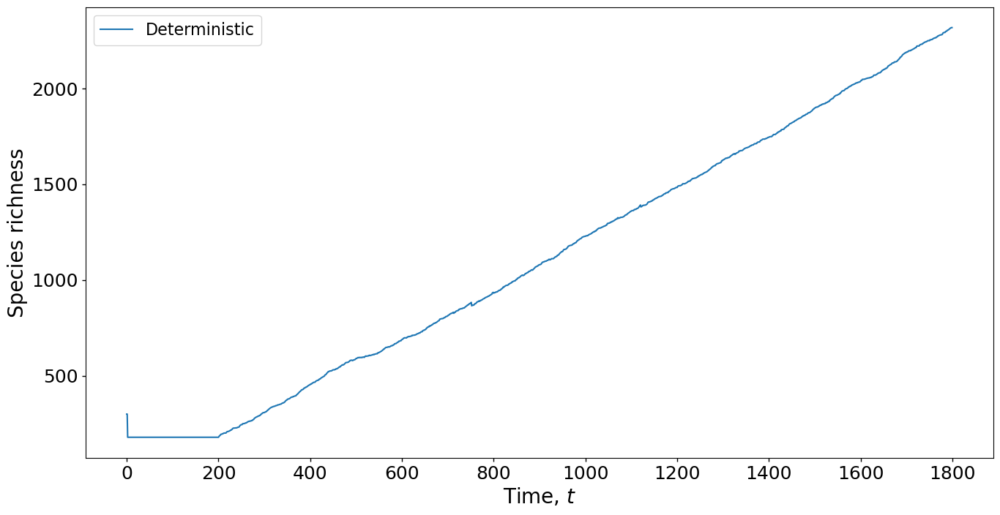

In [492]:
richness_det=[]
for i in list(cp1_det.values()):
    #print(i)
    richness_det.append(len(i))
    
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called fina_df

# Create a figure and axes
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the data from the column
ax.plot(richness_det, label='Deterministic')
#ax.plot(richness, label ='Stochastic')

# Define the positions of vertical lines
initial_line = 200
transient_line = 800
stationary_line = 1800

# Add vertical lines at the specified positions
#ax.axvline(x=initial_line, color='red', linestyle='--')
#ax.axvline(x=transient_line, color='blue', linestyle='--')
#ax.axvline(x=stationary_line, color='green', linestyle='--')

# Set x-axis ticks
ax.set_xticks(range(0, 1800 + 1, 200))

# Set labels for x-axis and y-axis
ax.set_xlabel('Time, $t$', fontsize=20)
ax.set_ylabel('Species richness', fontsize=20)

# Increase the font size of the tick labels
ax.tick_params(axis='both', labelsize=18)

# Bolden the tick labels
ax.xaxis.set_tick_params(which='both', width=1)
ax.yaxis.set_tick_params(which='both', width=1)

# Add text labels for the ranges
#ax.text(90, max(richness), 'Initial', rotation=0, va='top', ha='center', fontsize=18)
#ax.text((initial_line + transient_line) / 2, max(richness), 'Transient', rotation=0, va='top', ha='center', fontsize=18)
#ax.text((transient_line + stationary_line) / 2,max(richness), 'Stationary', rotation=0, va='top', ha='center', fontsize=18)
# Add a legend
ax.legend(fontsize=16)
# Save the plot as a PNG image
plt.savefig('local_com.png', dpi=900)

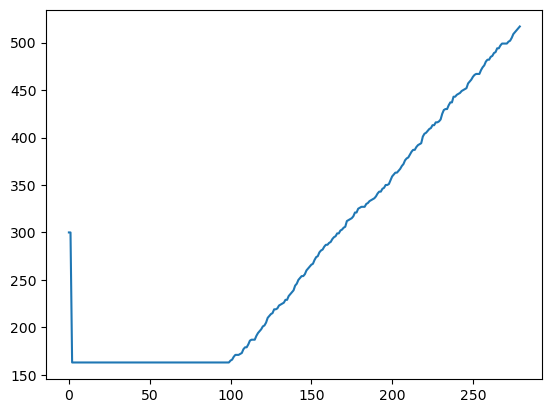

In [479]:
plt.plot(richness_det)
plt.show()

In [497]:
print(richness_det)

[300, 300, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179, 179,

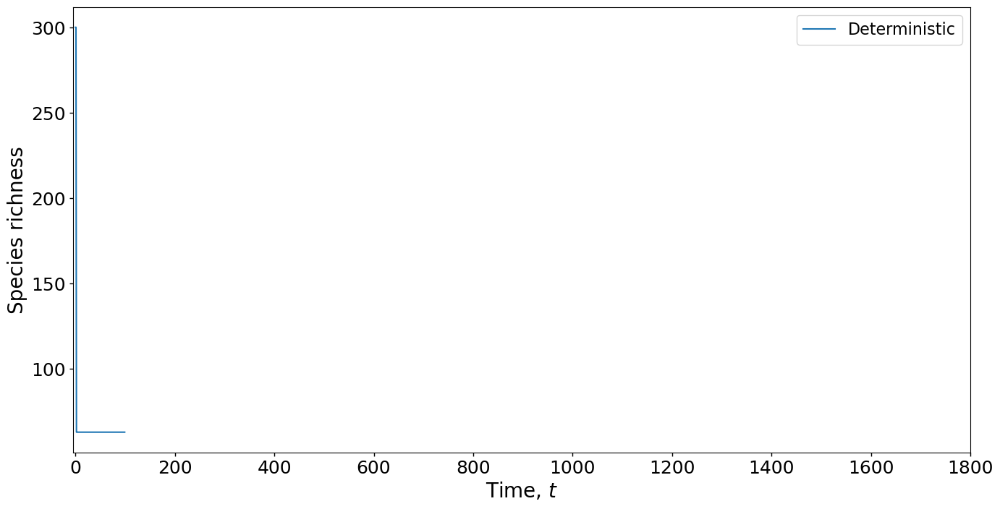

# Richness for varied J (community size) values.

In [496]:
sigmar=combination[0]
print(sigmar)
sigma = combination[1]
print(sigma)
lam = combination[2]
print(lam)

0.9622561420407652
0.49455106640078134
1.4230020540888684


In [474]:

import time

# start the timer
start_time = time.time()


#overall
Richness_det = {}
Shan_det = {}
Shn_1_det = {}
Simp_det = {}
Abund2_det ={}
Stab1_det ={}
Stab2_det = {}
Current_sp_det = {}
Current_sp_var_det = {}
Trait_var_det ={}
trait_mean_det ={}
Aij_det ={}
Aij_var_det={}
Ri_det ={}
Ri_var_det={}
Introd_det={}
Jaccard_lag1_det={}
Jaccard_lag5_det={}
Jaccard_lag10_det={}
Jaccard_lag50_det={}
Jaccard_lag100_det={}
Jaccard_lag1000_det={}
DeltaRAO1_det={}
DeltaRAO5_det={}
DeltaRAO10_det={}
DeltaRAO50_det={}
DeltaRAO100_det={}
DeltaRAO1000_det={}
RAO_mean_det ={}
cp1__det={}
intr_det={}

abund_det = {}
Trait_det={}

Eigen_mean_det={}
Eigen_var_det={}
n,start,N_iter,n_iterations =300, 100, 280, 100
for combination in Combinations:
     #species abundances
    sp_dict_det={}
    
    # structural stability limity
    sp_limit_det=[]
    sp_limit1_det=[]
    sp_limit2_det=[]
    sp_limit3_det=[]
    sp_limit4_det=[]
    sp_limit5_det=[]
    sp_limit6_det=[]
    
    #species richness
    cp1_det={}
    #species traits
    trait_det={}
    # list of species abundaces
    sp1_det=[]
    Abund_det={}
    # sigmar 
    aij_det = {}
    #sigmar.append()
    ri_det = {}
    Intro_det = {}
    ext_det={}
    RAO_det = {}
    #initial number of species  
    eig_det =[]
    H0_det = []
    H1_det=[]
    H2_det = []
    #nj = list(np.random.randint(5,20,200))
    current_species_det=list(np.arange(0,n,1))
    #print('current_species',len(current_species))
    old_n_det = list(np.random.uniform(1,3,n))
    #print('old_n',len(old_n))
    xi_det=np.random.uniform(-1,1,n) # x trait value
    current_xi_det =[var for j,var in enumerate(xi_det) if j in current_species_det]
    #print('current_s',len(nJ))
    sigmar=combination[0]
    sigma = combination[1]
    lam = combination[2]
    for i in range(0,start):
        if i==0:

            cp1_det[i]=current_species_det
            trait_det[i]=current_xi_det
            aij_det[i]= A_res_mut(current_xi_det,sigma)
            ri_det[i]= r_kennel(current_xi_det,sigmar)
            Intro_det[i] = 0
            ext_det[i]=0
            sp1_det.append(list(old_n_det))
            d_det = dict(zip(current_species_det,old_n_det))
            sp_dict_det[i] = d_det
            Abund_det[i]=list(old_n_det)
            # Function for calculating expectation
            expect_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma))[0]
            var_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma))[1]
            #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
            s_starv2_det = (1-expect_det)**2/(var_det)
            #sp_limit.append(s_starv1)
            sp_limit1_det.append(s_starv2_det)
            #RAO
            RAO_det[i] = RAO_(current_xi, old_n)

            #print(np.array(new_n))
            # Calculate Hill numbers for q = 0, 1, and 2
            h0_det = hill_number(np.array(old_n_det), 0)
            h1_det = hill_number(np.array(old_n_det), 1.001)
            h2_det = hill_number(np.array(old_n_det), 2)

            H0_det.append(h0_det)
            H1_det.append(h1_det)
            H2_det.append(h2_det)
            
            
            if len(list(A_res_mut(current_xi_det, sigma))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration_det = power_iteration(A_res_mut(current_xi_det, sigma))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real_det = max_eigenvalue_iteration_det.real

                eig_det.append(max_eigenvalue_iteration_real_det)

            else:
                eig_det.append(0)
        else:
            #print(old_n)
            #print('l',r_kennel(current_xi_det,sigmar)-A_res_mut(current_xi_det,sigma)@old_n_det)
            #print('e',np.exp(r_kennel(current_xi_det,sigmar)-A_res_mut(current_xi_det,sigma)@old_n_det))
            #print('lam',lambdas)
            new_n_det= old_n_det*np.exp(r_kennel(current_xi_det,sigmar)-A_res_mut(current_xi_det,sigma)@old_n_det)
            print('n',new_n_det)
            #print('d',d)
            cp1_det[i]=current_species_det
            trait_det[i]=current_xi_det
            aij_det[i]= A_res_mut(current_xi_det,sigma)
            ri_det[i]= r_kennel(current_xi_det,sigmar)
            Intro_det[i] = 0
            Abund_det[i]=list(new_n_det)
            sp1_det.append(list(new_n_det))
            d_det = dict(zip(current_species_det,new_n_det))
            sp_dict_det[i] = d_det
            # Identify extinct species
            remove_det = np.where(np.array(new_n_det) <= 0.0)[0]
            #print('r',remove_det)

            # Record the length (number) of extinct species
            num_extinct_det = len(remove_det)
            #print(type(remove))
            ext_det[i]=num_extinct_det
            keep_det=np.where(np.array(new_n_det)>0.0)
            #print('k',keep_det)
            #current_spec_det=[int(e) for i,e in enumerate(current_species_det) if i  in keep_det]
            #print(current_spec)
            current_species_det= list(np.array(current_species_det)[keep_det])
            print('current_species',current_species_det)
            new_n_det = list(np.array(new_n_det)[keep_det])
            #print('new_n',len(new_n))
            current_xi_det=[var for j,var in enumerate(current_xi_det) if j not in remove_det]
            #nJ=[var for j,var in enumerate(nJ) if j not in remove]
            #print('current_xtrait',len(current_xtrait))
            old_n_det = list(new_n_det) 

            # Function for calculating expectation
            expect_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma))[0]
            var_det = off_diag_expect_var(A_res_mut(current_xi_det,sigma))[1]
            #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
            s_starv2_det = (1-expect_det)**2/(var_det)
            #sp_limit.append(s_starv1)
            sp_limit1_det.append(s_starv2_det)

            #RAO
            RAO_det[i] = RAO_(current_xi_det, new_n_det)

            #print(np.array(new_n))
            # Calculate Hill numbers for q = 0, 1, and 2
            h0_det = hill_number(np.array(new_n_det), 0)
            h1_det = hill_number(np.array(new_n_det), 1.001)
            h2_det = hill_number(np.array(new_n_det), 2)

            H0_det.append(h0_det)
            H1_det.append(h1_det)
            H2_det.append(h2_det)
        
            if len(list(A_res_mut(current_xi_det, sigma))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration_det = power_iteration(A_res_mut(current_xi_det, sigma))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real_det = max_eigenvalue_iteration_det.real

                eig_det.append(max_eigenvalue_iteration_real_det)

            else:
                eig_det.append(0)   

n [0.00000000e+000 2.65217262e-219 9.74782132e-318 5.92878775e-323
 0.00000000e+000 0.00000000e+000 1.24870824e-134 0.00000000e+000
 3.27593236e-308 0.00000000e+000 0.00000000e+000 1.77088215e-182
 0.00000000e+000 0.00000000e+000 2.01630170e-261 6.03078901e-285
 6.71855458e-186 1.13449227e-113 1.55667531e-314 5.78176221e-316
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 3.14070998e-290 0.00000000e+000 0.00000000e+000
 0.00000000e+000 1.19922926e-281 4.53187807e-281 2.64851650e-189
 0.00000000e+000 0.00000000e+000 0.00000000e+000 3.07472575e-165
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 4.54474441e-300 1.34935681e-229
 2.67055410e-199 0.00000000e+000 5.08431439e-270 7.66007592e-291
 2.99035254e-259 0.00000000e+000 2.57763091e-151 0.00000000e+000
 4.05713060e-200 8.46524543e-283 2.41027783e-154 0.00000000e+000
 2.17031246e-180 1.42614611e-276 2.47032823e-322 0.00000000e+000
 0.00000000e+000 0.0000

n [5.49692552e-218 1.56481878e-315 1.03358533e-320 5.76132925e-134
 4.45988686e-306 1.82293710e-181 1.00882812e-259 3.56340798e-284
 7.32802385e-185 3.84461611e-113 2.38778833e-312 9.04581166e-314
 2.95201547e-288 9.33616686e-280 2.52434685e-280 3.09059473e-188
 2.31627422e-164 3.68291176e-299 3.46789292e-228 3.75716682e-198
 3.08931455e-268 7.15104051e-289 1.13842121e-258 1.52740328e-150
 5.84926130e-199 6.78986273e-281 1.52832323e-153 2.12417070e-179
 7.28187317e-276 4.31220496e-320 3.37357239e-145 9.24269990e-141
 2.61026504e-264 5.53204531e-277 1.89670962e-317 2.47289091e-259
 9.89452138e-282 7.89460375e-306 3.10303944e-200 2.18329290e-112
 1.14211940e-176 2.93431667e-312 1.09568053e-281 6.45313034e-178
 2.66972857e-269 1.67038835e-248 2.42610508e-138 1.62095545e-214
 5.15915596e-137 9.20729959e-300 2.04255504e-196 1.19845785e-258
 5.37127046e-233 2.78814513e-277 2.80556165e-318 4.74037903e-241
 2.49804928e-270 1.96071325e-241 1.34772581e-313 2.55034374e-296
 1.91673952e-312 5.2684

current_species [1, 2, 3, 6, 8, 11, 14, 15, 16, 17, 18, 19, 25, 29, 30, 31, 35, 42, 43, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 62, 64, 66, 68, 69, 71, 72, 73, 74, 76, 77, 82, 85, 87, 88, 89, 90, 91, 92, 93, 95, 96, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 113, 114, 115, 118, 122, 123, 124, 125, 127, 129, 136, 137, 140, 150, 152, 153, 154, 155, 157, 160, 163, 165, 167, 168, 169, 172, 174, 176, 177, 178, 182, 184, 185, 186, 189, 190, 192, 193, 194, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 209, 210, 212, 213, 214, 215, 217, 218, 220, 221, 225, 226, 227, 229, 230, 231, 232, 234, 235, 237, 243, 244, 246, 247, 249, 250, 251, 252, 256, 260, 261, 264, 265, 266, 267, 269, 270, 271, 275, 279, 282, 284, 287, 288, 289, 292, 293, 294, 295, 296, 298, 299]
n [1.13929953e-216 2.51200548e-313 1.83855661e-318 2.65818016e-133
 6.07173427e-304 1.87652220e-180 5.04752926e-258 2.10550831e-283
 7.99278072e-184 1.30288000e-112 3.66263476e-310 1.41525552e-311
 2.77465777e-286 7.26833596e

n [1.42474226e-215 1.72975406e-311 1.37911681e-316 9.50537331e-133
 3.64449075e-302 1.30970070e-179 1.31561929e-256 9.25265718e-283
 5.85405887e-183 3.60258263e-112 2.42824090e-308 9.53873871e-310
 1.22307124e-284 2.73835858e-276 5.88272906e-279 2.79435075e-186
 9.38843534e-163 1.70650686e-297 1.33337901e-225 4.78632469e-196
 5.75241186e-265 2.92607557e-285 1.32038541e-257 3.98685891e-149
 7.79324064e-197 2.10345698e-277 4.51668792e-152 1.39127354e-177
 1.44673206e-274 5.57145611e-316 7.67419892e-144 1.82161556e-139
 3.99534247e-261 1.10831518e-275 2.21810107e-315 3.23373137e-256
 3.08026272e-278 6.43228707e-302 4.17645306e-198 1.99190772e-111
 7.04580766e-175 2.49713824e-310 2.60185673e-280 4.08015867e-176
 5.18541993e-266 1.37012568e-245 4.42249149e-137 3.66643598e-212
 9.02381523e-136 4.34706903e-298 2.45147172e-194 1.51060715e-255
 2.42791126e-230 5.74189123e-276 3.30333506e-316 3.65722610e-240
 4.18132865e-269 1.52127150e-240 1.29552386e-311 1.05173677e-294
 1.74339421e-310 1.5951

n [2.95293830e-214 2.77677627e-309 2.45329440e-314 4.38561896e-132
 4.96164590e-300 1.34819925e-178 6.58251559e-255 5.46711091e-282
 6.38510598e-182 1.22085866e-111 3.72468506e-306 1.49237604e-307
 1.14958887e-282 2.13185030e-274 3.27679790e-278 3.26077097e-185
 7.07256273e-162 1.38289717e-296 3.42682944e-224 6.73381614e-195
 3.49526176e-263 2.73162893e-283 5.02668072e-257 2.36245669e-148
 1.12356997e-195 1.68715536e-275 2.86396822e-151 1.36169449e-176
 7.38698461e-274 9.73816575e-314 4.21875000e-143 9.26048535e-139
 2.18150145e-259 5.68491228e-275 2.97831537e-314 1.62036359e-254
 2.47722665e-276 8.74293563e-300 6.05468299e-197 6.65259873e-111
 6.67442759e-174 2.81925743e-309 1.46423351e-279 3.91732633e-175
 3.22412069e-264 5.32333545e-244 2.15453156e-136 7.05508290e-211
 4.29820769e-135 3.55895501e-297 3.33860433e-193 7.41906281e-254
 6.81552949e-229 2.98978659e-275 4.45197283e-315 1.11469168e-239
 1.94443884e-268 4.65101964e-240 1.56313547e-310 7.99805396e-294
 2.04103142e-309 1.0248

n [3.69277427e-213 1.91207386e-307 1.84023597e-312 1.56825132e-131
 2.97817259e-298 9.40962758e-178 1.71570763e-253 2.40252212e-281
 4.67656847e-181 3.37578610e-111 2.46937879e-304 1.00585265e-305
 5.06739640e-281 8.03178416e-273 1.37090912e-277 2.52650276e-184
 3.80536628e-161 7.90723709e-296 5.12674304e-223 6.09738805e-194
 1.07111923e-261 1.19729685e-281 1.53143460e-256 1.04065797e-147
 1.03832940e-194 6.51637811e-274 1.33482691e-150 9.11246007e-176
 2.87430666e-273 7.19837063e-312 1.74572596e-142 3.59016659e-138
 6.11537956e-258 2.22044918e-274 2.59395125e-313 4.22866150e-253
 9.58916362e-275 5.24083516e-298 5.62118545e-196 1.81729915e-110
 4.34660385e-173 2.12509422e-308 6.17849657e-279 2.57978592e-174
 1.00716530e-262 1.12383708e-242 8.06165866e-136 8.29310441e-210
 1.57834425e-134 2.05239429e-296 2.94225295e-192 1.90405859e-252
 1.09745974e-227 1.18248202e-274 3.88942799e-314 2.82156820e-239
 6.99886485e-268 1.18031894e-239 1.24534387e-309 4.33725935e-293
 1.58572583e-308 4.8295

n [7.65368929e-212 3.06945447e-305 3.27357377e-310 7.23564714e-131
 4.05451375e-296 9.68622289e-177 8.58430121e-252 1.41957652e-280
 5.10080031e-180 1.14400088e-110 3.78778658e-302 1.57369904e-303
 4.76294617e-279 6.25285586e-271 7.63623836e-277 2.94821502e-183
 2.86668553e-160 6.40776550e-295 1.31759041e-221 8.57833363e-193
 6.50829979e-260 1.11773282e-279 5.83014077e-256 6.16653219e-147
 1.49698409e-193 5.22670172e-272 8.46394947e-150 8.91872535e-175
 1.46761516e-272 1.25817964e-309 9.59680806e-142 1.82512084e-137
 3.33906529e-256 1.13894125e-273 3.48298145e-312 2.11890486e-251
 7.71185245e-273 7.12348251e-296 8.14913886e-195 6.06943884e-110
 4.11749711e-172 2.39922147e-307 3.47704069e-278 2.47683096e-173
 6.26221703e-261 4.36643286e-241 3.92744634e-135 1.59578783e-208
 7.51794137e-134 1.68029974e-295 4.00698827e-191 9.35142551e-251
 3.08074242e-226 6.15715060e-274 5.24186233e-313 8.59990199e-239
 3.25467472e-267 3.60861724e-239 1.50258998e-308 3.29831907e-292
 1.85644545e-307 3.1030

current_species [1, 2, 3, 6, 8, 11, 14, 15, 16, 17, 18, 19, 25, 29, 30, 31, 35, 42, 43, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 62, 64, 66, 68, 69, 71, 72, 73, 74, 76, 77, 82, 85, 87, 88, 89, 90, 91, 92, 93, 95, 96, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 113, 114, 115, 118, 122, 123, 124, 125, 127, 129, 136, 137, 140, 150, 152, 153, 154, 155, 157, 160, 163, 165, 167, 168, 169, 172, 174, 176, 177, 178, 182, 184, 185, 186, 189, 190, 192, 193, 194, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 209, 210, 212, 213, 214, 215, 217, 218, 220, 221, 225, 226, 227, 229, 230, 231, 232, 234, 235, 237, 243, 244, 246, 247, 249, 250, 251, 252, 256, 260, 261, 264, 265, 266, 267, 269, 270, 271, 275, 279, 282, 284, 287, 288, 289, 292, 293, 294, 295, 296, 298, 299]
n [1.58631304e-210 4.92739895e-303 5.82332126e-308 3.33840558e-130
 5.51985529e-294 9.97094869e-176 4.29503406e-250 8.38784160e-280
 5.56351606e-179 3.87683928e-110 5.81009573e-300 2.46211874e-301
 4.47678738e-277 4.86793540e

current_species [1, 2, 3, 6, 8, 11, 14, 15, 16, 17, 18, 19, 25, 29, 30, 31, 35, 42, 43, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 62, 64, 66, 68, 69, 71, 72, 73, 74, 76, 77, 82, 85, 87, 88, 89, 90, 91, 92, 93, 95, 96, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 113, 114, 115, 118, 122, 123, 124, 125, 127, 129, 136, 137, 140, 150, 152, 153, 154, 155, 157, 160, 163, 165, 167, 168, 169, 172, 174, 176, 177, 178, 182, 184, 185, 186, 189, 190, 192, 193, 194, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 209, 210, 212, 213, 214, 215, 217, 218, 220, 221, 225, 226, 227, 229, 230, 231, 232, 234, 235, 237, 243, 244, 246, 247, 249, 250, 251, 252, 256, 260, 261, 264, 265, 266, 267, 269, 270, 271, 275, 279, 282, 284, 287, 288, 289, 292, 293, 294, 295, 296, 298, 299]
n [1.98375156e-209 3.39298159e-301 4.36812037e-306 1.19377880e-129
 3.31323155e-292 6.95912815e-175 1.11948428e-248 3.68603735e-279
 4.07482098e-178 1.07198159e-109 3.85195713e-298 1.65945351e-299
 1.97337126e-275 1.83400337e

n [1.49680765e-208 1.00219567e-299 1.38163611e-304 3.30850408e-129
 8.76821246e-291 3.29313486e-174 1.52005432e-247 1.20472338e-278
 2.00408383e-177 2.41854935e-109 1.10377352e-296 4.81825707e-298
 4.07945983e-274 3.34383153e-266 5.59186274e-275 1.37137933e-180
 4.46518056e-158 1.19787426e-292 4.41191979e-218 6.36869831e-190
 1.87301770e-255 9.41192405e-275 1.64865773e-254 5.27076284e-145
 1.18146884e-190 3.01148925e-267 8.56926033e-148 2.67282589e-172
 8.64589408e-271 5.08175566e-304 6.79991764e-140 1.06349188e-135
 7.35577855e-252 6.78660438e-272 2.30104198e-309 3.76602150e-247
 4.47304914e-268 1.53434146e-290 6.52110555e-192 1.23723964e-108
 1.13721193e-169 1.02754467e-304 2.61232484e-276 7.07421275e-171
 1.90895860e-256 4.10851956e-237 2.05742918e-133 2.59191159e-205
 3.72256200e-132 3.22256483e-293 2.74260482e-188 1.58078060e-246
 1.28624107e-222 3.80927957e-272 3.49530677e-310 1.39476447e-237
 1.51777554e-265 5.89785957e-238 7.59833601e-306 5.26000130e-290
 8.70597511e-305 3.2470

n [3.10230190e-207 1.60882592e-297 2.45777597e-302 1.52648799e-128
 1.19371315e-288 3.38993631e-173 7.60537746e-246 7.11834040e-278
 2.18588298e-176 8.19608383e-109 1.69308108e-294 7.53836710e-296
 3.83436504e-272 2.60321943e-264 3.11477954e-274 1.60028368e-179
 3.36374150e-157 9.70717999e-292 1.13387840e-216 8.96003639e-189
 1.13807691e-253 8.78647298e-273 6.27640686e-254 3.12324796e-144
 1.70335162e-189 2.41547617e-265 5.43364732e-147 2.61600049e-171
 4.41457601e-270 8.88223439e-302 3.73812991e-139 5.40643770e-135
 4.01633694e-250 3.48107209e-271 3.08968279e-308 1.88708443e-245
 3.59734137e-266 2.08551771e-288 9.45377004e-191 4.13214870e-108
 1.07727021e-168 1.16009314e-303 1.47012459e-275 6.79189269e-170
 1.18692662e-254 1.59627895e-235 1.00233005e-132 4.98744591e-204
 1.77312414e-131 2.63832094e-292 3.73509197e-187 7.76370649e-245
 3.61068137e-221 1.98348114e-271 4.71069703e-309 4.25112453e-237
 7.05809553e-265 1.80316667e-237 9.16789640e-305 4.00002887e-289
 1.01922839e-303 2.0862

n [6.42986900e-206 2.58265018e-295 4.37210830e-300 7.04295820e-128
 1.62513294e-286 3.48958324e-172 3.80524337e-244 4.20600869e-277
 2.38417392e-175 2.77752406e-108 2.59702150e-292 1.17940944e-293
 3.60399560e-270 2.02664259e-262 1.73499458e-273 1.86739569e-178
 2.53399762e-156 7.86638018e-291 2.91410608e-215 1.26057553e-187
 6.91514588e-252 8.20258504e-271 2.38941548e-253 1.85071461e-143
 2.45576238e-188 1.93742187e-263 3.44539926e-146 2.56038323e-170
 2.25407357e-269 1.55249668e-299 2.05496830e-138 2.74845243e-134
 2.19296466e-248 1.78555611e-270 4.14861608e-307 9.45583458e-244
 2.89307462e-264 2.83469113e-286 1.37053092e-189 1.38006028e-107
 1.02048797e-167 1.30973974e-302 8.27334445e-275 6.52083957e-169
 7.37991274e-253 6.20200649e-234 4.88311107e-132 9.59701588e-203
 8.44571350e-131 2.15999917e-291 5.08673795e-186 3.81299837e-243
 1.01357516e-219 1.03279305e-270 6.34870356e-308 1.29570692e-236
 3.28221870e-264 5.51286445e-237 1.10616751e-303 3.04186825e-288
 1.19323396e-302 1.3404

n [1.33266254e-204 4.14593145e-293 7.77749121e-298 3.24950215e-127
 2.21247213e-284 3.59215928e-171 1.90389986e-242 2.48520133e-276
 2.60045269e-174 9.41259274e-108 3.98357806e-290 1.84523598e-291
 3.38746679e-268 1.57776949e-260 9.66426731e-273 2.17909282e-177
 1.90892907e-155 6.37465640e-290 7.48935178e-214 1.77348683e-186
 4.20175842e-250 7.65749824e-269 9.09645675e-253 1.09666111e-142
 3.54053080e-187 1.55398076e-261 2.18467916e-145 2.50594841e-169
 1.15092540e-268 2.71355813e-297 1.12968111e-137 1.39722146e-133
 1.19738311e-246 9.15870322e-270 5.57047973e-306 4.73814559e-242
 2.32668515e-262 3.85298757e-284 1.98688460e-188 4.60914288e-107
 9.66698698e-167 1.47869006e-301 4.65594744e-274 6.26060372e-168
 4.58858293e-251 2.40965932e-232 2.37893435e-131 1.84669098e-201
 4.02284730e-130 1.76839609e-290 6.92751428e-185 1.87268241e-241
 2.84526520e-218 5.37772430e-270 8.55627874e-307 3.94920544e-236
 1.52632669e-263 1.68546119e-236 1.33466448e-302 2.31322392e-287
 1.39694625e-301 8.6125

n [2.76209275e-203 6.65546874e-291 1.38352862e-295 1.49926550e-126
 3.01208154e-282 3.69775053e-170 9.52589448e-241 1.46842913e-275
 2.83635105e-173 3.18977982e-107 6.11042080e-288 2.88694977e-289
 3.18394709e-266 1.22831553e-258 5.38319045e-272 2.54281701e-176
 1.43804799e-154 5.16581240e-289 1.92478889e-212 2.49509488e-185
 2.55305877e-248 7.14863412e-267 3.46300281e-252 6.49838491e-142
 5.10446714e-186 1.24642766e-259 1.38527430e-144 2.45267089e-168
 5.87660181e-268 4.74293944e-295 6.21021453e-137 7.10300745e-133
 6.53784503e-245 4.69779943e-269 7.47966162e-305 2.37419801e-240
 1.87118015e-260 5.23708316e-282 2.88042418e-187 1.53936740e-106
 9.15744619e-166 1.66943418e-300 2.62020356e-273 6.01075345e-167
 2.85302741e-249 9.36222499e-231 1.15895964e-130 3.55346664e-200
 1.91615550e-129 1.44778978e-289 9.43442627e-184 9.19732732e-240
 7.98710777e-217 2.80016590e-269 1.15314733e-305 1.20368452e-235
 7.09786086e-263 5.15300069e-236 1.61036122e-301 1.75911790e-286
 1.63543688e-300 5.5336

n [5.72474733e-202 1.06840320e-288 2.46114252e-293 6.91735821e-126
 4.10067772e-280 3.80644564e-169 4.76614698e-239 8.67649666e-275
 3.09364877e-172 1.08096627e-106 9.37279044e-286 4.51675510e-287
 2.99265489e-264 9.56260751e-257 2.99854489e-271 2.96725237e-175
 1.08332052e-153 4.18620488e-288 4.94677295e-211 3.51031559e-184
 1.55128125e-246 6.67358558e-265 1.31835821e-251 3.85068879e-141
 7.35923120e-185 9.99743339e-258 8.78382928e-144 2.40052608e-167
 3.00058099e-267 8.29002861e-293 3.41395145e-136 3.61093186e-132
 3.56973614e-243 2.40965549e-268 1.00431813e-303 1.18966716e-238
 1.50485129e-258 7.11838270e-280 4.17580541e-186 5.14119884e-106
 8.67476298e-165 1.88478340e-299 1.47455846e-272 5.77087429e-166
 1.77391703e-247 3.63749582e-229 5.64617280e-130 6.83770338e-199
 9.12699794e-129 1.18530869e-288 1.28485335e-182 4.51709427e-238
 2.24210702e-215 1.45803850e-268 1.55412045e-304 3.66872895e-235
 3.30071073e-262 1.57543919e-235 1.94300763e-300 1.33774157e-285
 1.91464332e-299 3.5554

current_species [1, 2, 3, 6, 8, 11, 14, 15, 16, 17, 18, 19, 25, 29, 30, 31, 35, 42, 43, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 62, 64, 66, 68, 69, 71, 72, 73, 74, 76, 77, 82, 85, 87, 88, 89, 90, 91, 92, 93, 95, 96, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 113, 114, 115, 118, 122, 123, 124, 125, 127, 129, 136, 137, 140, 150, 152, 153, 154, 155, 157, 160, 163, 165, 167, 168, 169, 172, 174, 176, 177, 178, 182, 184, 185, 186, 189, 190, 192, 193, 194, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 209, 210, 212, 213, 214, 215, 217, 218, 220, 221, 225, 226, 227, 229, 230, 231, 232, 234, 235, 237, 243, 244, 246, 247, 249, 250, 251, 252, 256, 260, 261, 264, 265, 266, 267, 269, 270, 271, 275, 279, 282, 284, 287, 288, 289, 292, 293, 294, 295, 296, 298, 299]
n [1.18651816e-200 1.71510894e-286 4.37809702e-291 3.19155243e-125
 5.58270338e-278 3.91833582e-168 2.38467443e-237 5.12667535e-274
 3.37428709e-171 3.66322490e-106 1.43769478e-283 7.06665451e-285
 2.81285556e-262 7.44462316e

current_species [1, 2, 3, 6, 8, 11, 14, 15, 16, 17, 18, 19, 25, 29, 30, 31, 35, 42, 43, 44, 46, 47, 48, 50, 52, 53, 54, 56, 57, 58, 62, 64, 66, 68, 69, 71, 72, 73, 74, 76, 77, 82, 85, 87, 88, 89, 90, 91, 92, 93, 95, 96, 101, 102, 103, 104, 105, 106, 107, 109, 110, 111, 113, 114, 115, 118, 122, 123, 124, 125, 127, 129, 136, 137, 140, 150, 152, 153, 154, 155, 157, 160, 163, 165, 167, 168, 169, 172, 174, 176, 177, 178, 182, 184, 185, 186, 189, 190, 192, 193, 194, 196, 197, 198, 199, 201, 202, 203, 204, 205, 206, 209, 210, 212, 213, 214, 215, 217, 218, 220, 221, 225, 226, 227, 229, 230, 231, 232, 234, 235, 237, 243, 244, 246, 247, 249, 250, 251, 252, 256, 260, 261, 264, 265, 266, 267, 269, 270, 271, 275, 279, 282, 284, 287, 288, 289, 292, 293, 294, 295, 296, 298, 299]
n [1.48379115e-199 1.18101520e-284 3.28404599e-289 1.14126566e-124
 3.35095541e-276 2.73476496e-167 6.21556314e-236 2.25291770e-273
 2.47138962e-170 1.01291526e-105 9.53157898e-282 4.76288346e-283
 1.23990885e-260 2.80477510e

n [1.11957061e-198 3.48840184e-283 1.03874347e-287 3.16296627e-124
 8.86804577e-275 1.29412042e-166 8.43959473e-235 7.36330747e-273
 1.21548210e-169 2.28528695e-105 2.73126208e-280 1.38291291e-281
 2.56320667e-259 5.11378308e-252 2.19577371e-269 1.38023466e-172
 1.68739182e-151 7.82573437e-286 1.65641503e-207 2.60611699e-181
 4.46441827e-242 5.61952547e-260 3.72807716e-250 3.29132595e-139
 5.80814613e-182 5.76026045e-253 8.89312018e-142 7.19406419e-165
 1.76767766e-265 3.34832152e-287 2.41899062e-134 2.10407807e-130
 7.86393383e-239 1.43584039e-266 6.63505738e-301 2.11444704e-234
 8.72847842e-254 1.53324300e-274 3.34156385e-183 1.04802028e-104
 2.39588364e-162 8.07219825e-297 1.10784602e-270 1.64825105e-163
 5.40756437e-243 3.42263884e-225 2.95779997e-128 1.11059392e-195
 4.51929778e-127 2.27324566e-286 8.79424829e-180 7.63577166e-234
 9.36102318e-212 9.02053015e-267 1.03629729e-301 5.95008270e-234
 1.53924384e-260 2.57486967e-234 9.82545138e-298 2.13336619e-283
 8.97889947e-297 3.7204

In [5]:
import time

# start the timer
start_time = time.time()
rich = []
mean_rich = []
# Define a list of different J values
J_values = [1000, 3000, 5000,7000,9000,11000,13000,15000,17000,19000]  # Add more values as needed

# Create dictionaries to store results for each J value
#overall
Richness = {}
Shan = {}
Shn_1 = {}
Simp = {}
Abund2 ={}
Stab1 ={}
Stab2 = {}
Current_sp = {}
Current_sp_var = {}
Trait_var ={}
trait_mean ={}
Aij ={}
Aij_var={}
Ri ={}
Ri_var={}
Introd={}
Jaccard_lag1={}
Jaccard_lag5={}
Jaccard_lag10={}
Jaccard_lag50={}
Jaccard_lag100={}
Jaccard_lag1000={}
DeltaRAO1={}
DeltaRAO5={}
DeltaRAO10={}
DeltaRAO50={}
DeltaRAO100={}
DeltaRAO1000={}
RAO_mean ={}
cp1_={}
intr={}
Eigen_mean={}
Eigen_var={}
n,start,N_iter,n_iterations =100, 200, 1800, 1000


# Loop through different J values
for J in J_values:
    for combination in Combinations:
         #species abundances
        sp_dict={}

        # structural stability limity
        sp_limit=[]
        sp_limit1=[]
        sp_limit2=[]
        sp_limit3=[]
        sp_limit4=[]
        sp_limit5=[]
        sp_limit6=[]

        #species richness
        cp1={}
        #species traits
        trait={}
        # list of species abundaces
        sp1=[]
        # sigmar 
        aij = {}
        #sigmar.append()
        ri = {}
        Intro = {}
        RAO = {}
        #initial number of species  
        eig =[]
        H0 = []
        H1=[]
        H2 = []
        #nj = list(np.random.randint(5,20,200))
        current_species=list(np.arange(0,n,1))
        #print('current_species',len(current_species))
        old_n = list(np.random.uniform(0.01,0.2,n))
        #print('old_n',len(old_n))
        xi=np.random.uniform(-1,1,n) # x trait value
        current_xi =[var for j,var in enumerate(xi) if j in current_species]
        #print('current_s',len(nJ))
        sigmar=combination[0]
        sigma = combination[1]
        lam = combination[2]
        for i in range(0,start):
            if i==0:
                im=np.full((len(current_species),),0.01)
                cp1[i]=current_species
                trait[i]=current_xi
                aij[i]= A_res_mut(current_xi,sigma)
                ri[i]= r_kennel(current_xi,sigmar)
                Intro[i] = 0
                sp1.append(list(old_n))
                d = dict(zip(current_species,old_n))
                sp_dict[i] = d
                # Function for calculating expectation
                expect = off_diag_expect_var(A_res_mut(current_xi,sigma))[0]
                var = off_diag_expect_var(A_res_mut(current_xi,sigma))[1]
                #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
                s_starv2 = (1-expect)**2/(2*var)
                #sp_limit.append(s_starv1)
                sp_limit1.append(s_starv2)
                #RAO
                RAO[i] = RAO_(current_xi, old_n)

                #print(np.array(new_n))
                # Calculate Hill numbers for q = 0, 1, and 2
                h0 = hill_number(np.array(old_n), 0)
                h1 = hill_number(np.array(old_n), 1.001)
                h2 = hill_number(np.array(old_n), 2)

                H0.append(h0)
                H1.append(h1)
                H2.append(h2)
                #if len(list(A_res_mut(current_xi,sigma)))!=0:

                    # Calculate the eigenvalues of the matrix
                    #eigenvalues = np.linalg.eigvals(A_res_mut(current_xi,sigma))

                    # Get the maximum eigenvalue
                    #max_eigenvalue_iteration = np.max(eigenvalues)

                    # Store the real part of the maximum eigenvalue
                    #max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                    #eig.append(max_eigenvalue_iteration_real)

                #else:
                    #eig.append(0)
                if len(list(A_res_mut(current_xi, sigma))) != 0:
                    # Calculate the eigenvalue using power iteration method
                    max_eigenvalue_iteration = power_iteration(A_res_mut(current_xi, sigma))

                    # Store the real part of the maximum eigenvalue
                    max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                    eig.append(max_eigenvalue_iteration_real)

                else:
                    eig.append(0)
            else:
                #print(old_n)
                #print('l',r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n)
                #print('e',np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
                lambdas= J*(old_n*np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
                #print('lam',lambdas)
                new_n= np.random.poisson(lambdas, len(current_species))/J
                #print(new_n)
                #print('d',d)
                cp1[i]=current_species
                trait[i]=current_xi
                aij[i]= A_res_mut(current_xi,sigma)
                ri[i]= r_kennel(current_xi,sigmar)
                Intro[i] = 0
                sp1.append(list(new_n))
                d = dict(zip(current_species,new_n))
                sp_dict[i] = d
                remove=np.array(np.where(new_n==0))
                #print(type(remove))
                keep=np.where(new_n>0)
                current_spec=[int(e) for i,e in enumerate(current_species) if i not in remove]
                #print(current_spec)
                current_species= list(np.array(current_species)[keep])
                #print('current_species',current_species)
                new_n = list(np.array(new_n)[keep])
                #print('new_n',len(new_n))
                current_xi=[var for j,var in enumerate(current_xi) if j not in remove]
                #nJ=[var for j,var in enumerate(nJ) if j not in remove]
                #print('current_xtrait',len(current_xtrait))
                old_n = list(new_n) 

                # Function for calculating expectation
                expect = off_diag_expect_var(A_res_mut(current_xi,sigma))[0]
                var = off_diag_expect_var(A_res_mut(current_xi,sigma))[1]
                #s_starv1 = np.exp(num)*(1-expect)**2/(2*var)
                s_starv2 = (1-expect)**2/(var)
                #sp_limit.append(s_starv1)
                sp_limit1.append(s_starv2)

                #RAO
                RAO[i] = RAO_(current_xi, new_n)

                #print(np.array(new_n))
                # Calculate Hill numbers for q = 0, 1, and 2
                h0 = hill_number(np.array(new_n), 0)
                h1 = hill_number(np.array(new_n), 1.001)
                h2 = hill_number(np.array(new_n), 2)

                H0.append(h0)
                H1.append(h1)
                H2.append(h2)

                if len(list(A_res_mut(current_xi, sigma))) != 0:
                    # Calculate the eigenvalue using power iteration method
                    max_eigenvalue_iteration = power_iteration(A_res_mut(current_xi, sigma))

                    # Store the real part of the maximum eigenvalue
                    max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                    eig.append(max_eigenvalue_iteration_real)

                else:
                    eig.append(0)           

        for i in range(start,N_iter):
            #print(old_n)
            #print('l',r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n)
            #print('e',np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
            lambdas= J*(old_n*np.exp(r_kennel(current_xi,sigmar)-A_res_mut(current_xi,sigma)@old_n))
            #print(lambdas)
            new_n=  np.random.poisson(lambdas, len(current_species))/J
            #print(new_n)
            #adding new species
            num=np.random.poisson(lam, size=None)
            #print(num)
            new_n= list(new_n) + list(np.full((num,),0.001))
            current_species= current_species + random.sample(range(10000,40000),num)
            #print('current_species',len(current_species))
            current_xi=current_xi+list(np.random.uniform(-10,10,num))
            #print('current_xi',len(current_xi))
            d = dict(zip(current_species,new_n))
            sp_dict[i] = d
            cp1[i]=current_species
            trait[i]=current_xi
            aij[i]= A_res_mut(current_xi,sigma)
            ri[i]= r_kennel(current_xi,sigmar)
            Intro[i] = num
            sp1.append(list(new_n))
            remove=np.array(np.where(np.array(new_n)==0))
            #print(remove)
            keep=np.where(np.array(new_n)>0)
            #print(keep)
            current_species=[int(e) for i,e in enumerate(current_species) if i not in remove]
            #print(current_spec)
            #current_spec= list(np.array(current_spec)[keep])

            new_n = list(np.array(new_n)[keep])
            #print('new_n',len(new_n))
            current_xi=[var for j,var in enumerate(current_xi) if j not in remove]
            #print('current_xtrait',(len(current_xi)))
            #nJ =[var for j,var in enumerate(nJ) if j not in remove]

            old_n =  list(new_n) #list(new_n) + list(np.full((num,),60) )#random.sample(range(0,80),num)
            #print(len(old_n))
            #current_species= current_species + random.sample(range(10000,40000),num)
            #current_xi=current_xi+list(np.random.uniform(-1,1,num))


            # Function for calculating expectation
            mean = off_diag_expect_var(A_res_mut(current_xi,sigma))[0]
            #print('m=',mean)
            var = off_diag_expect_var(A_res_mut(current_xi,sigma))[1]
            #print('v=',var)
            s_starv1 = np.exp(num)*(1-mean)**2/(2*var)
            #print('s1=', s_starv1)
            s_starv2 = (1-mean)**2/(2*var)

            s_starv3 = num*(1-mean)**2/(2*var)

            s_starv4 = np.mean(r_kennel(current_xi,sigmar))*num*(1-mean)**2/(2*var)

            s_starv5 = (np.mean(r_kennel(current_xi,sigmar))*num*(1-mean)**2/(2*var))**0.5
            s_starv6 = (np.mean(r_kennel(current_xi,sigmar))*num*(1-mean)**2/(var))**0.5
            s_starv7 = (1-mean)**2/(var)
            #print('s2=', s_starv2)
            sp_limit.append(s_starv1)
            sp_limit1.append(s_starv2)
            sp_limit2.append(s_starv3)
            sp_limit3.append(s_starv4)
            sp_limit4.append(s_starv5)
            sp_limit5.append(s_starv6)
            sp_limit6.append(s_starv7)

            #RAO
            RAO[i] = RAO_(current_xi, new_n)

            # Calculate Hill numbers for q = 0, 1, and 2
            h0 = hill_number(np.array(new_n), 0)
            h1 = hill_number(np.array(new_n), 1.001)
            h2 = hill_number(np.array(new_n), 2)
            H0.append(h0)
            H1.append(h1)
            H2.append(h2)
            #if len(list(A_res_mut(current_xi,sigma)))!=0:
                # Calculate the eigenvalues of the matrix
                #eigenvalues = np.linalg.eigvals(A_res_mut(current_xi,sigma))

                # Get the maximum eigenvalue
                #max_eigenvalue_iteration = np.max(eigenvalues)

                # Store the real part of the maximum eigenvalue
                #max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                #eig.append(max_eigenvalue_iteration_real)

            #else:
               # eig.append(0)
            if len(list(A_res_mut(current_xi, sigma))) != 0:
                # Calculate the eigenvalue using power iteration method
                max_eigenvalue_iteration = power_iteration(A_res_mut(current_xi, sigma))

                # Store the real part of the maximum eigenvalue
                max_eigenvalue_iteration_real = max_eigenvalue_iteration.real

                eig.append(max_eigenvalue_iteration_real)

            else:
                eig.append(0)           

        #print(len(Intro))    
        #Introduction rate
        #overall
        #Richness = {}
        Shan = {}
        Shn_1 = {}
        Simp = {}
        Abund2 ={}
        Stab1 ={}
        Stab1_var ={}
        Stab2 = {}
        Stab2_var = {}
        Stab3 = {}
        Stab3_var = {}
        Stab4 = {}
        Stab4_var = {}
        Stab5 = {}
        Stab6 = {}
        Stab7 = {}
        Stab5_var = {}
        Current_sp = {}
        Current_sp_var = {}
        Trait_var = {}
        trait_mean = {}
        Aij = {}
        Aij_var = {}
        Ri = {}
        Ri_var = {}
        Introd = {}
        Introd_var ={}
        Jaccard_lag1={}
        Jaccard_lag5={}
        Jaccard_lag10={}
        Jaccard_lag50={}
        Jaccard_lag100={}
        Jaccard_lag200={}
        DeltaRAO1={}
        DeltaRAO5={}
        DeltaRAO10={}
        DeltaRAO50={}
        DeltaRAO100={}
        DeltaRAO200={}
        RAO_mean ={}
        RAO_var ={}
        Eigen_mean={}
        Eigen_var={}
        ##_________________________________________________________________
        Introd[combination] = introduction_rate_mean(Intro,n_iterations)[0]
        Introd_var[combination] = introduction_rate_mean(Intro,n_iterations)[1]

        #RAO_mean
        RAO_mean[combination]= RAO_mean_(RAO,n_iterations)[0]
        RAO_var[combination]= RAO_mean_(RAO,n_iterations)[1]
        #Function turnover
        DeltaRAO1[combination] = functional_turnover(RAO, 1,n_iterations)
        DeltaRAO5[combination] = functional_turnover(RAO, 5,n_iterations)
        DeltaRAO10[combination] = functional_turnover(RAO, 10,n_iterations)
        DeltaRAO50[combination] = functional_turnover(RAO, 50,n_iterations)
        DeltaRAO100[combination] = functional_turnover(RAO, 100,n_iterations)
        DeltaRAO200[combination] = functional_turnover(RAO, 200,n_iterations)

        rich_var_count = {inner_key: len(inner_value) for inner_key, inner_value in cp1.items()}
        rich_var_count_values = list(rich_var_count.values())[-n_iterations:]
        rmean = sum(rich_var_count_values) / len(rich_var_count_values) if len(rich_var_count_values) != 0 else 0
        variance = sum((x - rmean) ** 2 for x in rich_var_count_values) / len(rich_var_count_values) if len(rich_var_count_values) != 0 else 0
        Current_sp_var[combination] = variance

        #Richness
        rich_count = {inner_key: len(inner_value) for inner_key, inner_value in cp1.items()}
        last_counts = list(rich_count.values())[-n_iterations:]
        rmean = sum(last_counts) / len(last_counts) if len(last_counts) != 0 else 0
        Current_sp[combination] = rmean

        #Mean Shannon Entropy
        H_shan = [math.log(x) for x in H1]
        sha_mean = sum(H_shan[-n_iterations:]) / len(H_shan[-n_iterations:]) if len(H_shan[-n_iterations:]) != 0 else 0 
        Shan[combination] = sha_mean

        #Mean Simpson Entropy
        Simpson=np.power(H2,-1)
        if len(Simpson[-n_iterations:])!= 0:
            shi_mean = sum(Simpson[-n_iterations:])/len(Simpson[-n_iterations:])
        else:
            shi_mean = 0 
        Simp[combination] =shi_mean
        #___________________________________________________________________________
        #eig_mean = sum(eig[-n_iterations:]) / len(eig[-n_iterations:]) if len(eig[-n_iterations:]) != 0 else 0 
        #Eigen_mean[combination] = eig_mean
        # eigenvalues

        if len(sp_limit[-n_iterations:]) != 0:
            eig_mean= statistics.mean(eig[-n_iterations:])
            eig_variance = statistics.variance(eig[-n_iterations:])
        else:
            eig_mean = 0
            eig_variance = 0

        Eigen_mean[combination] = eig_mean
        Eigen_var[combination]=eig_variance
        #____________________________________________________________________
        # S_star with Introduction rate

        if len(sp_limit[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit[-n_iterations:])
            st1_variance = statistics.variance(sp_limit[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab1[combination] = st1_mean
        Stab1_var[combination]=st1_variance

        #_____________________________________________________
        if len(sp_limit1[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit1[-n_iterations:])
            st1_variance = statistics.variance(sp_limit1[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab2[combination] = st1_mean
        Stab2_var[combination]=st1_variance
        #______________________________________
        if len(sp_limit2[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit2[-n_iterations:])
            st1_variance = statistics.variance(sp_limit2[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab3[combination] = st1_mean
        Stab3_var[combination]=st1_variance
        #_____________________________________________________
        if len(sp_limit3[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit3[-n_iterations:])
            st1_variance = statistics.variance(sp_limit3[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab4[combination] = st1_mean
        Stab4_var[combination]=st1_variance
        #________________________________________________________________

        if len(sp_limit4[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit4[-n_iterations:])
            st1_variance = statistics.variance(sp_limit4[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab5[combination] = st1_mean
        Stab5_var[combination]=st1_variance
        #________________________________________
        if len(sp_limit5[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit5[-n_iterations:])
            st1_variance = statistics.variance(sp_limit5[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab6[combination] = st1_mean
        #Stab5_var[combination]=st1_variance
        #______________________________________________
        if len(sp_limit6[-n_iterations:]) != 0:
            st1_mean = statistics.mean(sp_limit6[-n_iterations:])
            st1_variance = statistics.variance(sp_limit6[-n_iterations:])
        else:
            st1_mean = 0
            st1_variance = 0

        Stab7[combination] = st1_mean
        #Stab5_var[combination]=st1_variance

        #variance of traits
        Trait_var[combination] = trait_var(trait,n_iterations)

        # mean of traits
        trait_mean[combination] = trait_mean_(trait,n_iterations)

        #mean of abundances
        Abund2[combination] = mean_abundances(sp_dict,n_iterations)

        # Calculate the mean of the arrays in each inner dict
        Aij[combination] = mean_inter_strength(aij,n_iterations)

        #variance of interaction strength
        Aij_var[combination] = var_inter_str(aij,n_iterations)

        #Intrinsic growth rate
        Ri[combination] = growth_rate_mean(ri,n_iterations)

        Ri_var[combination] = growth_rate_var(ri,n_iterations)

        #Jaccard_mean
        Jaccard_lag1[combination] = Jaccard_mean(cp1, 1, n_iterations)
        Jaccard_lag5[combination] = Jaccard_mean(cp1, 5, n_iterations)
        Jaccard_lag10[combination] = Jaccard_mean(cp1, 10, n_iterations)
        Jaccard_lag50[combination] = Jaccard_mean(cp1, 50, n_iterations)
        Jaccard_lag100[combination] = Jaccard_mean(cp1, 100, n_iterations)
        Jaccard_lag200[combination] = Jaccard_mean(cp1, 200, n_iterations)
   # Save
    rich.append(cp1)
    mean_rich.append(Current_sp)


# stop the timer
end_time = time.time()

# calculate the elapsed time
elapsed_time = end_time - start_time

# print the elapsed time in seconds
print("Elapsed time:", elapsed_time, "seconds")


Elapsed time: 1233.377939939499 seconds


In [6]:
mr = []
for i in mean_rich:
    mr.append(list(i.values())[0])

In [7]:
len(mr)

10

Text(0.5, 0, 'Community size, J')

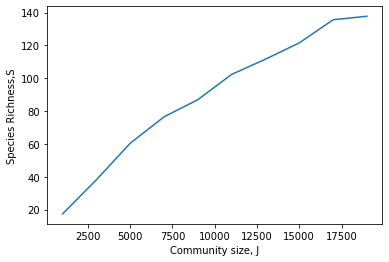

In [8]:
plt.plot(J_values,mr)
plt.ylabel('Species Richness,S')
plt.xlabel('Community size, J')

In [9]:
combination

(0.7395056279333407, 0.3578769233579647, 1.1606947753462955)

In [23]:
import pandas as pd

# Initialize an empty list to store the lengths of lists associated with each key
lengths_list = []

# Iterate through each dictionary
for d in rich:
    # Initialize a dictionary to store lengths for each key
    lengths_dict = {}
    
    # Iterate through the keys and their associated lists
    for key, value in d.items():
        lengths_dict[key] = len(value)
    
    # Append the lengths as a dictionary to the lengths_list
    lengths_list.append(lengths_dict)

# Create a DataFrame from the list of dictionaries
df = pd.DataFrame(lengths_list)

# Transpose the DataFrame
transposed_df = df.transpose()  # or df.T

# Display the transposed DataFrame
print(transposed_df)


        0    1    2    3    4    5    6    7    8    9
0     100  100  100  100  100  100  100  100  100  100
1     100  100  100  100  100  100  100  100  100  100
2      91   98   99  100  100  100  100  100  100  100
3      87   96   99   98  100  100  100   99  100  100
4      86   96   98   98  100  100  100   99  100  100
...   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...
1795   24   33   50   68   74  105  117  126  139  132
1796   21   35   49   68   73  105  115  123  142  134
1797   21   34   49   71   73  103  118  123  141  132
1798   22   34   47   70   75  106  118  122  140  132
1799   23   34   47   72   76  106  119  121  141  132

[1800 rows x 10 columns]


In [19]:
transposed_df.columns


RangeIndex(start=0, stop=10, step=1)

In [24]:
J_values = {'0': 'J_1000', '1':"J_3000", '2':'J_5000','3':"J_7000",'4':'J_9000','5':'J_11000','6':'J_13000','7':'J_15000','8':'J_17000','8':'J_19000'}  # Add more values as needed


In [22]:
df_J_values1

In [25]:
transposed_df.rename(columns=J_values, inplace =True)
#df_J_values1.to_excel("data_J_values_richness.xlsx",index=False)

In [31]:
transposed_df.columns=[J_values.get(col,col) for col in transposed_df.columns]
transposed_df.to_excel("data_J_values_richness1.xlsx",index=False)

In [9]:
J=[1000,3000,5000,8000,11000,13000,15000,20000]
Species_rich = []
Mean_rich = []
for i in J:
    Species_rich.append(J_values(i)[1])
    Mean_rich.append(J_values(i)[0])
    

Elapsed time: 0.9866971969604492 seconds
Elapsed time: 0.8498156070709229 seconds
Elapsed time: 0.7180643081665039 seconds
Elapsed time: 0.7964432239532471 seconds
Elapsed time: 0.8223674297332764 seconds
Elapsed time: 0.7821042537689209 seconds
Elapsed time: 0.7687060832977295 seconds
Elapsed time: 0.8831167221069336 seconds
Elapsed time: 0.7248597145080566 seconds
Elapsed time: 0.8252294063568115 seconds
Elapsed time: 0.7268979549407959 seconds
Elapsed time: 1.1980311870574951 seconds
Elapsed time: 0.7302379608154297 seconds
Elapsed time: 0.820235013961792 seconds
Elapsed time: 0.8151068687438965 seconds
Elapsed time: 0.8965182304382324 seconds


In [15]:
type(cp1)

dict

In [16]:
# Save the DataFrame to an Excel file
#cp1.to_excel('cp_det.xlsx', index=False, sheet_name='Sheet1')

cp_det = cp1
trait_det= trait
Abund_det = Abund
ri_det=ri
aij_det=aij

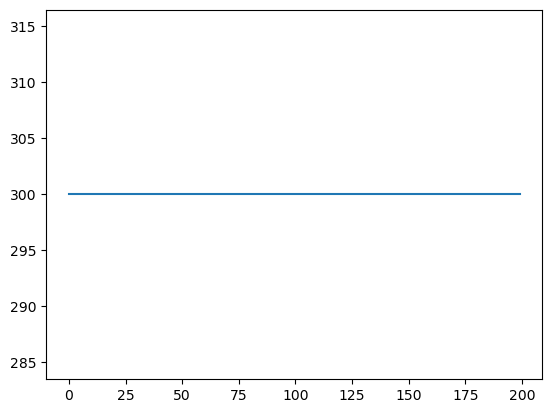

In [113]:
plt.plot(richness[:200])

In [38]:
final_df.to_excel('dynamics_sample2_data.xlsx', index=False)

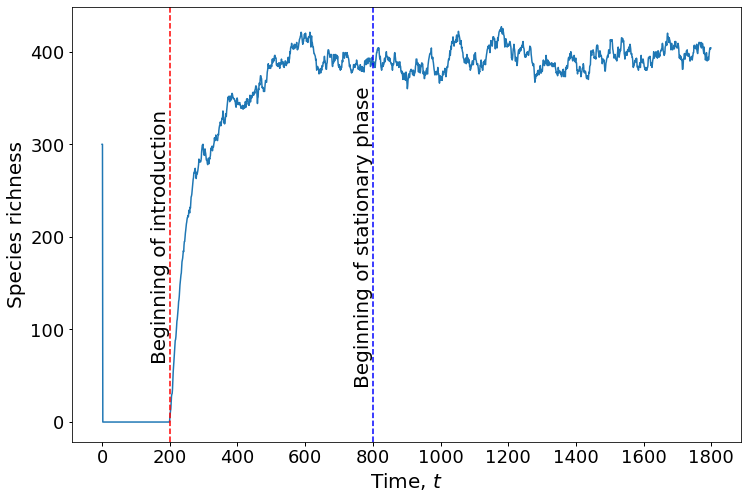

In [42]:
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called fina_df

# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 8))

# Add text along a vertical line
vertical_x = 200
vertical_text = 'Beginning of introduction'

# Plot the data from the column
ax.plot(final_df['Richness_0'])

# Add vertical lines at values 200 and 800
ax.axvline(x=20, color='red', linestyle='--')
ax.axvline(x=80, color='blue', linestyle='--')

# Set x-axis ticks
ax.set_xticks(range(0, 180 + 1, 200))

# Set labels for x-axis and y-axis
ax.set_xlabel('Time, $t$', fontsize=20)
ax.set_ylabel('Species richness', fontsize=20)

# Add text labels
ax.text(vertical_x, 19, vertical_text, rotation=90, va='center', ha='right', fontsize=20)
ax.text(179, 200, 'Beginning of stationary phase', rotation=90, va='center', ha='right', fontsize=20)

# Increase the font size of the tick labels
#ax.tick_params(axis='both', labelsize=20)
# Increase the font size of the tick labels
ax.tick_params(axis='both', labelsize=18)

# Bolden the tick labels
ax.xaxis.set_tick_params(which='both', width=1)
ax.yaxis.set_tick_params(which='both', width=1)

# Save the plot as a PNG image
plt.savefig('local_com.png', dpi=900)

# Show the plot
plt.show()


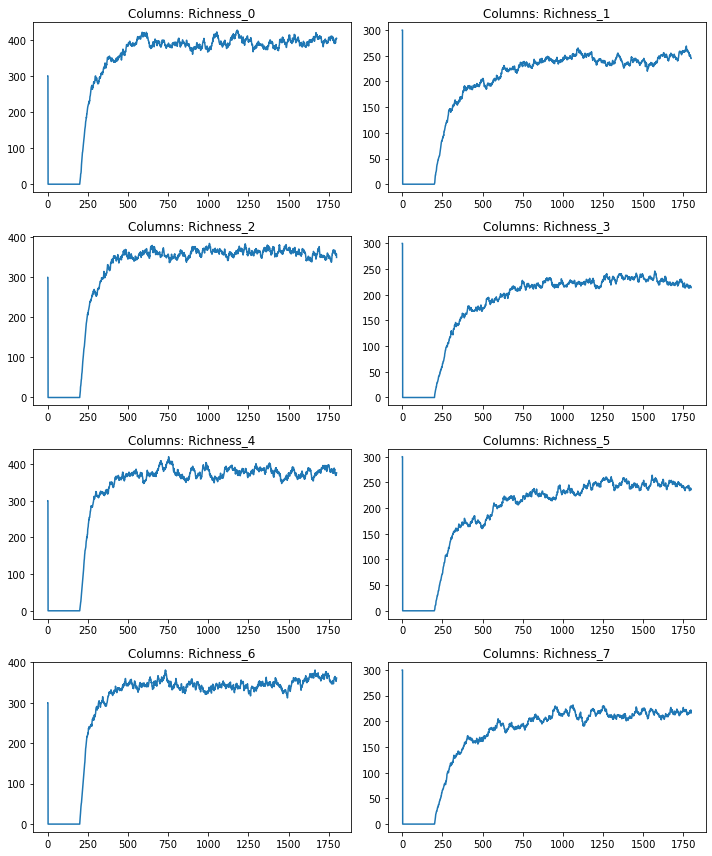

In [32]:
import matplotlib.pyplot as plt

# Assuming you have two DataFrames: df1 and df2

# Create a figure with subplots
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 12))

# Iterate over the subplot positions
for i, ax in enumerate(axs.flat):
    # Get the column pair indices
    col_index = i % len(df_3.columns)
    row_index = i // len(final_df.columns)

    # Get the column names
    column1 = final_df.columns[col_index]
    #column2 = final_df.columns[col_index]

    # Plot the data from df1 and df2 in the corresponding subplot
    ax.plot(final_df[column1])

    # Set subplot title
    ax.set_title(f'Columns: {column1}')

# Adjust the layout of subplots
plt.tight_layout()

# Show the plot
plt.show()


In [33]:
ax.xaxis.set_tick_params?

JupyterRequireError: buttons.colvis: Timeout. Library 'buttons.colvis' is not loaded.

JupyterRequireError: notebook/js/codecell: Timeout. Library 'notebook/js/codecell' is not loaded.

JupyterRequireError: buttons.colvis: Timeout. Library 'buttons.colvis' is not loaded.

In [109]:
import pandas as pd


def species_(list_of_dicts):
    # Create a DataFrame
    df = pd.DataFrame({idx: [len(value) for value in values.values()] for idx, values in enumerate(list_of_dicts)})
    
    return df
cp= species_(cp1)
cp

AttributeError: 'int' object has no attribute 'values'